# Script to Perform Exploratory Data Analysis for IRA Krill Project

In [1]:
#import standard packages
import datetime
from datetime import date
import logging
import os
from argparse import ArgumentDefaultsHelpFormatter, ArgumentParser, Namespace
from functools import reduce
import glob
import matplotlib.patches as patches
import calendar

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import dask
import dask.dataframe as dd
import tqdm

#import spatial packages
import geopandas as gpd
import matplotlib as mpl
import matplotlib.dates as mdates
import matplotlib.patheffects as pe
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter
from matplotlib.category import UnitData
import numpy as np
import pandas as pd
import rioxarray as rio
import seaborn as sns
import xarray as xr
from cartopy.mpl.ticker import LatitudeFormatter, LongitudeFormatter
from dask.distributed import Client
import flox.xarray

#import statistical packages
from scipy.stats import linregress
from shapely.geometry import Point, mapping
from sklearn.metrics import mean_squared_error
from scipy.stats import pearsonr

#import spatial packages
import geopandas as gpd
# gpd.io.file.fiona.drvsupport.supported_drivers['LIBKML'] = 'rw'
import shapely 
import rioxarray as rio
from shapely.geometry import mapping
from shapely.geometry import Point, LineString

#time packages
from astral import LocationInfo
from astral.sun import sun
from datetime import datetime, timezone
from dateutil import tz
abc = tz.gettz('US/Pacific') #set default time zone

import warnings
warnings.filterwarnings('ignore')

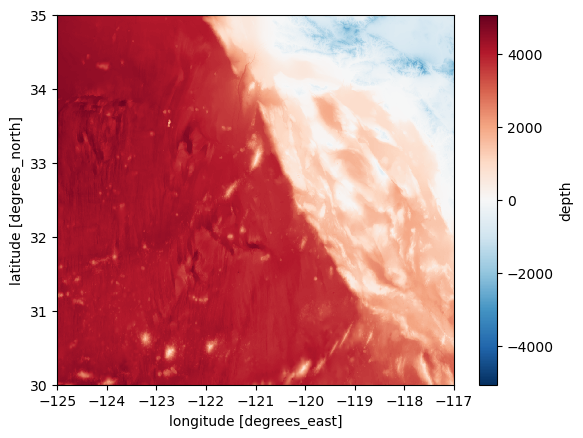

In [2]:
#open chlorophyll data
depth = xr.open_dataset('/Users/gammonkoval/Documents/GitHub/gammon_sol/IRA_Krill/data/GEBCO_18_Oct_2024_72503139a832/gebco_2024_n35.0_s30.0_w-125.0_e-117.0.nc')
depth.close()

#flip the sign of depth
depth = depth.assign(depth = depth.elevation * -1).drop('elevation')

#remove all values above 0
depth.depth.plot()

In [3]:
#open distance from shore
dist_shore = xr.open_dataset('/Users/gammonkoval/Documents/LargeData/GMT_intermediate_coast_distance_01d/GMT_intermediate_coast_distance_01d.tif')
dist_shore.close()
dist_shore#.band_data.plot()

<xarray.Dataset> Size: 3GB
Dimensions:      (band: 1, x: 36000, y: 18000)
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 288kB -180.0 -180.0 -180.0 ... 180.0 180.0 180.0
  * y            (y) float64 144kB 90.0 89.98 89.98 ... -89.97 -89.98 -90.0
    spatial_ref  int64 8B ...
Data variables:
    band_data    (band, y, x) float32 3GB ...

### Krill Data

In [24]:
###Open Krill data
files = glob.glob('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/calcofi/ZooScan/*.csv')
files = [x for x in files if "combined" not in x]

#open all files at once
krill = pd.concat((pd.read_csv(f, skiprows = 2) for f in files), ignore_index=True)

#add time column to match calcofi data
krill['DateTime'] = pd.to_datetime(krill['Station date'] + ' ' + krill['Local time (PST)'])
krill['station'] = krill['Line']
krill['line'] = krill['Station']

krill = krill.drop(['Line', 'Station'], axis = 1)
krill

,Cruise,Cruise mid-date,Station date,Local time (PST),Day or Night,appendicularia Estimated C Biomass (mgC m-2),bryozoan_larvae Abundance (No. per m2),bryozoan_larvae Estimated C Biomass (mgC m-2),chaetognatha Abundance (No. per m2),chaetognatha Estimated C Biomass (mgC m-2),...,pteropoda Estimated C Biomass (mgC m-2),pyrosomes Abundance (No. per m2),pyrosomes Estimated C Biomass (mgC m-2),rhizaria Abundance (No. per m2),rhizaria Estimated C Biomass (mgC m-2),salps Abundance (No. per m2),salps Estimated C Biomass (mgC m-2),DateTime,station,line
0,200507NH,2005-07-07,2005-07-08,06:39,71795.61,340.78,744.00,1.05,1859.99,92.15,...,54.20,0.00,0.00,13019.93,5.16,0.00,0.00,2005-07-08 06:39:00,30.0,90.0
1,200511NH,2005-11-08,2005-11-12,05:41,9176.54,51.73,14564.32,10.20,9653.84,175.97,...,43.15,0.00,0.00,2091.53,0.91,0.00,0.00,2005-11-12 05:41:00,30.0,90.0
2,200602JD,2006-02-09,2006-02-12,23:50,7555.84,47.89,7895.92,6.21,4493.87,77.74,...,0.35,0.00,0.00,358.91,0.11,0.00,0.00,2006-02-12 23:50:00,30.0,90.0
3,200604NH,2006-04-07,2006-04-10,00:53,48401.75,366.22,46022.65,62.87,6062.92,186.48,...,3.71,0.00,0.00,5955.87,2.84,0.00,0.00,2006-04-10 00:53:00,30.0,90.0
4,200607NH,2006-07-14,2006-07-16,14:07,4529.65,13.64,13259.16,13.16,3355.55,41.06,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2006-07-16 14:07:00,30.0,90.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1993,202304SH,2023-03-31,2023-04-06,21:18,22060.58,55.87,468.12,0.91,3825.28,40.61,...,31.19,12151.07,60.43,17582.11,21.82,0.00,0.00,2023-04-06 21:18:00,28.0,90.0
1994,202307SR,2023-07-09,2023-07-11,17:55,8155.54,63.54,0.00,0.00,2306.34,16.31,...,1.51,115.78,138.20,4821.08,5.34,0.00,0.00,2023-07-11 17:55:00,28.0,90.0
1995,202311SR,2023-11-10,2023-11-12,07:59,9375.00,30.78,2922.08,2.50,2181.82,32.74,...,2.76,0.00,0.00,2678.57,5.55,0.00,0.00,2023-11-12 07:59:00,28.0,90.0
1996,202401RL,2024-01-24,2024-01-26,19:05,9468.03,27.68,538.83,0.47,1235.46,2.76,...,15.24,0.00,0.00,2463.23,1.72,153.95,0.19,2024-01-26 19:05:00,28.0,90.0


In [25]:
###Open CalCOFI Metadata
calcofi = pd.read_html('https://coastwatch.pfeg.noaa.gov/erddap/tabledap/erdCalCOFIstns.htmlTable?cruise%2Cship%2Cship_code%2Corder_occupied%2Ctime%2Clatitude%2Clongitude%2Cline%2Cstation%2Cbottom_depth%2Ctemperature&time%3E=1953-07-17T00%3A26%3A00Z')[1]

#reset the multilevel index column names
calcofi.columns = calcofi.columns.droplevel(1)

#convert the time to date
calcofi['Cruise_DateTime'] = pd.to_datetime(calcofi['time'], format = '%Y-%m-%dT%H:%M:%SZ')

#rename columns to match krill
calcofi = calcofi.rename({'cruise':'Cruise'}, axis = 1)

#combine cruise and shipcode
calcofi['Cruise'] = calcofi['Cruise'].astype(str) + calcofi['ship_code']
calcofi

,Cruise,ship,ship_code,order_occupied,time,latitude,longitude,line,station,bottom_depth,temperature,Cruise_DateTime
0,195307CR,CREST,CR,33,1953-07-17T00:26:00Z,34.133330,-119.566666,83.3,43.0,NaN,NaN,1953-07-17 00:26:00
1,197712JD,DAVID STARR JORDAN,JD,1,1977-12-08T20:40:00Z,29.408333,-115.225000,113.3,29.0,26.0,19.3,1977-12-08 20:40:00
2,197712JD,DAVID STARR JORDAN,JD,2,1977-12-08T22:10:00Z,29.366667,-115.300000,113.3,30.0,53.0,19.2,1977-12-08 22:10:00
3,197712JD,DAVID STARR JORDAN,JD,3,1977-12-09T00:35:00Z,29.195000,-115.631670,113.3,35.0,1189.0,18.5,1977-12-09 00:35:00
4,197712JD,DAVID STARR JORDAN,JD,4,1977-12-09T04:25:00Z,29.033333,-115.950000,113.3,40.0,1737.0,19.0,1977-12-09 04:25:00
...,...,...,...,...,...,...,...,...,...,...,...,...
32109,202404SH,BELL M. SHIMADA,SH,112,2024-04-18T15:23:00Z,36.613335,-125.770000,60.0,90.0,4501.0,13.5,2024-04-18 15:23:00
32110,202404SH,BELL M. SHIMADA,SH,113,2024-04-18T22:11:00Z,36.946667,-125.051670,60.0,80.0,4292.0,13.7,2024-04-18 22:11:00
32111,202404SH,BELL M. SHIMADA,SH,114,2024-04-19T04:15:00Z,37.280000,-124.331665,60.0,70.0,3996.0,13.2,2024-04-19 04:15:00
32112,202404SH,BELL M. SHIMADA,SH,115,2024-04-19T10:02:00Z,37.615000,-123.608330,60.0,60.0,3296.0,11.4,2024-04-19 10:02:00


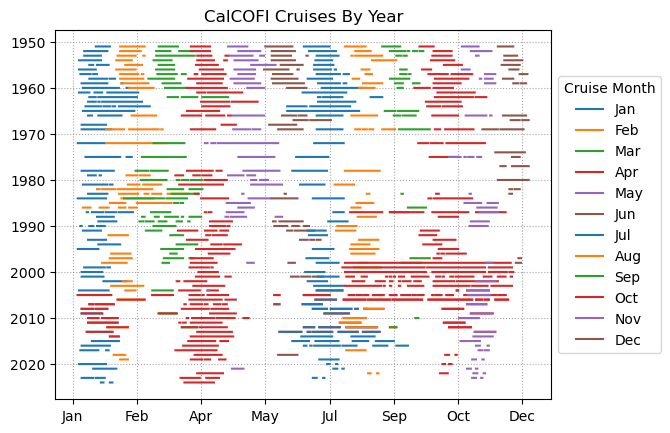

In [39]:
###Time of Year CalCOFI Cruise Figure
files = glob.glob('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/calcofi/ZooScan/*.csv')
files = [x for x in files if "combined" not in x]
krill = pd.concat((pd.read_csv(f, skiprows = 2) for f in files), ignore_index=True)
krill['DateTime'] = pd.to_datetime(krill['Cruise mid-date'] + ' ' + krill['Local time (PST)'])
krill['station'] = krill['Line']
krill['line'] = krill['Station']
krill = krill.drop(['Line', 'Station'], axis = 1)
test = krill.merge(calcofi, how = 'outer', on = ['Cruise', 'line', 'station'])
test['Cruise_DateTime'] = test['Cruise_DateTime'].fillna(test['DateTime'])

biovol = pd.read_csv('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/calcofi/195101-201607_1701-1704_1802-1804_Zoop_BioVolume.csv', parse_dates = ['Tow_Date'])
biovol['Cruise'] = biovol['Cruise'].astype(str) + biovol['Ship_Code']
biovol = biovol.rename({'St_Station':'station', 'St_Line':'line'}, axis = 1)

test = test.merge(biovol[['Cruise', 'station', 'line', 'Tow_Date']], how = 'outer', on = ['Cruise', 'line', 'station'])
test['Cruise_DateTime'] = test['Cruise_DateTime'].fillna(test['Tow_Date'])

cruise_time = test.copy()

# cruise_time = test[test['Cruise_DateTime'].dt.year >= 1977]
cruise_time['date'] = cruise_time['Cruise_DateTime'].dt.date
cruise_time['date'] = pd.to_datetime(cruise_time['date'])
cruise_time = cruise_time.groupby(['Cruise', 'date']).mean(numeric_only = True).reset_index(['Cruise'])

time_list = pd.date_range('1951-01-18', '2024-05-01', freq = '1D')
cruise_time_reindex = pd.DataFrame()
for cruise in cruise_time['Cruise'].unique():
    temp = cruise_time[cruise_time['Cruise'] == cruise]
    temp = temp.reindex(time_list)
    cruise_time_reindex = pd.concat([cruise_time_reindex, temp])

cruise_time = cruise_time_reindex.dropna(subset = 'Cruise')
cruise_time['year'] = cruise_time.index.astype(str).str[0:4].astype(int)
cruise_time['jdate'] = cruise_time.index.strftime('%j')
cruise_time['Cruise'] = cruise_time['Cruise'].str[:6].astype(int)


cruise_update = pd.DataFrame()

for cruise in cruise_time['Cruise'].dropna().unique().astype(int):
    
    try: 
        temp = cruise_time[cruise_time['Cruise'] == cruise]

        min_date = temp.index.min()
        max_date = temp.index.max()

        date_list = pd.date_range(min_date, max_date, freq = '1D').to_frame()
        date_list['cruise_update'] = cruise            

        cruise_update = pd.concat([cruise_update, date_list])
        
    except:
        continue

cruise_update = cruise_update.drop(0, axis = 1)
cruise_time = cruise_time.join(cruise_update, how = 'left')

cruise_time['cruise_month'] = cruise_time['cruise_update'].astype(str).str[4:]
cruise_time['cruise_month'] = pd.to_numeric(cruise_time['cruise_month'], errors='coerce')
# cruise_time['jdate'] = np.where(cruise_time['cruise_month'] >= 6, np.nan, cruise_time['jdate'])
cruise_time['jdate'] = pd.to_numeric(cruise_time['jdate'], errors='coerce')

cruise_time['jdate'] = np.where(cruise_time['cruise_update'].isna(), np.nan, cruise_time['jdate'])
cruise_time['jdate'] = pd.to_numeric(cruise_time['jdate'], errors='coerce')
# fig, ax = plt.subplots(1, 1, figsize = (6, 2.75))
ax = plt.subplot()

# for month, col in zip(np.sort(cruise_time['cruise_month'].dropna().unique()), ['#e41a1c', '#377eb8', '#4daf4a', '#984ea3', '#ff7f00', '#e7298a', 
#                                                                                '#e41a1c', '#377eb8', '#4daf4a', '#984ea3', '#ff7f00', '#e7298a']):
for month, col in zip(np.sort(cruise_time['cruise_month'].dropna().unique()), ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'tab:brown',
                                                                               'tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'tab:brown']):

    temp = cruise_time[cruise_time['cruise_month'] == month][['jdate', 'year']]
    temp = temp.drop_duplicates().reindex(time_list)

    ax.plot(temp.jdate, temp.year, label = calendar.month_abbr[int(month)], color = col)
    
# ax.set_xticks([1, 32, 60, 91, 121, 152, 182, 213, 244, 274, 305, 335])
# ax.set_xlim([-8, 170])
# ax.set_ylim(2016.5, 2023.5)
ax.legend(title = 'Cruise Month', loc = 'center left', bbox_to_anchor = (1.0, 0.5))
ax.xaxis.set_major_formatter(DateFormatter('%b'))
ax.grid(linestyle = 'dotted', color = 'grey', alpha = 0.7)
ax.set_title('CalCOFI Cruises By Year')
ax.invert_yaxis()
# ax.set_facecolor('whitesmoke')
plt.savefig('./CruiseTOY.png', dpi = 600, transparent=False, facecolor='white', bbox_inches = 'tight')

In [28]:
###Join Data Together 
#join data with cruise reports
krill_comb = krill.merge(calcofi, how = 'left', on = ['Cruise', 'line', 'station'])
krill_comb['Cruise_ID'] = krill_comb['Cruise'].str.extract('(\d+)')

#open starionary data
calcofi_station = pd.read_csv('/Users/gammonkoval/Downloads/CalCOFIStationOrder.csv')
# calcofi_station = pd.read_csv('/Users/gammonkoval/Downloads/CalCOFI_Database_194903-202105_csv_16October2023/CalCOFI_Database_194903-202105_csv_16October2023/194903-202105_Cast.csv', low_memory = False)

try:
    calcofi_station = calcofi_station.rename({'St_Station':'station', 'St_Line':'line'}, axis = 1)[['line', 'station', 'Lat_Dec', 'Lon_Dec']]
except:
    calcofi_station = calcofi_station.rename({'Sta':'station', 'Line':'line', 'Lat (dec)':'Lat_Dec', 'Lon (dec)':'Lon_Dec'}, axis = 1)[['line', 'station', 'Lat_Dec', 'Lon_Dec']]

calcofi_station = calcofi_station.drop_duplicates()

#join with stationary calcofi stations
krill_comb = krill_comb.merge(calcofi_station, how = 'left', on = ['line', 'station'])

#fill nas form cruise reports
krill_comb['latitude'] = krill_comb['latitude'].fillna(krill_comb['Lat_Dec'])
krill_comb['longitude'] = krill_comb['longitude'].fillna(krill_comb['Lon_Dec'])
krill_comb = krill_comb.drop(['Lat_Dec', 'Lon_Dec'], axis = 1)

#add sunrise and sunset 
sunrise = []
sunset = []
for i in range(len(krill_comb)):
    
    l = LocationInfo('Los Angles', 'US', 'US/Pacific', krill_comb.iloc[i]['latitude'], krill_comb.iloc[i]['longitude'])
    s = sun(l.observer, date=pd.to_datetime(krill_comb.iloc[i]['DateTime'].strftime('%Y-%m-%d')))
    
    sunrise.append(s["sunrise"].replace(tzinfo=timezone.utc).astimezone(tz=abc))
    sunset.append(s["sunset"].replace(tzinfo=timezone.utc).astimezone(tz=abc))

krill_comb['sunrise'] = sunrise
krill_comb['sunset'] = sunset

#convert to day and night
krill_comb['Hours'] = krill_comb['DateTime'].dt.strftime('%H:%M:%S')
krill_comb['sunrise'] = krill_comb['sunrise'].dt.strftime('%H:%M:%S')
krill_comb['sunset'] = krill_comb['sunset'].dt.strftime('%H:%M:%S')

krill_comb['Hours'] = pd.to_datetime(krill_comb['Hours'], format='%H:%M:%S')
krill_comb['sunrise'] = pd.to_datetime(krill_comb['sunrise'], format='%H:%M:%S')
krill_comb['sunset'] = pd.to_datetime(krill_comb['sunset'], format='%H:%M:%S')

krill_comb['Day_Night'] = "Night"
krill_comb.loc[(krill_comb['Hours'] > krill_comb['sunrise']) & (krill_comb['Hours'] < krill_comb['sunset']), 'Day_Night'] = "Day"

#add in distance from shore and depth from bathymetry
depth_list = []
dist_shore_list = []

for i in range(len(krill_comb)):
    depth_list.append(float(depth.interp(lat = krill_comb.iloc[i]['latitude'], lon = krill_comb.iloc[i]['longitude']).depth.values))
    dist_shore_list.append(float(dist_shore.interp(y = krill_comb.iloc[i]['latitude'], x = krill_comb.iloc[i]['longitude']).band_data.values))

krill_comb['bathymetry'] = depth_list
krill_comb['dist_shore'] = dist_shore_list

#add in season based on JDate
krill_comb['jdate'] = krill_comb['DateTime'].dt.strftime('%j').astype(int)
krill_comb['season'] = np.nan
krill_comb['season'] = np.where((krill_comb['jdate'] >= 8) & (krill_comb['jdate'] <= 42), 'Winter', krill_comb['season'])
krill_comb['season'] = np.where((krill_comb['jdate'] >= 81) & (krill_comb['jdate'] <= 119), 'Spring', krill_comb['season'])
krill_comb['season'] = np.where((krill_comb['jdate'] >= 185) & (krill_comb['jdate'] <= 233), 'Summer', krill_comb['season'])
krill_comb['season'] = np.where((krill_comb['jdate'] >= 292) & (krill_comb['jdate'] <= 325), 'Fall', krill_comb['season'])

krill_comb = krill_comb.drop(['Hours', 'sunrise', 'sunset', 'jdate'], axis = 1).drop_duplicates()
krill_comb.to_csv('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/calcofi/ZooScan/ZooScan_combined.csv', index = False)
krill_comb

,Cruise,Cruise mid-date,Station date,Local time (PST),Day or Night,appendicularia Estimated C Biomass (mgC m-2),bryozoan_larvae Abundance (No. per m2),bryozoan_larvae Estimated C Biomass (mgC m-2),chaetognatha Abundance (No. per m2),chaetognatha Estimated C Biomass (mgC m-2),...,latitude,longitude,bottom_depth,temperature,Cruise_DateTime,Cruise_ID,Day_Night,bathymetry,dist_shore,season
0,200507NH,2005-07-07,2005-07-08,06:39,71795.61,340.78,744.00,1.05,1859.99,92.15,...,33.418330,-117.905000,618.0,18.2,2005-07-07 14:34:00,200507,Day,619.239520,16.667000,Summer
1,200511NH,2005-11-08,2005-11-12,05:41,9176.54,51.73,14564.32,10.20,9653.84,175.97,...,33.418330,-117.903336,621.0,18.0,2005-11-10 21:31:00,200511,Night,623.551969,16.556011,Fall
2,200602JD,2006-02-09,2006-02-12,23:50,7555.84,47.89,7895.92,6.21,4493.87,77.74,...,33.415000,-117.906670,611.0,15.2,2006-02-10 06:43:00,200602,Night,615.385120,17.167000,nan
3,200604NH,2006-04-07,2006-04-10,00:53,48401.75,366.22,46022.65,62.87,6062.92,186.48,...,33.421665,-117.906670,621.0,13.8,2006-04-08 10:40:00,200604,Night,618.022280,16.500500,Spring
4,200607NH,2006-07-14,2006-07-16,14:07,4529.65,13.64,13259.16,13.16,3355.55,41.06,...,33.416664,-117.913330,707.0,22.5,2006-07-14 20:47:00,200607,Day,606.354687,17.666600,Summer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2008,202304SH,2023-03-31,2023-04-06,21:18,22060.58,55.87,468.12,0.91,3825.28,40.61,...,33.483334,-117.770000,200.0,13.8,2023-04-01 04:58:00,202304,Night,96.746080,2.583300,Spring
2009,202307SR,2023-07-09,2023-07-11,17:55,8155.54,63.54,0.00,0.00,2306.34,16.31,...,33.484620,-117.768080,NaN,NaN,NaT,202307,Day,75.174150,2.334296,Summer
2010,202311SR,2023-11-10,2023-11-12,07:59,9375.00,30.78,2922.08,2.50,2181.82,32.74,...,33.484620,-117.768080,NaN,NaN,NaT,202311,Day,75.174150,2.334296,Fall
2011,202401RL,2024-01-24,2024-01-26,19:05,9468.03,27.68,538.83,0.47,1235.46,2.76,...,33.484620,-117.768080,NaN,NaN,NaT,202401,Night,75.174150,2.334296,Winter


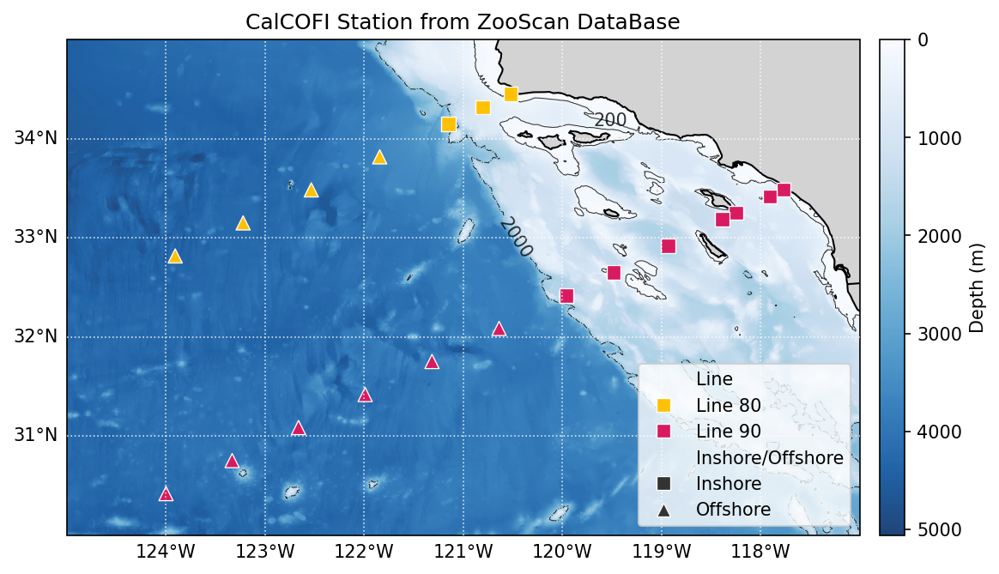

In [71]:
#Stationary Map of CalCOFI data
line_station = krill_comb.groupby(['line', 'station', 'bathymetry']).size().reset_index().groupby(['line', 'station']).mean().reset_index()
calcofi_sel = calcofi_station.merge(line_station, how = 'outer').dropna(subset = 0)

#add inshore/offshore
calcofi_sel['Inshore/Offshore'] = np.where(calcofi_sel['bathymetry'] > 2205, 'Offshore', 'Inshore')
calcofi_sel['Line'] = 'Line ' + calcofi_sel['line'].astype(int).astype(str)

depth = xr.open_dataset('./data/GEBCO_18_Oct_2024_72503139a832/gebco_2024_n35.0_s30.0_w-125.0_e-117.0.nc')
depth.close()
depth['elevation_inv'] = depth.elevation * -1
depth['elevation_inv'] = xr.where(depth.elevation_inv < 0, np.nan, depth.elevation_inv)

latr = [30, 35] 
lonr = [-125, -117] 

# Select a region of our data, giving it a margin
margin = 0.0
region = np.array([[latr[0]-margin,latr[1]+margin],[lonr[0]-margin,lonr[1]+margin]]) 

#add state outlines
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')

# Create and set the figure context
fig = plt.figure(figsize=(10,5), dpi = 150) 
ax = plt.axes(projection=ccrs.PlateCarree()) 

ax.coastlines(resolution='10m',linewidth=1,color='black', zorder = 3) 
ax.add_feature(cfeature.LAND, color='lightgrey', alpha=1)
ax.add_feature(states_provinces, linewidth = 0.5)
ax.add_feature(cfeature.BORDERS)
# ax.set_xticks(np.round([*np.arange(-180, 180,1)],0), crs=ccrs.PlateCarree()) 
# ax.set_yticks(np.round([*np.arange(-90, 90)],1), crs=ccrs.PlateCarree()) 
ax.set_extent([region[1,0],region[1,1],region[0,0],region[0,1]],crs=ccrs.PlateCarree()) 
gl = ax.gridlines(linestyle = 'dotted', color = 'white', alpha = 0.8, zorder = 5, draw_labels=True, y_inline = False)
gl.xlabels_top = False
gl.ylabels_right = False
ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

# ax.scatter(calcofi_sel.loc[(calcofi_sel['line'] == 80) & (calcofi_sel['on_off'] == 'inshore'), 'Lon_Dec'], 
#            calcofi_sel.loc[(calcofi_sel['line'] == 80) & (calcofi_sel['on_off'] == 'inshore'), 'Lat_Dec'], 
#            c = 'tab:green', transform = ccrs.PlateCarree(), zorder = 5, label = 'Line 80 - Inshore', edgecolor = 'w', lw = 1, s = 50, marker = '^')
# ax.scatter(calcofi_sel.loc[(calcofi_sel['line'] == 80) & (calcofi_sel['on_off'] == 'offshore'), 'Lon_Dec'], 
#            calcofi_sel.loc[(calcofi_sel['line'] == 80) & (calcofi_sel['on_off'] == 'offshore'), 'Lat_Dec'], 
#            c = 'tab:red', transform = ccrs.PlateCarree(), zorder = 5, label = 'Line 80 - Offshore', edgecolor = 'w', lw = 1, s = 50, marker = '^')

# ax.scatter(calcofi_sel.loc[(calcofi_sel['line'] == 90) & (calcofi_sel['on_off'] == 'inshore'), 'Lon_Dec'], 
#            calcofi_sel.loc[(calcofi_sel['line'] == 90) & (calcofi_sel['on_off'] == 'inshore'), 'Lat_Dec'], 
#            c = 'tab:green', transform = ccrs.PlateCarree(), zorder = 5, label = 'Line 90 - Inshore', edgecolor = 'w', lw = 1, s = 50, marker = 's')
# ax.scatter(calcofi_sel.loc[(calcofi_sel['line'] == 90) & (calcofi_sel['on_off'] == 'offshore'), 'Lon_Dec'], 
#            calcofi_sel.loc[(calcofi_sel['line'] == 90) & (calcofi_sel['on_off'] == 'offshore'), 'Lat_Dec'], 
#            c = 'tab:red', transform = ccrs.PlateCarree(), zorder = 5, label = 'Line 90 - Offshore', edgecolor = 'w', lw = 1, s = 50, marker = 's')
sns.scatterplot(data=calcofi_sel, x='Lon_Dec', y='Lat_Dec', hue='Line', style='Inshore/Offshore', ax = ax, zorder = 5, alpha = 1,
                palette={'Line 80':"#FFC107", 'Line 90':"#D81B60"}, markers=['s', '^'], s = 63)
sns.move_legend(ax, loc='lower right')
# ax.legend(loc = 'upper right')

CS = depth.elevation_inv.plot(ax = ax, x = 'lon', transform = ccrs.PlateCarree(), vmin = 0, cmap = 'Blues', add_colorbar = False, zorder = 0, alpha = 0.9)#cbar_kwargs = {'pad':0.02, 'label':'Depth (m)')
cbar = plt.colorbar(CS, pad = 0.02, label = 'Depth (m)')
cbar.ax.invert_yaxis()
# dist_shore.sel(x = slice(-125, -117), y = slice(35, 30)).band_data.plot(ax = ax, x = 'x', vmin = 0, vmax = 100, cmap = 'jet', transform = ccrs.PlateCarree(), zorder = 0, alpha = 0.5)#vmin = 0, cmap = 'Blues', add_colorbar = False, zorder = 0, alpha = 0.9)#cbar_kwargs = {'pad':0.02, 'label':'Depth (m)')


#add bathymetry line
positions = [(-119.5, 34.25)]
CS = depth.where((depth.elevation >= -400) & (depth.elevation <= 0), drop = True).elevation_inv.plot.contour(x = 'lon', ax = ax, colors = 'k', levels = 1, linestyles = 'solid', transform = ccrs.PlateCarree(), linewidths = 0.5, alpha = 0.8)
ax.clabel(CS, CS.levels, inline=True, fontsize=10, manual = positions)

positions = [(-120.5, 33)]
CS = depth.where((depth.elevation >= -4000) & (depth.elevation <= 0), drop = True).elevation_inv.plot.contour(x = 'lon', ax = ax, colors = 'k', levels = 1, linestyles = 'dashdot', transform = ccrs.PlateCarree(), linewidths = 0.5, alpha = 0.8)
ax.clabel(CS, CS.levels, inline=True, fontsize=10, manual = positions)

plt.title('CalCOFI Station from ZooScan DataBase')
plt.xlabel(None)
plt.ylabel(None)
plt.gca().set_aspect('equal')
plt.savefig('./figures/ZooScan_StationaryMap.png', bbox_inches = 'tight', dpi = 300)


In [157]:
krill_comb = pd.read_csv('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/calcofi/ZooScan/ZooScan_combined.csv', parse_dates = ['DateTime'])
krill_comb

,Cruise,Cruise mid-date,Station date,Local time (PST),Day or Night,appendicularia Estimated C Biomass (mgC m-2),bryozoan_larvae Abundance (No. per m2),bryozoan_larvae Estimated C Biomass (mgC m-2),chaetognatha Abundance (No. per m2),chaetognatha Estimated C Biomass (mgC m-2),...,latitude,longitude,bottom_depth,temperature,Cruise_DateTime,Cruise_ID,Day_Night,bathymetry,dist_shore,season
0,200507NH,2005-07-07,2005-07-08,06:39,71795.61,340.78,744.00,1.05,1859.99,92.15,...,33.418330,-117.905000,618.0,18.2,2005-07-07 14:34:00,200507,Day,619.239520,16.667000,Summer
1,200511NH,2005-11-08,2005-11-12,05:41,9176.54,51.73,14564.32,10.20,9653.84,175.97,...,33.418330,-117.903336,621.0,18.0,2005-11-10 21:31:00,200511,Night,623.551969,16.556011,Fall
2,200602JD,2006-02-09,2006-02-12,23:50,7555.84,47.89,7895.92,6.21,4493.87,77.74,...,33.415000,-117.906670,611.0,15.2,2006-02-10 06:43:00,200602,Night,615.385120,17.167000,NaN
3,200604NH,2006-04-07,2006-04-10,00:53,48401.75,366.22,46022.65,62.87,6062.92,186.48,...,33.421665,-117.906670,621.0,13.8,2006-04-08 10:40:00,200604,Night,618.022280,16.500500,Spring
4,200607NH,2006-07-14,2006-07-16,14:07,4529.65,13.64,13259.16,13.16,3355.55,41.06,...,33.416664,-117.913330,707.0,22.5,2006-07-14 20:47:00,200607,Day,606.354687,17.666600,Summer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1338,202304SH,2023-03-31,2023-04-06,21:18,22060.58,55.87,468.12,0.91,3825.28,40.61,...,33.483334,-117.770000,200.0,13.8,2023-04-01 04:58:00,202304,Night,96.746080,2.583300,Spring
1339,202307SR,2023-07-09,2023-07-11,17:55,8155.54,63.54,0.00,0.00,2306.34,16.31,...,33.484620,-117.768080,NaN,NaN,NaN,202307,Day,75.174150,2.334296,Summer
1340,202311SR,2023-11-10,2023-11-12,07:59,9375.00,30.78,2922.08,2.50,2181.82,32.74,...,33.484620,-117.768080,NaN,NaN,NaN,202311,Day,75.174150,2.334296,Fall
1341,202401RL,2024-01-24,2024-01-26,19:05,9468.03,27.68,538.83,0.47,1235.46,2.76,...,33.484620,-117.768080,NaN,NaN,NaN,202401,Night,75.174150,2.334296,Winter


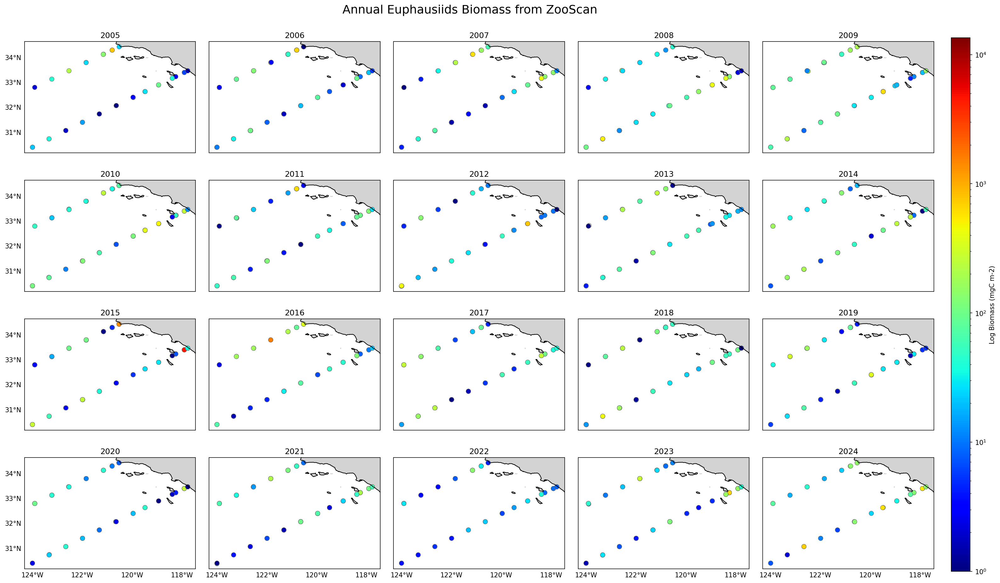

In [9]:
#make faceted plots of krill by year

fig, axs = plt.subplots(nrows=4,ncols=5,
                        subplot_kw={'projection': ccrs.PlateCarree()},
                        sharex = True, sharey = True,
                        figsize=(20, 15),
                        dpi = 150)

# axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array
axs=axs.flatten()

for year, i in zip(krill_comb.DateTime.dt.year.unique(), range(len(krill_comb.DateTime.dt.year.unique()))):
    krill_temp = krill_comb[krill_comb['DateTime'].dt.year.isin([year])]

    axs[i].coastlines(resolution='10m',linewidth=1,color='black', zorder = 3) 
    axs[i].add_feature(cfeature.LAND, color='lightgrey', alpha=1)
    # axs[i].add_feature(states_provinces, linewidth = 0.5)
    axs[i].add_feature(cfeature.BORDERS)
    # ax.set_xticks(np.round([*np.arange(-180, 180,1)],0), crs=ccrs.PlateCarree()) 
    # ax.set_yticks(np.round([*np.arange(-90, 90)],1), crs=ccrs.PlateCarree()) 
    # axs[i].set_extent([region[1,0],region[1,1],region[0,0],region[0,1]],crs=ccrs.PlateCarree()) 
    gl = axs[i].gridlines(linestyle = 'dotted', color = 'grey', alpha = 0, zorder = 10, draw_labels=True, y_inline = False)
    gl.xlabels_top = False
    gl.ylabels_right = False
    if i not in [0, 5, 10, 15]: 
        gl.ylabels_left = False
    if i < 15: 
        gl.xlabels_bottom = False

    axs[i].xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
    axs[i].yaxis.set_major_formatter(LatitudeFormatter())


    cs = axs[i].scatter(krill_temp['longitude'], krill_temp['latitude'], 
                        c = krill_temp['euphausiids Estimated C Biomass (mgC m-2)'], 
                        # norm=mpl.colors.LogNorm(vmin = 1, vmax = 131755), s = 50, cmap = 'jet', edgecolor = 'dimgrey', lw = 0.5) #Abundance
                        norm=mpl.colors.LogNorm(vmin = 1, vmax = 13510), s = 50, cmap = 'jet', edgecolor = 'dimgrey', lw = 0.5) #Biomass
    
    axs[i].set_title(str(year))

plt.tight_layout()
plt.subplots_adjust(hspace=-0.5)
plt.suptitle('Annual Euphausiids Biomass from ZooScan', fontsize = 18, y = 0.925)

#x, y, width, height
cb_ax = fig.add_axes([1.01,.124,.02,.754])
# fig.colorbar(cs,orientation='vertical',cax=cb_ax, label = 'Log Abundance (No. per m2)')
fig.colorbar(cs,orientation='vertical',cax=cb_ax, label = 'Log Biomass (mgC m-2)')
plt.savefig('./figures/ZooScan_Abundance_EPAC_biomass.png', bbox_inches = 'tight', dpi = 300, transparent=True)
plt.show()

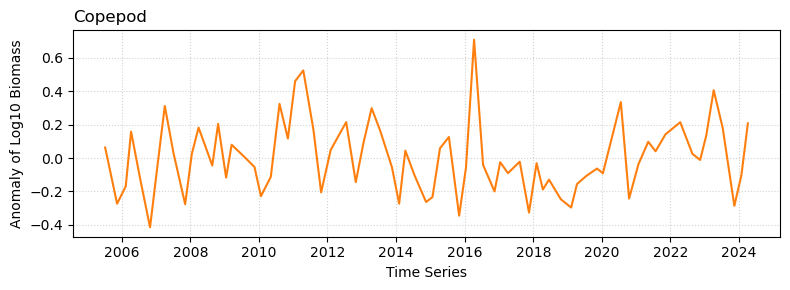

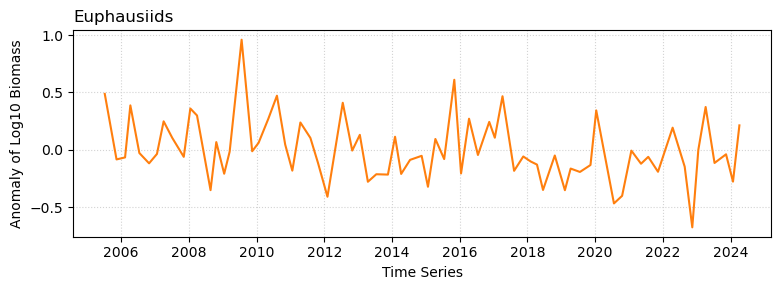

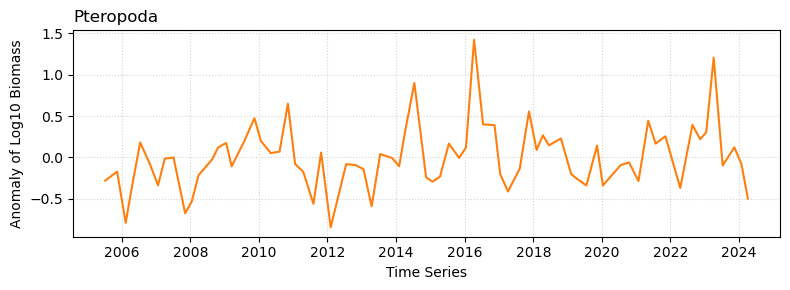

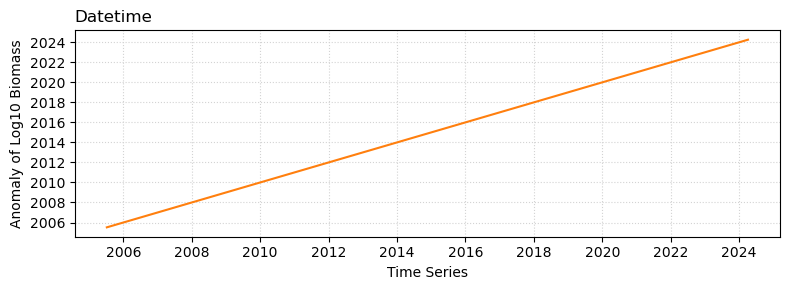

In [109]:
###Cruise Timeseries
cruise = krill_comb.copy()
cruise['copepod'] = cruise.filter(regex = 'copepod').filter(regex = 'Biomass').sum(axis = 1)
cruise = cruise.drop(['Cruise_DateTime', 'Cruise mid-date', 'Station date', 'Local time (PST)', 'ship', 'ship_code', 'time', 'Day_Night', 'season', 'Cruise_ID'], axis = 1).groupby('Cruise').mean()
cruise = cruise.rename({'pteropoda Estimated C Biomass (mgC m-2)':'pteropoda', 'euphausiids Estimated C Biomass (mgC m-2)':'euphausiids'}, axis = 1)[['copepod', 'euphausiids', 'pteropoda', 'DateTime']]

cruise['copepod'] = np.log10(cruise['copepod'] + 1)
cruise['euphausiids'] = np.log10(cruise['euphausiids'] + 1)
cruise['pteropoda'] = np.log10(cruise['pteropoda'] + 1)


cruise['copepod'] = cruise['copepod'] - cruise.mean()['copepod']
cruise['euphausiids'] = cruise['euphausiids'] - cruise.mean()['euphausiids']
cruise['pteropoda'] = cruise['pteropoda'] - cruise.mean()['pteropoda']

for i, spp in enumerate(cruise.columns):

    plt.figure(figsize = (8, 3))
    plt.plot(cruise['DateTime'], cruise[spp], c = 'tab:orange')
    plt.ylabel('Anomaly of Log10 Biomass')
    
    plt.title(spp.title(), loc = 'left')
    plt.grid(linestyle = 'dotted', color = 'lightgrey')
    
    plt.xlabel('Time Series')
    plt.tight_layout()
    plt.show()

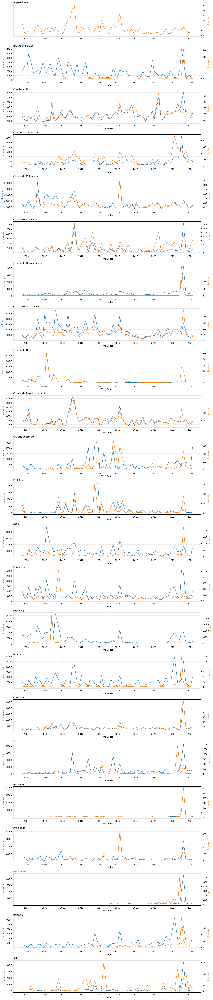

In [96]:
###Cruise Timeseries
cruise = krill.drop(['Cruise mid-date', 'Station date', 'Local time (PST)'], axis = 1).groupby('Cruise').mean()
# cruise = krill.drop(['Cruise mid-date', 'Station date', 'Local time (PST)'], axis = 1).groupby('Cruise').std()

fig, ax = plt.subplots(23, 1, figsize = (15, 70))

ax2 = ax[0].twinx()

ax2.plot(cruise['DateTime'], cruise.iloc[:, 1], c = 'tab:orange')
ax[0].set_title(cruise.iloc[:, 1].name.split(' Estimated')[0].replace('_', ' ').title(), loc = 'left')
ax2.set_ylabel('Biomass', color = 'tab:orange')
ax[0].grid(linestyle = 'dotted', color = 'lightgrey')
ax[0].get_yaxis().set_visible(False)

for i, spp in zip(range(1, 23), range(2, 46, 2)):

    ax2 = ax[i].twinx()
    
    ax[i].plot(cruise['DateTime'], cruise.iloc[:, spp])
    ax[i].set_ylabel('Abundance', color = 'tab:blue')
    ax2.plot(cruise['DateTime'], cruise.iloc[:, spp + 1], c = 'tab:orange')
    ax2.set_ylabel('Biomass', color = 'tab:orange')
    
    ax[i].set_title(cruise.iloc[:, spp ].name.split(' Abundance')[0].replace('_', ' ').title(), loc = 'left')
    ax[i].grid(linestyle = 'dotted', color = 'lightgrey')
    
    ax[i].set_xlabel('Time Series')
plt.tight_layout()
plt.savefig('./figures/ZooScan_TimeSeries.png', bbox_inches = 'tight', dpi = 300, transparent=True)

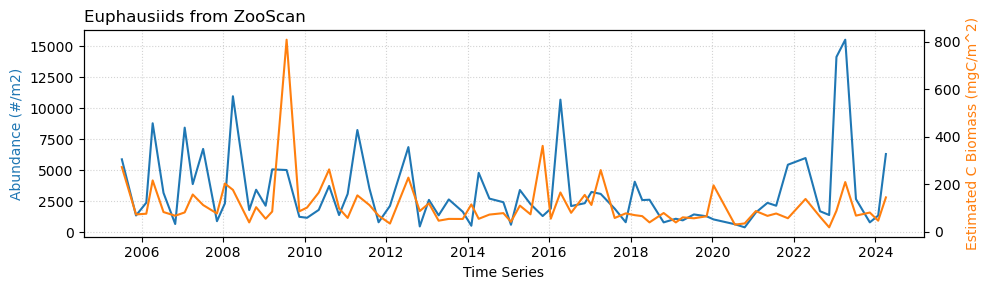

In [112]:
###EPAC Timeseries
cruise = krill_comb.drop(['Cruise_DateTime', 'Cruise mid-date', 'Station date', 'Local time (PST)', 'ship', 'ship_code', 'time', 'Day_Night', 'season', 'dist_shore_bin', 'Cruise_ID'], axis = 1).groupby('Cruise').mean()
cruise_std = krill_comb.drop(['Cruise_DateTime', 'Cruise mid-date', 'Station date', 'Local time (PST)', 'ship', 'ship_code', 'time', 'Day_Night', 'season', 'dist_shore_bin', 'Cruise_ID'], axis = 1).groupby('Cruise').std()

fig, ax = plt.subplots(1, 1, figsize = (10, 3))

ax2 = ax.twinx()

ax.plot(cruise['DateTime'], cruise['euphausiids Abundance (No. per m2)'])
# ax.fill_between(cruise['DateTime'], cruise['euphausiids Abundance (No. per m2)'] - cruise_std['euphausiids Abundance (No. per m2)'], cruise['euphausiids Abundance (No. per m2)'] + cruise_std['euphausiids Abundance (No. per m2)'],
#                 color = 'tab:blue', alpha = 0.1)
ax.set_ylabel('Abundance (#/m2)', color = 'tab:blue')
# ax.set_ylim(0, max(cruise['euphausiids Abundance (No. per m2)'] + cruise_std['euphausiids Abundance (No. per m2)']) + max(cruise['euphausiids Abundance (No. per m2)'] + cruise_std['euphausiids Abundance (No. per m2)']) * .1)

ax2.plot(cruise['DateTime'], cruise['euphausiids Estimated C Biomass (mgC m-2)'], c = 'tab:orange')
# ax2.fill_between(cruise['DateTime'], cruise['euphausiids Estimated C Biomass (mgC m-2)'] - cruise_std['euphausiids Estimated C Biomass (mgC m-2)'], cruise['euphausiids Estimated C Biomass (mgC m-2)'] + cruise_std['euphausiids Estimated C Biomass (mgC m-2)'],
#                 color = 'tab:orange', alpha = 0.1)
ax2.set_ylabel('Estimated C Biomass (mgC/m^2)', color = 'tab:orange')
# ax2.set_ylim(0, max(cruise['euphausiids Estimated C Biomass (mgC m-2)'] + cruise_std['euphausiids Estimated C Biomass (mgC m-2)']) + max(cruise['euphausiids Estimated C Biomass (mgC m-2)'] + cruise_std['euphausiids Estimated C Biomass (mgC m-2)']) * .1)


ax.set_title('Euphausiids from ZooScan', loc = 'left')
ax.grid(linestyle = 'dotted', color = 'lightgrey')

ax.set_xlabel('Time Series')
plt.tight_layout()
plt.savefig('./figures/ZooScan_TimeSeries_EPAC.png', bbox_inches = 'tight', dpi = 300, transparent=True)

In [17]:
krill_comb = krill_comb.drop_duplicates()
krill_plot = krill_comb.copy()

#filter out biomass columns
krill_plot['total_biomass'] = krill_plot.drop('multiples Estimated C Biomass (mgC m-2)', axis = 1).filter(regex='Biomass').sum(axis = 1)
krill_plot['total_biomass_log'] = np.log10(krill_plot.drop('multiples Estimated C Biomass (mgC m-2)', axis = 1).filter(regex='Biomass') + 1).sum(axis = 1)

krill_plot.loc[(krill_plot['season'] == 'Fall') & (krill_plot['total_biomass'] > 10000)][['Cruise', 'line', 'station', 'DateTime']]# = np.nan


,Cruise,line,station,DateTime
137,202211SR,90.0,35.0,2022-11-13 04:09:00


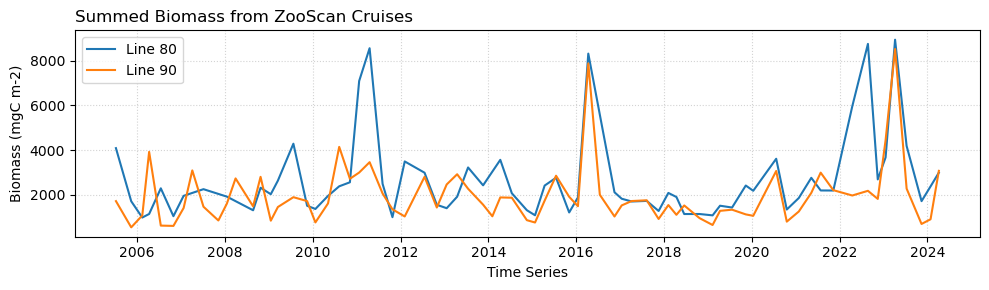

In [390]:
###Total Biomass Timeseries

krill_comb = krill_comb.drop_duplicates()
krill_plot = krill_comb.copy()
krill_plot.loc[(krill_plot['season'] == 'Fall') & (krill_plot['total_biomass'] > 10000), 'pyrosomes Estimated C Biomass (mgC m-2)'] = np.nan

#filter out biomass columns
krill_plot['total_biomass'] = krill_plot.drop('multiples Estimated C Biomass (mgC m-2)', axis = 1).filter(regex='Biomass').sum(axis = 1)
krill_plot['total_biomass_log'] = np.log10(krill_plot.drop('multiples Estimated C Biomass (mgC m-2)', axis = 1).filter(regex='Biomass') + 1).sum(axis = 1)

# cruise = krill_comb.drop(['Cruise_DateTime', 'Cruise mid-date', 'Station date', 'Local time (PST)', 'ship', 'ship_code', 'time', 'Day_Night', 'season', 'dist_shore_bin', 'Cruise_ID'], axis = 1).groupby('Cruise').mean()
# cruise_std = krill_comb.drop(['Cruise_DateTime', 'Cruise mid-date', 'Station date', 'Local time (PST)', 'ship', 'ship_code', 'time', 'Day_Night', 'season', 'dist_shore_bin', 'Cruise_ID'], axis = 1).groupby('Cruise').std()
line_80 = krill_plot[krill_plot['line'] == 80].drop(['Cruise_DateTime', 'Cruise mid-date', 'Station date', 'Local time (PST)', 'ship', 'ship_code', 'time', 'Day_Night', 'season', 'Cruise_ID'], axis = 1).groupby('Cruise').mean()
line_80_std = krill_plot[krill_plot['line'] == 80].drop(['Cruise_DateTime', 'Cruise mid-date', 'Station date', 'Local time (PST)', 'ship', 'ship_code', 'time', 'Day_Night', 'season', 'Cruise_ID'], axis = 1).groupby('Cruise').std()
line_90 = krill_plot[krill_plot['line'] == 90].drop(['Cruise_DateTime', 'Cruise mid-date', 'Station date', 'Local time (PST)', 'ship', 'ship_code', 'time', 'Day_Night', 'season', 'Cruise_ID'], axis = 1).groupby('Cruise').mean()
line_90_std = krill_plot[krill_plot['line'] == 90].drop(['Cruise_DateTime', 'Cruise mid-date', 'Station date', 'Local time (PST)', 'ship', 'ship_code', 'time', 'Day_Night', 'season', 'Cruise_ID'], axis = 1).groupby('Cruise').std()

fig, ax = plt.subplots(1, 1, figsize = (10, 3))

ax.plot(line_80['DateTime'], line_80['total_biomass'], label = 'Line 80')
# ax.fill_between(line_80['DateTime'], line_80['total_biomass'] - line_80_std['total_biomass'], line_80['total_biomass'] + line_80_std['total_biomass'],
#                 color = 'tab:blue', alpha = 0.1)

ax.plot(line_90['DateTime'], line_90['total_biomass'], c = 'tab:orange', label = 'Line 90')
# ax.fill_between(line_90['DateTime'], line_90['total_biomass'] - line_90_std['total_biomass'], line_90['total_biomass'] + line_90_std['total_biomass'],
#                 color = 'tab:orange', alpha = 0.1)

ax.set_ylabel('Biomass (mgC m-2)')
# ax.set_ylim(0, max(cruise['total_biomass'] + cruise_std['total_biomass']) + max(cruise['total_biomass'] + cruise_std['total_biomass']) * .1)

ax.set_title('Summed Biomass from ZooScan Cruises', loc = 'left')
ax.grid(linestyle = 'dotted', color = 'lightgrey')
plt.legend()

ax.set_xlabel('Time Series')
plt.tight_layout()
plt.savefig('./figures/ZooScan_TimeSeries_TotalBiomass.png', bbox_inches = 'tight', dpi = 300, transparent=True)

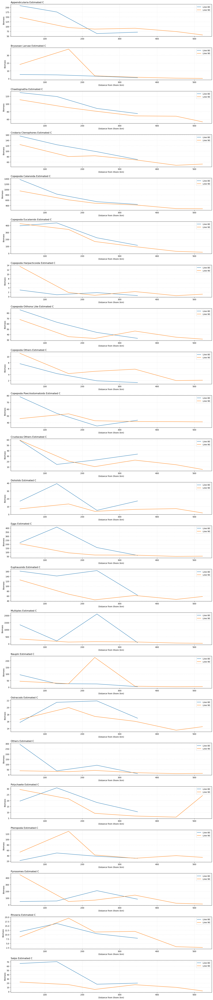

In [113]:
#Distance from shore Climatology of Species by Line
#add distance from shore classification
krill_comb['dist_shore_bin'] = pd.cut(x=krill_comb.loc[:,'dist_shore'], 
                                      bins = [0, 100, 200, 300, 400, 500, 600], 
                                      labels = ['0-100km', '101-200km', '201-300km', '301-400km', '401-500km', '501-600km'])

line_80 = krill_comb[krill_comb['line'] == 80].groupby('dist_shore_bin').mean(numeric_only = True).reset_index().set_index('dist_shore').drop('dist_shore_bin', axis = 1)
line_90 = krill_comb[krill_comb['line'] == 90].groupby('dist_shore_bin').mean(numeric_only = True).reset_index().set_index('dist_shore').drop('dist_shore_bin', axis = 1)

fig, ax = plt.subplots(23, 1, figsize = (15, 70))

ax[0].plot(line_80.index, line_80.iloc[:, 1], c = 'tab:blue', label = 'Line 80')
ax[0].plot(line_90.index, line_90.iloc[:, 1], c = 'tab:orange', label = 'Line 90')
ax[0].set_title(line_80.iloc[:, 1].name.split(' Biomass')[0].replace('_', ' ').title(), loc = 'left')
ax[0].legend()
ax[0].set_ylabel('Biomass')
ax[0].grid(linestyle = 'dotted', color = 'lightgrey')

for i, spp in zip(range(1, 23), range(2, 46, 2)):
    
    ax[i].plot(line_80.index, line_80.iloc[:, spp +1], c = 'tab:blue', label = 'Line 80')
    ax[i].plot(line_90.index, line_90.iloc[:, spp +1], c = 'tab:orange', label = 'Line 90')
    ax[i].set_ylabel('Biomass')
    
    ax[i].set_title(line_80.iloc[:, spp + 1].name.split(' Biomass')[0].replace('_', ' ').title(), loc = 'left')
    ax[i].grid(linestyle = 'dotted', color = 'lightgrey')
    ax[i].legend()

    ax[i].set_xlabel('Distance from Shore (km)')

plt.tight_layout()
plt.savefig('./figures/ZooScan_DistShore.png', bbox_inches = 'tight', dpi = 300, transparent=True)

In [ ]:
#Latitudinal Climatology of Species by Line
krill_comb['dist_shore_bin'] = pd.cut(x=krill_comb.loc[:,'dist_shore'], 
                                      bins = [*range(0, 601, 75)])
                                      # labels = ['0-100km', '101-200km', '201-300km', '301-400km', '401-500km', '501-600km'])

krill_comb = krill_comb.drop_duplicates()
line_80 = krill_comb[krill_comb['line'] == 80].groupby('dist_shore_bin').mean(numeric_only = True).reset_index().set_index('dist_shore').drop('dist_shore_bin', axis = 1)
line_80_std = krill_comb[krill_comb['line'] == 80].groupby('dist_shore_bin').mean(numeric_only = True).reset_index().set_index('dist_shore').drop('dist_shore_bin', axis = 1)
line_90 = krill_comb[krill_comb['line'] == 90].groupby('dist_shore_bin').mean(numeric_only = True).reset_index().set_index('dist_shore').drop('dist_shore_bin', axis = 1)
line_90_std = krill_comb[krill_comb['line'] == 90].groupby('dist_shore_bin').mean(numeric_only = True).reset_index().set_index('dist_shore').drop('dist_shore_bin', axis = 1)

fig, ax = plt.subplots(1, 1, figsize = (10, 3))

# ax.plot(line_80.index, line_80['euphausiids Abundance (No. per m2)'], c = 'tab:blue', label = 'Line 80', marker = 'o')
# ax.fill_between(line_80.index, line_80['euphausiids Abundance (No. per m2)'] - line_80_std['euphausiids Abundance (No. per m2)'], line_80['euphausiids Abundance (No. per m2)'] + line_80_std['euphausiids Abundance (No. per m2)'], color = 'tab:blue', alpha = 0.2)
# ax.plot(line_90.index, line_90['euphausiids Abundance (No. per m2)'], c = 'tab:orange', label = 'Line 90', marker = 'o')
# ax.fill_between(line_90.index, line_90['euphausiids Abundance (No. per m2)'] - line_90_std['euphausiids Abundance (No. per m2)'], line_90['euphausiids Abundance (No. per m2)'] + line_90_std['euphausiids Abundance (No. per m2)'], color = 'tab:orange', alpha = 0.2)
# ax.set_ylabel('Abundance (#/m2)')
# ax.set_ylim(0, max(line_80['euphausiids Abundance (No. per m2)'] + line_80_std['euphausiids Abundance (No. per m2)']) + max(line_80['euphausiids Abundance (No. per m2)'] + line_80_std['euphausiids Abundance (No. per m2)']) * .1)

ax.plot(line_80.index, line_80['euphausiids Estimated C Biomass (mgC m-2)'], c = 'tab:blue', label = 'Line 80', marker = 'o')
ax.fill_between(line_80.index, line_80['euphausiids Estimated C Biomass (mgC m-2)'] - line_80_std['euphausiids Estimated C Biomass (mgC m-2)'], line_80['euphausiids Estimated C Biomass (mgC m-2)'] + line_80_std['euphausiids Estimated C Biomass (mgC m-2)'], color = 'tab:blue', alpha = 0.2)
ax.plot(line_90.index, line_90['euphausiids Estimated C Biomass (mgC m-2)'], c = 'tab:orange', label = 'Line 90', marker = 'o')
ax.fill_between(line_90.index, line_90['euphausiids Estimated C Biomass (mgC m-2)'] - line_90_std['euphausiids Estimated C Biomass (mgC m-2)'], line_90['euphausiids Estimated C Biomass (mgC m-2)'] + line_90_std['euphausiids Estimated C Biomass (mgC m-2)'], color = 'tab:orange', alpha = 0.2)
ax.set_ylabel('Estimated C Biomass (mgC m-2)')
ax.set_ylim(0, max(line_80['euphausiids Estimated C Biomass (mgC m-2)'] + line_80_std['euphausiids Estimated C Biomass (mgC m-2)']) + max(line_80['euphausiids Estimated C Biomass (mgC m-2)'] + line_80_std['euphausiids Estimated C Biomass (mgC m-2)']) * .1)


ax.set_title('Euphausiids Abundance from ZooScan', loc = 'left')
ax.grid(linestyle = 'dotted', color = 'lightgrey')
ax.legend()

ax.set_xlabel('Distance from Shore (km)')

plt.tight_layout()
plt.savefig('./figures/ZooScan_DistShoreClim_EPAC_biomass_std.png', bbox_inches = 'tight', dpi = 300, transparent=True)



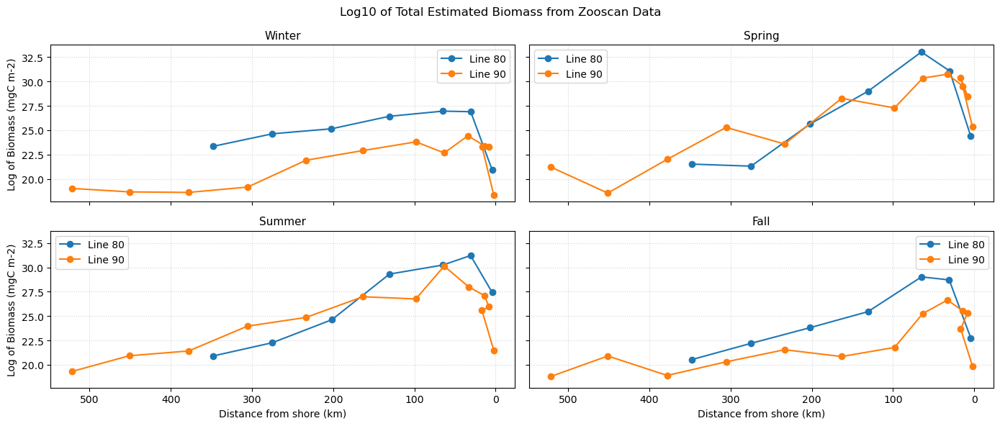

In [244]:
#Latitudinal Climatology of Species by Line
krill_comb = krill_comb.drop_duplicates()

krill_plot = krill_comb.copy()

#filter out biomass columns
krill_plot['total_biomass'] = krill_plot.drop('multiples Estimated C Biomass (mgC m-2)', axis = 1).filter(regex='Biomass').sum(axis = 1)
krill_plot['total_biomass_log'] = np.log10(krill_plot.drop('multiples Estimated C Biomass (mgC m-2)', axis = 1).filter(regex='Biomass') + 1).sum(axis = 1)
krill_plot.loc[(krill_plot['season'] == 'Fall') & (krill_plot['total_biomass'] > 10000), 'pyrosomes Estimated C Biomass (mgC m-2)'] = np.nan

var = 'total_biomass_log'

fig, ax = plt.subplots(2, 2, figsize = (14, 6), sharex = True, sharey = True)

axs = ax.flatten()

for i, seas in zip(range(4), ['Winter', 'Spring', 'Summer', 'Fall']):

    line_80 = krill_plot[(krill_plot['line'] == 80) & (krill_plot['season'] == seas)].groupby('station').mean(numeric_only = True)#.reset_index().set_index('dist_shore').drop('dist_shore_bin', axis = 1)
    line_80_std = krill_plot[(krill_plot['line'] == 80) & (krill_plot['season'] == seas)].groupby('station').mean(numeric_only = True)#.reset_index().set_index('dist_shore').drop('dist_shore_bin', axis = 1)
    line_90 = krill_plot[(krill_plot['line'] == 90) & (krill_plot['season'] == seas)].groupby('station').mean(numeric_only = True)#.reset_index().set_index('dist_shore').drop('dist_shore_bin', axis = 1)
    line_90_std = krill_plot[(krill_plot['line'] == 90) & (krill_plot['season'] == seas)].groupby('station').mean(numeric_only = True)#.reset_index().set_index('dist_shore').drop('dist_shore_bin', axis = 1)


    # line_80 = line_80.reset_index()
    # line_90 = line_90.reset_index()

    # line_80['station_recenter'] = line_80['station'] - line_80['station'].min()
    # line_90['station_recenter'] = line_90['station'] - line_90['station'].min()

    
    axs[i].plot(line_80.dist_shore, line_80[var], c = 'tab:blue', label = 'Line 80', marker = 'o')
    # axs[i].fill_between(line_80.index, line_80[var] - line_80_std[var], line_80[var] + line_80_std[var], color = 'tab:blue', alpha = 0.2)
    axs[i].plot(line_90.dist_shore, line_90[var], c = 'tab:orange', label = 'Line 90', marker = 'o')
    # axs[i].fill_between(line_90.index, line_90[var] - line_90_std[var], line_90[var] + line_90_std[var], color = 'tab:orange', alpha = 0.2)
    # ax.set_ylim(0, max(line_80['euphausiids Estimated C Biomass (mgC m-2)'] + line_80_std['euphausiids Estimated C Biomass (mgC m-2)']) + max(line_80['euphausiids Estimated C Biomass (mgC m-2)'] + line_80_std['euphausiids Estimated C Biomass (mgC m-2)']) * .1)

    if i in [0, 2]:
        axs[i].set_ylabel('Log of Biomass (mgC m-2)')
    else: 
        axs[i].set_ylabel(None)
    if i >= 2:
        axs[i].set_xlabel('Distance from shore (km)')
    else:
        axs[i].set_xlabel(None)
        
    axs[i].set_title(seas, fontsize = 11)
    axs[i].grid(linestyle = 'dotted', color = 'lightgrey')
    axs[i].legend()

plt.gca().invert_xaxis()

plt.suptitle('Log10 of Total Estimated Biomass from Zooscan Data')
plt.tight_layout()
# plt.savefig('./figures/ZooScan_Station_TotalBiomass_log_std.png', bbox_inches = 'tight', dpi = 300, transparent=True)



In [171]:
krill_plot[krill_plot['total_biomass'] >100000].filter(regex = 'Biomass').T

,137
appendicularia Estimated C Biomass (mgC m-2),828.78
bryozoan_larvae Estimated C Biomass (mgC m-2),2.63
chaetognatha Estimated C Biomass (mgC m-2),230.00
cnidaria_ctenophores Estimated C Biomass (mgC m-2),294.21
copepoda_calanoida Estimated C Biomass (mgC m-2),1312.81
copepoda_eucalanids Estimated C Biomass (mgC m-2),169.96
copepoda_harpacticoida Estimated C Biomass (mgC m-2),6.74
copepoda_oithona_like Estimated C Biomass (mgC m-2),130.58
copepoda_others Estimated C Biomass (mgC m-2),4.89
copepoda_poecilostomatoids Estimated C Biomass (mgC m-2),26.21


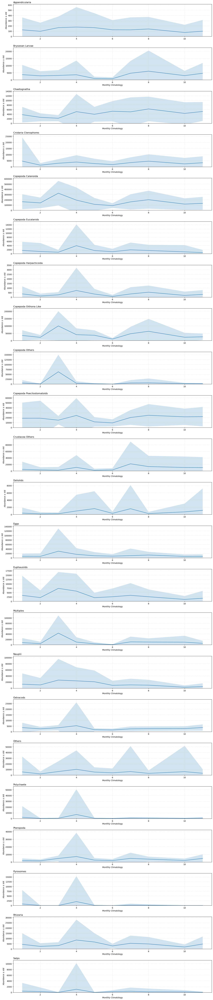

In [117]:
clim = krill_comb.groupby(krill_comb.DateTime.dt.month).mean(numeric_only = True)
clim_std = krill_comb.groupby(krill_comb.DateTime.dt.month).std(numeric_only = True)

fig, ax = plt.subplots(23, 1, figsize = (15, 70))


ax[0].plot(clim.index, clim.iloc[:, 1], c = 'tab:blue')
ax[0].fill_between(clim.index, clim.iloc[:, 1] - clim_std.iloc[:, 1], clim.iloc[:, 1] + clim_std.iloc[:, 1], alpha = 0.2)
ax[0].set_ylim(0, max(clim.iloc[:, 1] + clim_std.iloc[:, 1]) + max(clim.iloc[:, 1] + clim_std.iloc[:, 1]) * .1)
ax[0].set_title(clim.iloc[:, 1].name.split(' Estimated')[0].replace('_', ' ').title(), loc = 'left')
ax[0].set_ylabel('Abundance ± std')
ax[0].grid(linestyle = 'dotted', color = 'lightgrey')

for i, spp in zip(range(1, 23), range(2, 46, 2)):
    
    ax[i].plot(clim.index, clim.iloc[:, spp])
    ax[i].fill_between(clim.index, clim.iloc[:, spp] - clim_std.iloc[:, spp], clim.iloc[:, spp] + clim_std.iloc[:, spp], alpha = 0.2)
    ax[i].set_ylim(0, max(clim.iloc[:, spp] + clim_std.iloc[:, spp]) + max(clim.iloc[:, spp] + clim_std.iloc[:, spp]) * .1)

    ax[i].set_ylabel('Abundance ± std')
    
    ax[i].set_title(clim.iloc[:, spp].name.split(' Abundance')[0].replace('_', ' ').title(), loc = 'left')
    ax[i].grid(linestyle = 'dotted', color = 'lightgrey')

    ax[i].set_xlabel('Monthly Climatology')
    

plt.tight_layout()
plt.savefig('./figures/ZooScan_MonthlyClim.png', bbox_inches = 'tight', dpi = 300, transparent=True)

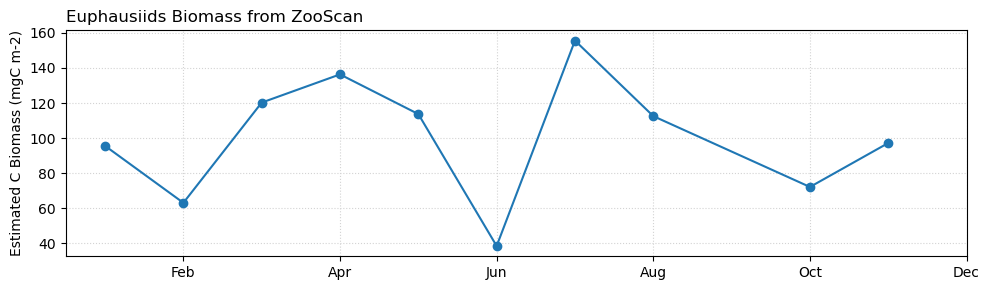

In [120]:
clim = krill_comb.groupby(krill_comb.DateTime.dt.month).mean(numeric_only = True)
clim_std = krill_comb.groupby(krill_comb.DateTime.dt.month).std(numeric_only = True)

fig, ax = plt.subplots(1, 1, figsize = (10, 3))

# ax.plot(clim.index, clim['euphausiids Abundance (No. per m2)'], marker = 'o', c = 'tab:blue')
# ax.fill_between(clim.index, clim['euphausiids Abundance (No. per m2)'] - clim_std['euphausiids Abundance (No. per m2)'], clim['euphausiids Abundance (No. per m2)'] + clim_std['euphausiids Abundance (No. per m2)'], alpha = 0.2)
# ax.set_ylim(0, max(clim['euphausiids Abundance (No. per m2)'] + clim_std['euphausiids Abundance (No. per m2)']) + max(clim['euphausiids Abundance (No. per m2)'] + clim_std['euphausiids Abundance (No. per m2)']) * .1)
# ax.set_title('Euphausiids Abundance from ZooScan', loc = 'left')
# ax.set_ylabel('Abundance (#/m2)')

ax.plot(clim.index, clim['euphausiids Estimated C Biomass (mgC m-2)'], marker = 'o', c = 'tab:blue')
# ax.fill_between(clim.index, clim['euphausiids Estimated C Biomass (mgC m-2)'] - clim_std['euphausiids Estimated C Biomass (mgC m-2)'], clim['euphausiids Estimated C Biomass (mgC m-2)'] + clim_std['euphausiids Estimated C Biomass (mgC m-2)'], alpha = 0.2)
# ax.set_ylim(0, max(clim['euphausiids Estimated C Biomass (mgC m-2)'] + clim_std['euphausiids Estimated C Biomass (mgC m-2)']) + max(clim['euphausiids Estimated C Biomass (mgC m-2)'] + clim_std['euphausiids Estimated C Biomass (mgC m-2)']) * .1)
ax.set_title('Euphausiids Biomass from ZooScan', loc = 'left')
ax.set_ylabel('Estimated C Biomass (mgC m-2)')

ax.grid(linestyle = 'dotted', color = 'lightgrey')
ax.set_xticks([*range(2, 13, 2)])
ax.set_xticklabels([calendar.month_abbr[i] for i in range(2, 13, 2)])

plt.tight_layout()
plt.savefig('./figures/ZooScan_MonthlyClim_EPAC_biomass.png', bbox_inches = 'tight', dpi = 300, transparent=True)

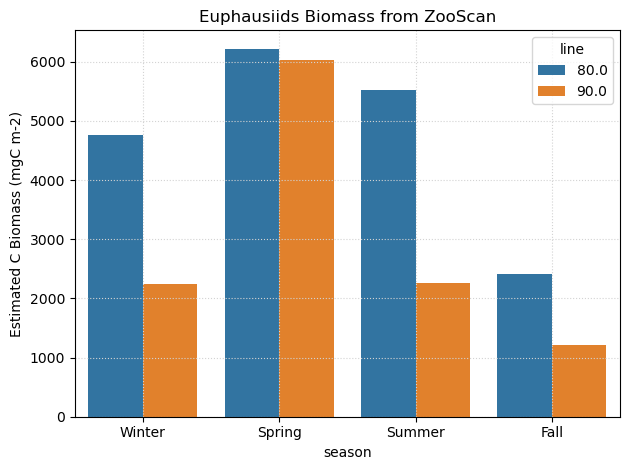

In [149]:
#Seasonal 
clim = krill_comb[krill_comb['season'] != 'nan'].groupby(['season', 'line']).mean(numeric_only = True).reset_index()
clim['line'] = clim['line'].astype(str)
# clim["season"] = pd.Categorical(clim["season"], ['Winter', 'Spring', 'Summer', 'Fall'])


sns.barplot(
    data=clim,
    x='season',
    y='euphausiids Abundance (No. per m2)', 
    hue='line', 
    order=['Winter', 'Spring', 'Summer', 'Fall'],  # Order of colored bars at each X position
)

# fig, ax = plt.subplots(1, 1, figsize = (10, 3))

# # ax.plot(clim.index, clim['euphausiids Abundance (No. per m2)'], marker = 'o', c = 'tab:blue')
# # ax.fill_between(clim.index, clim['euphausiids Abundance (No. per m2)'] - clim_std['euphausiids Abundance (No. per m2)'], clim['euphausiids Abundance (No. per m2)'] + clim_std['euphausiids Abundance (No. per m2)'], alpha = 0.2)
# # ax.set_ylim(0, max(clim['euphausiids Abundance (No. per m2)'] + clim_std['euphausiids Abundance (No. per m2)']) + max(clim['euphausiids Abundance (No. per m2)'] + clim_std['euphausiids Abundance (No. per m2)']) * .1)
# # ax.set_title('Euphausiids Abundance from ZooScan', loc = 'left')
# # ax.set_ylabel('Abundance (#/m2)')
# x = np.arange(4)
# ax.bar(clim.index, clim['euphausiids Estimated C Biomass (mgC m-2)'], 0.4, color = 'tab:blue')
# ax.bar(clim.index, clim['euphausiids Estimated C Biomass (mgC m-2)'], 0.4, color = 'tab:orange')

# # ax.fill_between(clim.index, clim['euphausiids Estimated C Biomass (mgC m-2)'] - clim_std['euphausiids Estimated C Biomass (mgC m-2)'], clim['euphausiids Estimated C Biomass (mgC m-2)'] + clim_std['euphausiids Estimated C Biomass (mgC m-2)'], alpha = 0.2)
# # ax.set_ylim(0, max(clim['euphausiids Estimated C Biomass (mgC m-2)'] + clim_std['euphausiids Estimated C Biomass (mgC m-2)']) + max(clim['euphausiids Estimated C Biomass (mgC m-2)'] + clim_std['euphausiids Estimated C Biomass (mgC m-2)']) * .1)
plt.title('Euphausiids Biomass from ZooScan')
plt.ylabel('Estimated C Biomass (mgC m-2)')
plt.grid(linestyle = 'dotted', color = 'lightgrey')
plt.tight_layout()
plt.savefig('./figures/ZooScan_SeasonalClim_EPAC_biomass.png', bbox_inches = 'tight', dpi = 300, transparent=True)

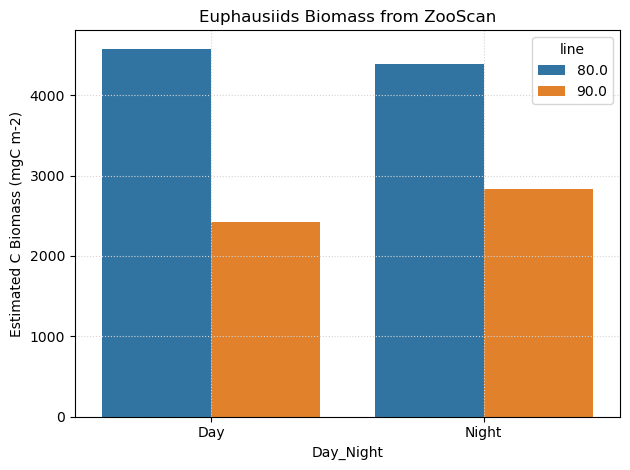

In [148]:
clim = krill_comb.groupby(['Day_Night', 'line']).mean(numeric_only = True).reset_index()
clim['line'] = clim['line'].astype(str)
# clim["season"] = pd.Categorical(clim["season"], ['Winter', 'Spring', 'Summer', 'Fall'])


sns.barplot(
    data=clim,
    x='Day_Night',
    y='euphausiids Abundance (No. per m2)', 
    hue='line', 
)

# fig, ax = plt.subplots(1, 1, figsize = (10, 3))

# # ax.plot(clim.index, clim['euphausiids Abundance (No. per m2)'], marker = 'o', c = 'tab:blue')
# # ax.fill_between(clim.index, clim['euphausiids Abundance (No. per m2)'] - clim_std['euphausiids Abundance (No. per m2)'], clim['euphausiids Abundance (No. per m2)'] + clim_std['euphausiids Abundance (No. per m2)'], alpha = 0.2)
# # ax.set_ylim(0, max(clim['euphausiids Abundance (No. per m2)'] + clim_std['euphausiids Abundance (No. per m2)']) + max(clim['euphausiids Abundance (No. per m2)'] + clim_std['euphausiids Abundance (No. per m2)']) * .1)
# # ax.set_title('Euphausiids Abundance from ZooScan', loc = 'left')
# # ax.set_ylabel('Abundance (#/m2)')
# x = np.arange(4)
# ax.bar(clim.index, clim['euphausiids Estimated C Biomass (mgC m-2)'], 0.4, color = 'tab:blue')
# ax.bar(clim.index, clim['euphausiids Estimated C Biomass (mgC m-2)'], 0.4, color = 'tab:orange')

# # ax.fill_between(clim.index, clim['euphausiids Estimated C Biomass (mgC m-2)'] - clim_std['euphausiids Estimated C Biomass (mgC m-2)'], clim['euphausiids Estimated C Biomass (mgC m-2)'] + clim_std['euphausiids Estimated C Biomass (mgC m-2)'], alpha = 0.2)
# # ax.set_ylim(0, max(clim['euphausiids Estimated C Biomass (mgC m-2)'] + clim_std['euphausiids Estimated C Biomass (mgC m-2)']) + max(clim['euphausiids Estimated C Biomass (mgC m-2)'] + clim_std['euphausiids Estimated C Biomass (mgC m-2)']) * .1)
plt.title('Euphausiids Biomass from ZooScan')
plt.ylabel('Estimated C Biomass (mgC m-2)')
plt.grid(linestyle = 'dotted', color = 'lightgrey')
plt.tight_layout()
plt.savefig('./figures/ZooScan_DayNightClim_EPAC_biomass.png', bbox_inches = 'tight', dpi = 300, transparent=True)

### Glider Data

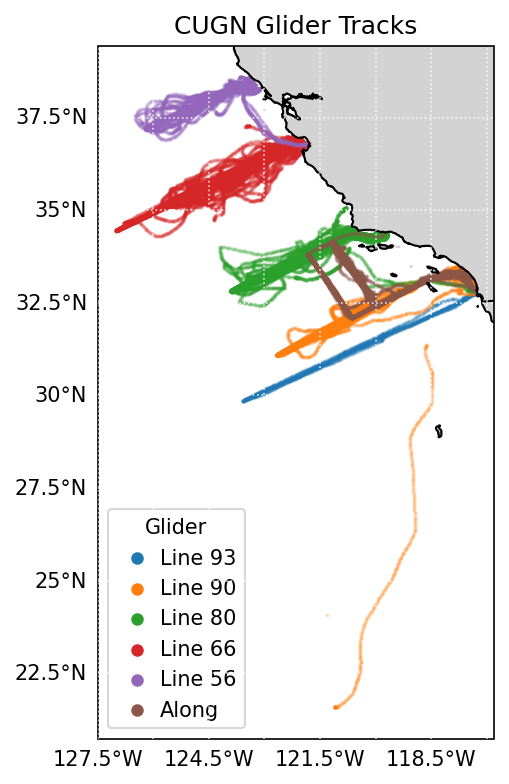

In [18]:
files = glob.glob('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/raw/*.nc')
files.sort(reverse = True)

fig = plt.figure(figsize=(12,6), dpi = 150) 
ax = plt.axes(projection=ccrs.PlateCarree()) 

ax.coastlines(resolution='10m',linewidth=1,color='black', zorder = 3) 
ax.add_feature(cfeature.LAND, color='lightgrey', alpha=1)
# axs[i].add_feature(states_provinces, linewidth = 0.5)
ax.add_feature(cfeature.BORDERS)
# ax.set_xticks(np.round([*np.arange(-180, 180,1)],0), crs=ccrs.PlateCarree()) 
# ax.set_yticks(np.round([*np.arange(-90, 90)],1), crs=ccrs.PlateCarree()) 
# axs[i].set_extent([region[1,0],region[1,1],region[0,0],region[0,1]],crs=ccrs.PlateCarree()) 
gl = ax.gridlines(linestyle = 'dotted', color = 'white', alpha = 0.8, zorder = 10, draw_labels=True, y_inline = False)
gl.xlabels_top = False
gl.ylabels_right = False

ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())


for file in files:
    glider = xr.open_dataset(file)
    glider.close()

    ax.scatter(glider['lon'], glider['lat'], s = 1, alpha = 0.2, label = file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0])

lgnd = plt.legend(loc = 'lower left', title = 'Glider', handletextpad = 0.1)

for handle in lgnd.legend_handles:
    handle.set_sizes([25])
    handle.set_alpha([1])

plt.title('CUGN Glider Tracks')
plt.savefig('./figures/CUGN_GliderTracks.png', bbox_inches = 'tight', dpi = 300)
plt.show()

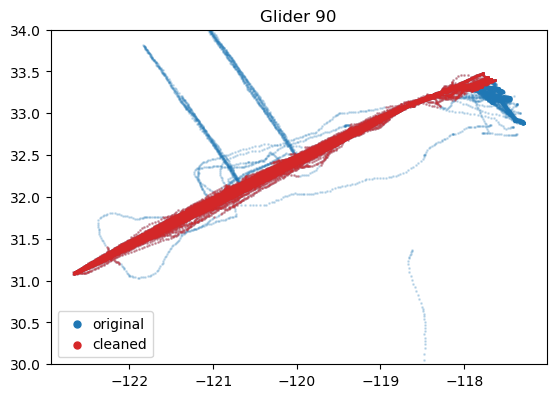

CPU times: user 19.3 s, sys: 43.5 s, total: 1min 2s
Wall time: 1min 2s


In [7]:
%%time
###Clean Line 90
#open CalCOFI data
calcofi = pd.read_csv('./data/CalCOFIStationOrder.csv')
calcofi = calcofi.dropna(subset = 'Order Occ')

#convert CalCOFI cruise to line shapefile
stack_lonlat = calcofi[calcofi['Line'] == 90].agg({'Lon (dec)': np.stack, 'Lat (dec)':  np.stack})
lineStringObj = LineString(list(zip(*stack_lonlat)))
df6 = pd.DataFrame()
df6['LineID'] = [101,]
line_gdf = gpd.GeoDataFrame(df6, crs='epsg:4326', geometry=[lineStringObj,])

#add a buffer (convert to polygon)
line_gdf['geometry'] = line_gdf.to_crs('epsg:32611').buffer(15 * 1000).to_crs('epsg:4326')

files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/raw/CUGN_line_90.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/raw/CUGN_line_80.nc']

#open file
glider = xr.open_dataset(files[0])
glider.close()

#plot OG data
plt.scatter(glider['lon'], glider['lat'], s = 1, alpha = 0.2, c = 'tab:blue', label = 'original')

#filter out separate cruises with extrenuous data
glider_44 = glider.where((glider.trajectory_index == 44), drop = True)
glider_44 = glider_44.where(~((glider_44.lon < -120.68) & (glider_44.lat > 32.11)), drop = True)

glider_48 = glider.where((glider.trajectory_index == 48), drop = True)
glider_48 = glider_48.where(~((glider_48.lon < -120.6) & (glider_48.lat > 32.1)), drop = True)

glider_62 = glider.where((glider.trajectory_index == 62), drop = True)
glider_62 = glider_62.where(~((glider_62.lon < -119.97) & (glider_62.lat > 32.47)), drop = True)

glider_63 = glider.where((glider.trajectory_index == 63) & (glider.lat >= 31.466), drop = True)
glider = glider.where(glider.trajectory_index != 63, drop = True)

glider_64 = glider.where((glider.trajectory_index == 64), drop = True)
glider_64 = glider_64.where(~((glider_64.lon < -120) & (glider_64.lat > 32.48)), drop = True)

glider = glider.where(~glider.trajectory_index.isin([44, 48, 62, 63, 64]), drop = True)

glider = xr.merge([glider, glider_44, glider_48, glider_62, glider_63, glider_64])

#convert sites to geodataframe
glider_points = glider[['lat', 'lon', 'time']].to_dataframe()
glider_points = gpd.GeoDataFrame(glider_points, geometry=gpd.points_from_xy(glider_points.lon, glider_points.lat), crs="EPSG:4326")

#select glider points within line polygon
glider_points_sel = gpd.sjoin(glider_points, line_gdf, op = 'within')

#select out matching glider points
glider = glider.where(glider.profile.isin(glider_points_sel.index), drop = True)

#plot out tracks
plt.scatter(glider['lon'], glider['lat'], s = 1, alpha = 0.3, c = 'tab:red', label = 'cleaned')
lgnd = plt.legend(loc = 'lower left', handletextpad = 0.1)

for handle in lgnd.legend_handles:
    handle.set_sizes([25])
    handle.set_alpha([1])

plt.title('Glider 90')
plt.gca().set_aspect('equal')
plt.ylim(30, 34)
plt.show()

glider.to_netcdf('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc')


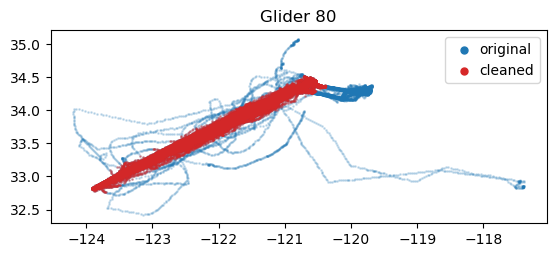

CPU times: user 16.9 s, sys: 43.1 s, total: 1min
Wall time: 1min


In [8]:
%%time
###Clean Line 80
#open CalCOFI data
calcofi = pd.read_csv('./data/CalCOFIStationOrder.csv')
calcofi = calcofi.dropna(subset = 'Order Occ')

#convert CalCOFI cruise to line shapefile
stack_lonlat = calcofi[calcofi['Line'] == 80].agg({'Lon (dec)': np.stack, 'Lat (dec)':  np.stack})
lineStringObj = LineString(list(zip(*stack_lonlat)))
df6 = pd.DataFrame()
df6['LineID'] = [101,]
line_gdf = gpd.GeoDataFrame(df6, crs='epsg:4326', geometry=[lineStringObj,])

#add a buffer (convert to polygon)
line_gdf['geometry'] = line_gdf.to_crs('epsg:32611').buffer(15 * 1000).to_crs('epsg:4326')

files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/raw/CUGN_line_90.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/raw/CUGN_line_80.nc']

#open file
glider = xr.open_dataset(files[1])
glider.close()

#plot OG data
plt.scatter(glider['lon'], glider['lat'], s = 1, alpha = 0.2, c = 'tab:blue', label = 'original')

#filter out cruises with extrenuous data
glider_58 = glider.where(glider.trajectory_index == 58, drop = True)
glider_58 = glider_58.where(~((glider_58.lon > -121.15) & (glider_58.lat < 34.16)), drop = True)

glider_59 = glider.where(glider.trajectory_index == 59, drop = True)
glider_59 = glider_59.where(~((glider_59.lon > -121.1) & (glider_59.lat < 34.13)), drop = True)

glider = glider.where(~glider.trajectory_index.isin([58, 59]), drop = True)

glider = xr.merge([glider, glider_58, glider_59])

#convert sites to geodataframe
glider_points = glider[['lat', 'lon', 'time']].to_dataframe()
glider_points = gpd.GeoDataFrame(glider_points, geometry=gpd.points_from_xy(glider_points.lon, glider_points.lat), crs="EPSG:4326")

#select glider points within line polygon
glider_points_sel = gpd.sjoin(glider_points, line_gdf, op = 'within')

#select out matching glider points
glider = glider.where(glider.profile.isin(glider_points_sel.index), drop = True)

#plot data
plt.scatter(glider['lon'], glider['lat'], s = 1, alpha = 0.3, c = 'tab:red', label = 'cleaned')
lgnd = plt.legend(loc = 'upper right', handletextpad = 0.1)

for handle in lgnd.legend_handles:
    handle.set_sizes([25])
    handle.set_alpha([1])

plt.title('Glider 80')
plt.gca().set_aspect('equal')
plt.show()

glider.to_netcdf('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc')


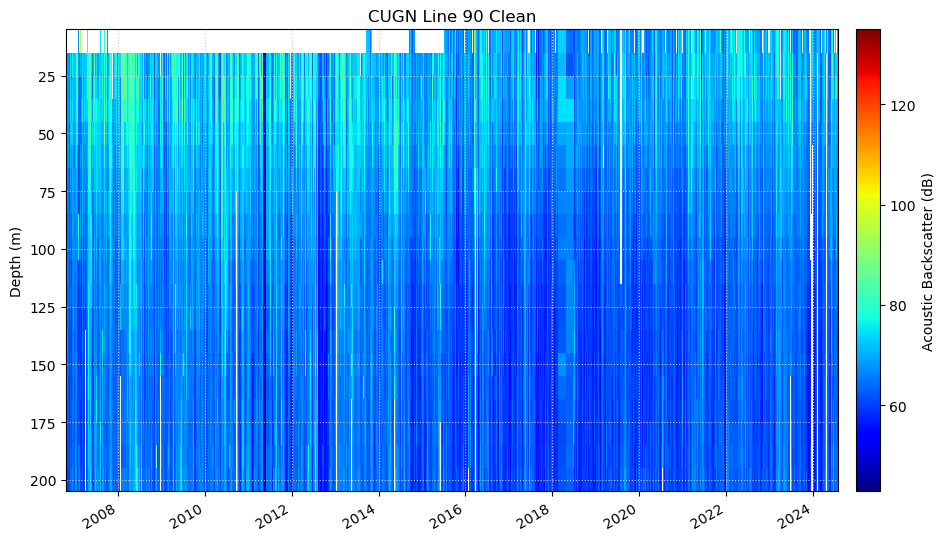

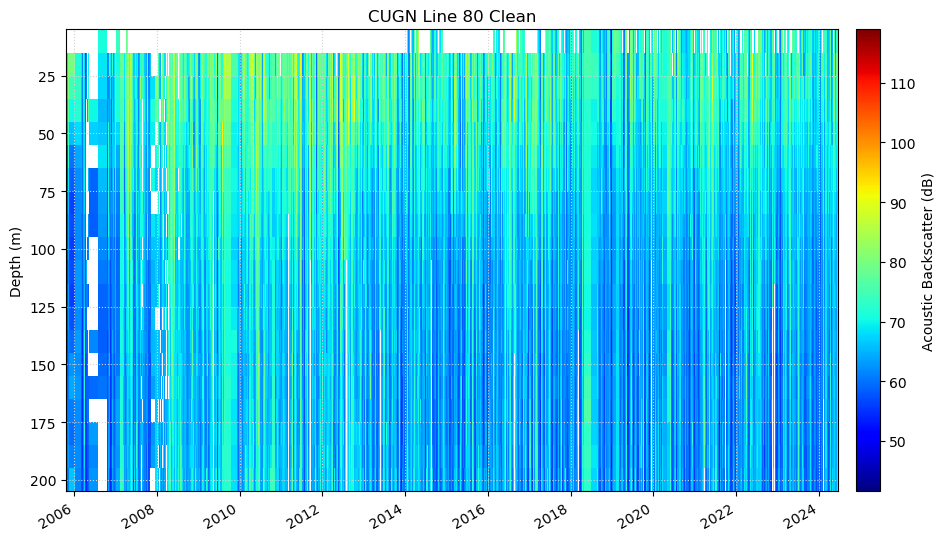

In [9]:
# files = glob.glob('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/*.nc')
# files.sort()

files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc']
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_66.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_56.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_along.nc']

var = 'acoustic_backscatter'

for file in files: 

    glider = xr.open_dataset(file)
    glider.close()
    
    temp = glider[['time', var]].to_dataframe().reset_index().set_index(['time', 'depth'])
    temp = temp.dropna(subset = var).groupby(level=temp.index.names).mean()[[var]].to_xarray()

    # if var == 'acoustic_backscatter':
    #     temp['acoustic_backscatter_khz'] = 
    
    fig, ax = plt.subplots(1, 1, figsize = (12, 6))
    temp.where(glider.depth <= 200, drop = True)[var].plot(ax = ax,cmap = 'jet', x = 'time', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    # temp[var].plot(ax = ax, x = 'time', cmap = 'jet', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    ax.set_title('CUGN ' + file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0])
    ax.set_ylabel('Depth (m)')
    ax.set_xlabel(None)
    ax.grid(color = 'lightgrey', linestyle = 'dotted')
    plt.gca().invert_yaxis()
    plt.savefig('./figures/CUGN_'+file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0]+'_Timeseries.png', bbox_inches = 'tight', dpi = 300)
    plt.show()


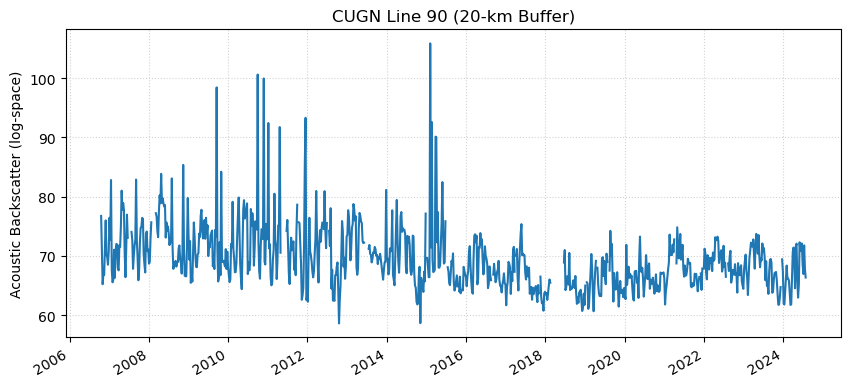

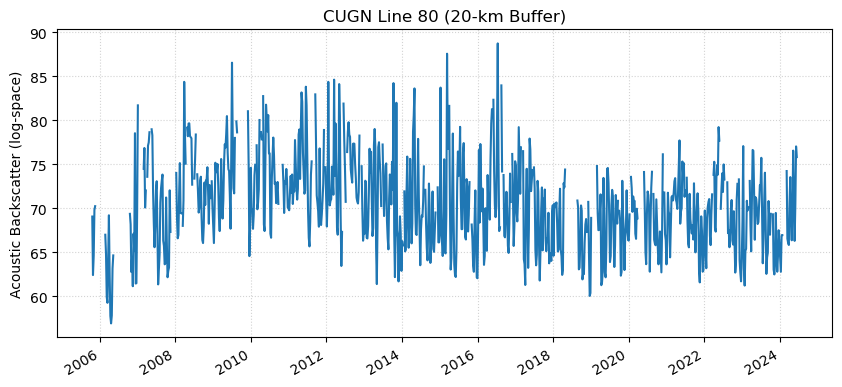

In [201]:
# files = glob.glob('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/*.nc')
# files.sort()

files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_90_20kmBuffer.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_80_20kmBuffer.nc']
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_66.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_56.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_along.nc']

var = 'acoustic_backscatter'

for file in files: 

    glider = xr.open_dataset(file)
    glider.close()
    
    temp = glider[['time', var]].to_dataframe().reset_index().set_index(['time', 'depth'])
    temp = temp.dropna(subset = var).groupby(level=temp.index.names).mean()[[var]].to_xarray()

    temp = temp.where(temp.depth <= 210, drop = True)#.resample(time = '7D').mean(...)
    temp = temp.assign(little_sv = 10**(temp.acoustic_backscatter/10))
    # temp = temp.where(temp.little_sv <= 5e11, drop = True)

    temp = temp.mean(dim = 'depth')
    temp = temp.resample(time = '7D').mean()
    temp = temp.assign(big_sv = 10*np.log10(temp.little_sv))
    # if var == 'acoustic_backscatter':
    #     temp['acoustic_backscatter_khz'] = 
    
    fig, ax = plt.subplots(1, 1, figsize = (10, 4))
    temp['big_sv'].plot(ax = ax,x = 'time')#cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    # temp[var].plot(ax = ax, x = 'time', cmap = 'jet', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    ax.set_title('CUGN ' + file.split('CUGN_')[-1].replace('_', ' ').title().split('20Km')[0] + '(20-km Buffer)')
    ax.set_ylabel('Acoustic Backscatter (log-space)')
    ax.set_xlabel(None)
    ax.grid(color = 'lightgrey', linestyle = 'dotted')
    # plt.savefig('./figures/CUGN_'+file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0]+'_DepthAveraged_Timeseries.png', bbox_inches = 'tight', dpi = 300)
    plt.show()


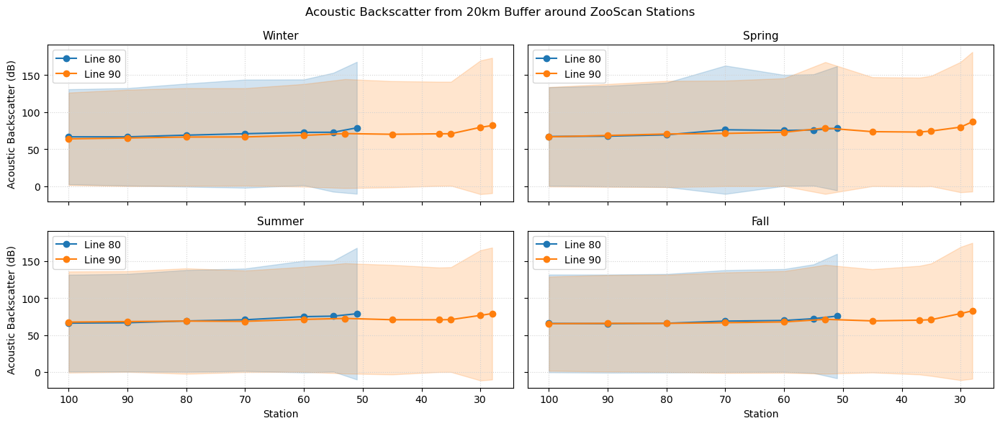

In [196]:
###Depth Integrated Backscatter Aggreated by Station with 20-km Buffer
var = 'acoustic_backscatter'
spatial_buffer = 20

#open krill data
krill_comb = pd.read_csv('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/calcofi/ZooScan/ZooScan_combined.csv', parse_dates = ['DateTime'])

calcofi_station = pd.read_csv('/Users/gammonkoval/Downloads/CalCOFIStationOrder.csv')
line_station = krill_comb.groupby(['line', 'station']).size().reset_index()
calcofi_sel = calcofi_station.merge(line_station.rename({'line':'Line', 'station':'Sta'}, axis = 1), how = 'outer').dropna(subset = 0)

#convert to geodataframe
calcofi_sel = gpd.GeoDataFrame(calcofi_sel, geometry=gpd.points_from_xy(calcofi_sel['Lon (dec)'], calcofi_sel['Lat (dec)']), crs="EPSG:4326")

#add buffer
calcofi_sel['geometry'] = calcofi_sel.to_crs('epsg:32611').buffer(spatial_buffer * 1000).to_crs('epsg:4326')

#open glider data
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_90_20kmBuffer.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_80_20kmBuffer.nc']

line_sel = []
station_sel = []
season_sel = []
acoustic = []
acoustic_std = []

for file in files:
    glider = xr.open_dataset(file)
    glider.close()

    #add in season based on JDate
    glider['jdate'] = glider['time'].dt.strftime('%j').astype(int)
    glider['season'] = np.nan
    glider['season'] = xr.where((glider['jdate'] >= 8) & (glider['jdate'] <= 42), 'Winter', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 81) & (glider['jdate'] <= 119), 'Spring', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 185) & (glider['jdate'] <= 233), 'Summer', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 292) & (glider['jdate'] <= 325), 'Fall', glider['season'])

    #loop through each season
    for seas in ['Winter', 'Spring', 'Summer', 'Fall']:
    
        #convert glider to points
        glider_points = glider.where(glider.season == seas, drop = True)[['lat', 'lon', 'time']].to_dataframe()
        glider_points = gpd.GeoDataFrame(glider_points, geometry=gpd.points_from_xy(glider_points.lon, glider_points.lat), crs="EPSG:4326")

        #loop through each station
        for i in range(len(calcofi_sel)):
            temp = calcofi_sel.iloc[[i]]
            
            #select glider points within line polygon
            glider_points_sel = gpd.sjoin(glider_points, temp, op = 'within')

            #add data to lists
            if len(glider_points_sel.index) != 0: 
                glider_sel = glider.where(glider.profile.isin(glider_points_sel.index), drop = True)
                # glider_mean = glider_sel.where(glider.depth <= 210, drop = True)#.mean(...)
                # glider_std = glider_sel.where(glider.depth <= 210, drop = True)#.std(...)

                glider_sel = glider_sel.where(glider_sel.depth <= 210, drop = True)#.resample(time = '7D').mean(...)
                glider_sel = glider_sel.assign(little_sv = 10**(glider_sel.acoustic_backscatter/10))

                
                glider_sel = glider_sel.where(glider_sel.little_sv <= 5e11, drop = True)

                glider_sel = glider_sel.mean(dim = 'depth')

                glider_mean = glider_sel.mean(...)
                glider_mean = glider_mean.assign(big_sv = 10*np.log10(glider_mean.little_sv))

                glider_std = glider_sel.std(...)
                glider_std = glider_std.assign(big_sv = 10*np.log10(glider_std.little_sv))


                line_sel.append(temp['Line'].values[0])
                station_sel.append(temp['Sta'].values[0])
                season_sel.append(seas)
                acoustic.append(float(glider_mean.big_sv.values))
                acoustic_std.append(float(glider_std.big_sv.values))

glider_calcofi = pd.DataFrame({'Sta':station_sel, 'Line':line_sel, 'Season':season_sel, 'acoustic_backscatter':acoustic, 'acoustic_backscatter_std':acoustic_std})
glider_calcofi = glider_calcofi.groupby(['Sta', 'Line', 'Season']).mean().reset_index().merge(calcofi_sel, how = 'left')

# var = 'acoutis_backscatter'

fig, ax = plt.subplots(2, 2, figsize = (14, 6), sharex = True, sharey = True)

axs = ax.flatten()

for i, seas in zip(range(4), ['Winter', 'Spring', 'Summer', 'Fall']):

    line_80 = glider_calcofi[(glider_calcofi['Line'] == 80) & (glider_calcofi['Season'] == seas)].groupby('Sta').mean(numeric_only = True)#.reset_index().set_index('dist_shore').drop('dist_shore_bin', axis = 1)
    line_90 = glider_calcofi[(glider_calcofi['Line'] == 90) & (glider_calcofi['Season'] == seas)].groupby('Sta').mean(numeric_only = True)#.reset_index().set_index('dist_shore').drop('dist_shore_bin', axis = 1)
    
    axs[i].plot(line_80.index, line_80[var], c = 'tab:blue', label = 'Line 80', marker = 'o')
    axs[i].fill_between(line_80.index, line_80[var] - line_80[var + '_std'], line_80[var] + line_80[var + '_std'], color = 'tab:blue', alpha = 0.2)
    axs[i].plot(line_90.index, line_90[var], c = 'tab:orange', label = 'Line 90', marker = 'o')
    axs[i].fill_between(line_90.index, line_90[var] - line_90[var + '_std'], line_90[var] + line_90[var + '_std'], color = 'tab:orange', alpha = 0.2)
    # ax.set_ylim(0, max(line_80['euphausiids Estimated C Biomass (mgC m-2)'] + line_80_std['euphausiids Estimated C Biomass (mgC m-2)']) + max(line_80['euphausiids Estimated C Biomass (mgC m-2)'] + line_80_std['euphausiids Estimated C Biomass (mgC m-2)']) * .1)

    if i in [0, 2]:
        axs[i].set_ylabel('Acoustic Backscatter (dB)')
    else: 
        axs[i].set_ylabel(None)
    if i >= 2:
        axs[i].set_xlabel('Station')
    else:
        axs[i].set_xlabel(None)
        
    axs[i].set_title(seas, fontsize = 11)
    axs[i].grid(linestyle = 'dotted', color = 'lightgrey')
    axs[i].legend()

plt.gca().invert_xaxis()

plt.suptitle('Acoustic Backscatter from 20km Buffer around ZooScan Stations')
plt.tight_layout()
plt.savefig('./figures/Glider_ZooScanStations_std.png', bbox_inches = 'tight', dpi = 300, transparent=False)



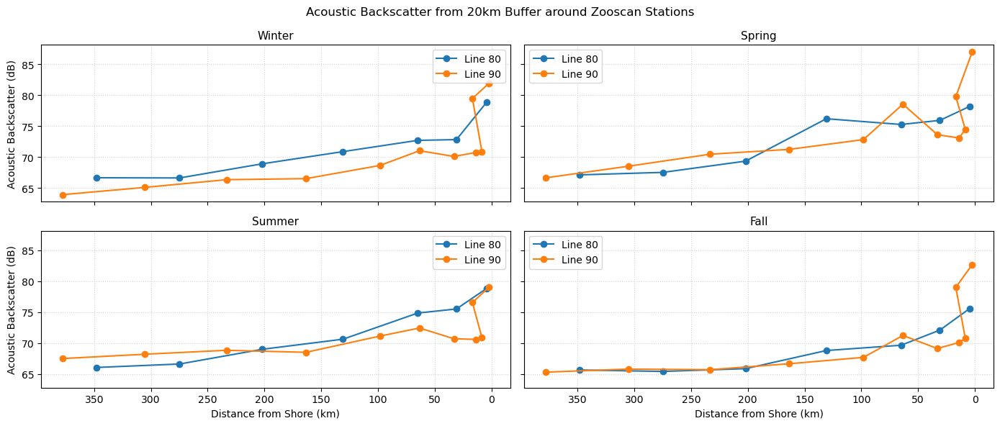

In [250]:
#add in distance from shore and depth from bathymetry
dist_shore_list = []

for i in range(len(glider_calcofi)):
    dist_shore_list.append(float(dist_shore.interp(y = glider_calcofi.iloc[i]['Lat (dec)'], x = glider_calcofi.iloc[i]['Lon (dec)']).band_data.values))

glider_calcofi['dist_shore'] = dist_shore_list

var = 'acoustic_backscatter'


fig, ax = plt.subplots(2, 2, figsize = (14, 6), sharex = True, sharey = True)

axs = ax.flatten()

for i, seas in zip(range(4), ['Winter', 'Spring', 'Summer', 'Fall']):

    line_80 = glider_calcofi[(glider_calcofi['Line'] == 80) & (glider_calcofi['Season'] == seas)].groupby('Sta').mean(numeric_only = True)#.reset_index().set_index('dist_shore').drop('dist_shore_bin', axis = 1)
    line_90 = glider_calcofi[(glider_calcofi['Line'] == 90) & (glider_calcofi['Season'] == seas)].groupby('Sta').mean(numeric_only = True)#.reset_index().set_index('dist_shore').drop('dist_shore_bin', axis = 1)
    
    axs[i].plot(line_80['dist_shore'], line_80[var], c = 'tab:blue', label = 'Line 80', marker = 'o')
    # axs[i].fill_between(line_80.index, line_80[var] - line_80[var + '_std'], line_80[var] + line_80[var + '_std'], color = 'tab:blue', alpha = 0.2)
    axs[i].plot(line_90['dist_shore'], line_90[var], c = 'tab:orange', label = 'Line 90', marker = 'o')
    # axs[i].fill_between(line_90.index, line_90[var] - line_90[var + '_std'], line_90[var] + line_90[var + '_std'], color = 'tab:orange', alpha = 0.2)
    # ax.set_ylim(0, max(line_80['euphausiids Estimated C Biomass (mgC m-2)'] + line_80_std['euphausiids Estimated C Biomass (mgC m-2)']) + max(line_80['euphausiids Estimated C Biomass (mgC m-2)'] + line_80_std['euphausiids Estimated C Biomass (mgC m-2)']) * .1)

    if i in [0, 2]:
        axs[i].set_ylabel('Acoustic Backscatter (dB)')
    else: 
        axs[i].set_ylabel(None)
    if i >= 2:
        axs[i].set_xlabel('Distance from Shore (km)')
    else:
        axs[i].set_xlabel(None)
        
    axs[i].set_title(seas, fontsize = 11)
    axs[i].grid(linestyle = 'dotted', color = 'lightgrey')
    axs[i].legend()

plt.gca().invert_xaxis()

plt.suptitle('Acoustic Backscatter from 20km Buffer around Zooscan Stations')
plt.tight_layout()
# plt.savefig('./figures/Glider_ZooScanStations_std.png', bbox_inches = 'tight', dpi = 300, transparent=False)

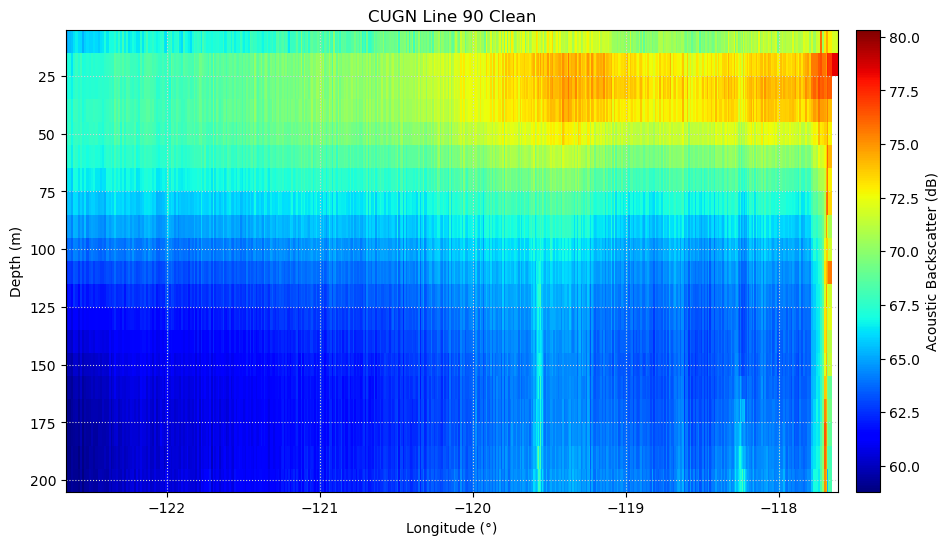

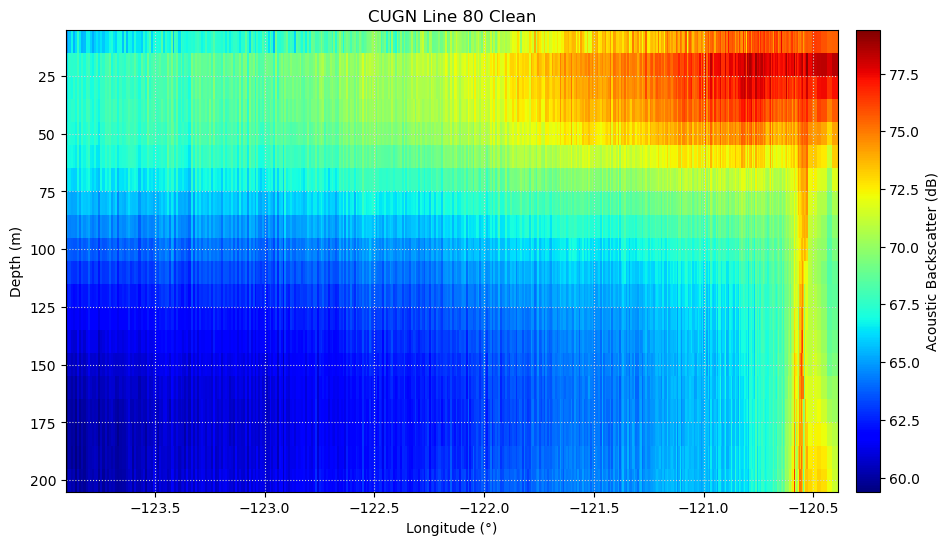

In [10]:
#Longitudinal Climatology
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc']
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_66.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_56.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_along.nc']

var = 'acoustic_backscatter'

for file in files: 

    glider = xr.open_dataset(file)
    glider.close()
        
    fig, ax = plt.subplots(1, 1, figsize = (12, 6))
    # temp.where(temp.depth <= 200, drop = True)[var].plot(ax = ax, x = 'time', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    glider.where(glider.depth <= 200, drop = True).groupby('lon').mean()[var].coarsen(lon = 100, boundary = 'pad').mean().plot(cmap = 'jet', ax = ax, y = 'depth', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    ax.set_title('CUGN ' + file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0])
    ax.set_ylabel('Depth (m)')
    ax.set_xlabel('Longitude (°)')
    ax.grid(color = 'lightgrey', linestyle = 'dotted')
    plt.gca().invert_yaxis()
    plt.savefig('./figures/CUGN_'+file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0]+'_LonClim.png', bbox_inches = 'tight', dpi = 300)
    plt.show()


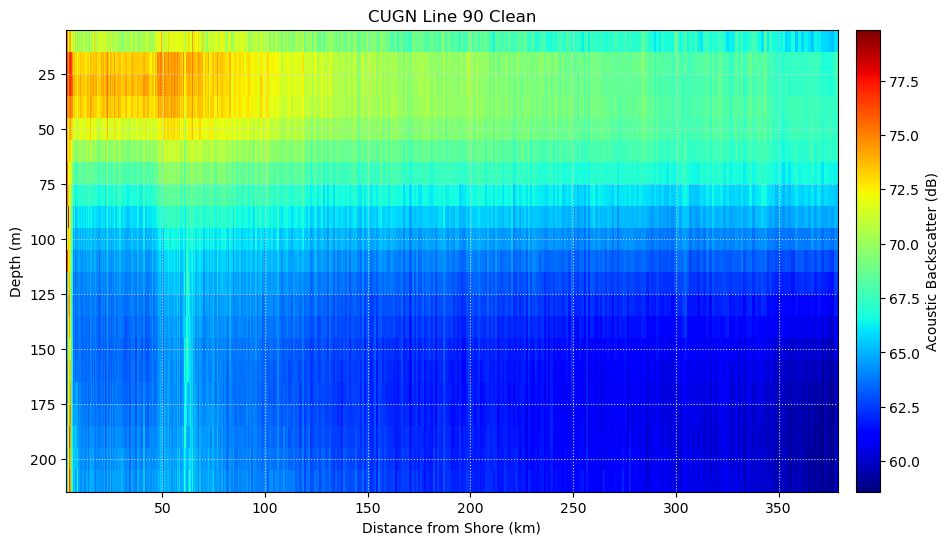

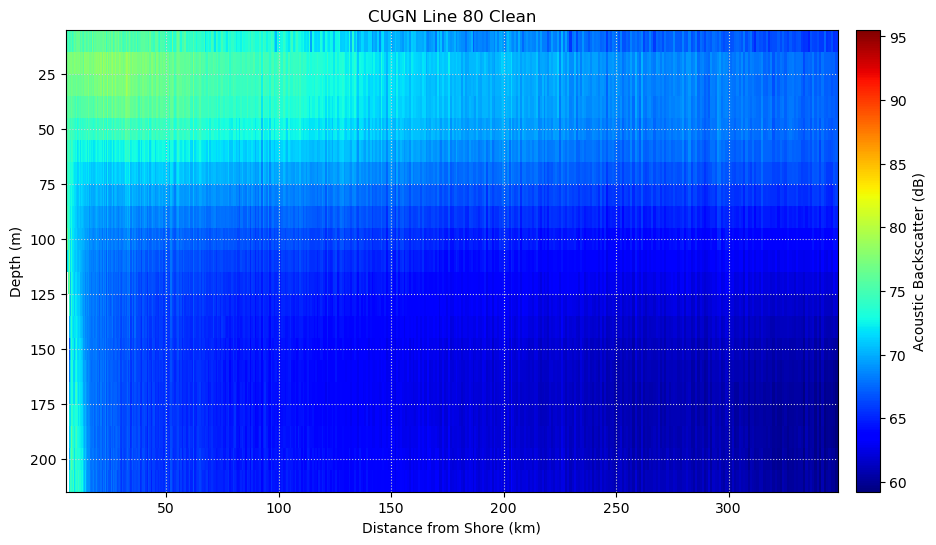

In [11]:
#Distance from Shore Climatology
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc']
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_66.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_56.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_along.nc']

var = 'acoustic_backscatter'

for file in files: 

    glider = xr.open_dataset(file)
    glider.close()

    glider = glider.assign_coords(dist_shore = dist_shore.interp(x = glider.lon, y = glider.lat).band_data)
        
    fig, ax = plt.subplots(1, 1, figsize = (12, 6))
    # temp.where(temp.depth <= 200, drop = True)[var].plot(ax = ax, x = 'time', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    glider.where(glider.depth <= 210, drop = True).groupby('dist_shore').mean()[var].coarsen(dist_shore = 100, boundary = 'pad').mean().plot(cmap = 'jet', ax = ax, y = 'depth', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    ax.set_title('CUGN ' + file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0])
    ax.set_ylabel('Depth (m)')
    ax.set_xlabel('Distance from Shore (km)')
    ax.grid(color = 'lightgrey', linestyle = 'dotted')
    plt.gca().invert_yaxis()
    plt.savefig('./figures/CUGN_'+file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0]+'_DistShoreClim.png', bbox_inches = 'tight', dpi = 300)
    plt.show()


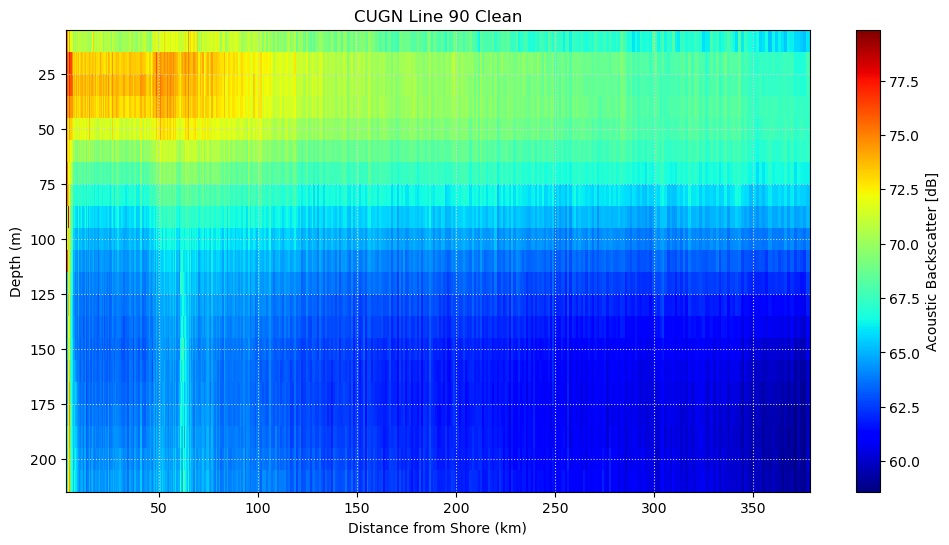

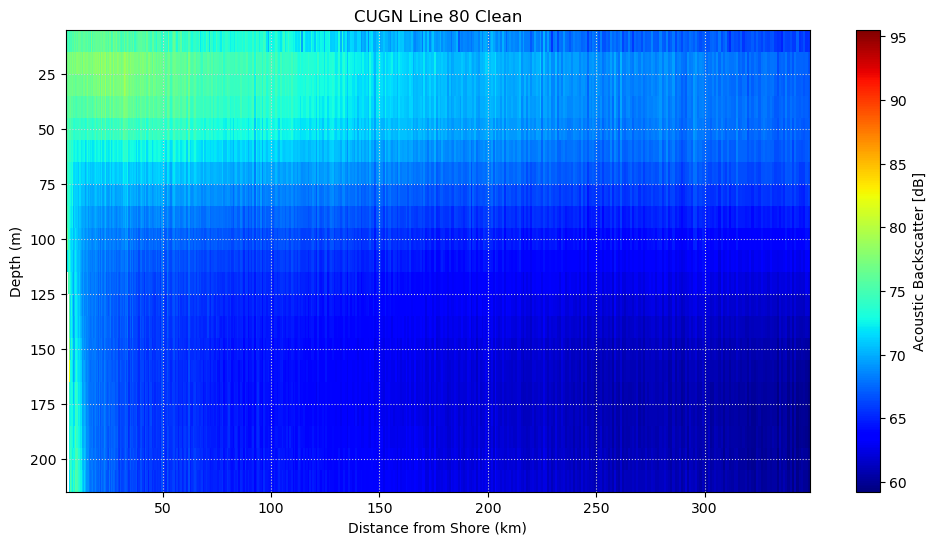

In [155]:
#Distance from Shore Climatology
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc']
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_66.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_56.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_along.nc']

var = 'acoustic_backscatter'

for file in files: 

    glider = xr.open_dataset(file)
    glider.close()

    glider = glider.assign_coords(dist_shore = dist_shore.interp(x = glider.lon, y = glider.lat).band_data)
        
    fig, ax = plt.subplots(1, 1, figsize = (12, 6))
    # temp.where(temp.depth <= 200, drop = True)[var].plot(ax = ax, x = 'time', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    glider.where(glider.depth <= 210, drop = True).groupby('dist_shore').mean()[var].coarsen(dist_shore = 100, boundary = 'pad').mean().plot(cmap = 'jet', ax = ax)#y = 'depth', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    ax.set_title('CUGN ' + file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0])
    ax.set_ylabel('Depth (m)')
    ax.set_xlabel('Distance from Shore (km)')
    ax.grid(color = 'lightgrey', linestyle = 'dotted')
    plt.gca().invert_yaxis()
    # plt.savefig('./figures/CUGN_'+file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0]+'_DistShoreClim.png', bbox_inches = 'tight', dpi = 300)
    plt.show()


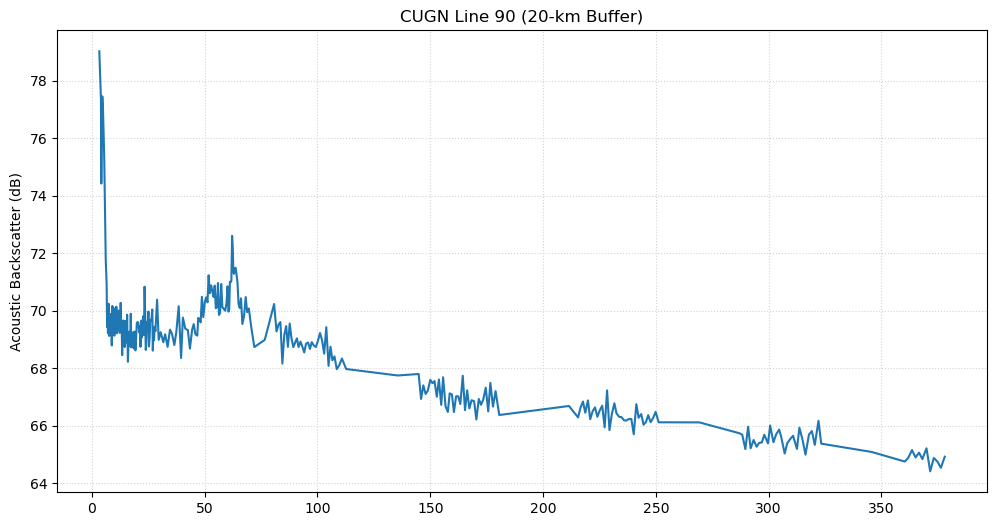

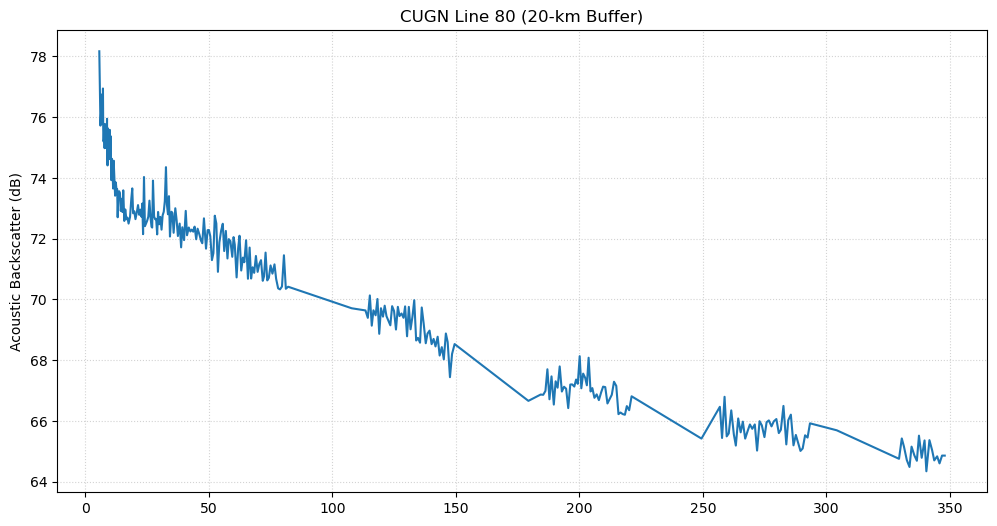

In [410]:
# files = glob.glob('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/*.nc')
# files.sort()

files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_90_20kmBuffer.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_80_20kmBuffer.nc']
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_66.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_56.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_along.nc']

var = 'acoustic_backscatter'

for file in files: 

    glider = xr.open_dataset(file)
    glider.close()
    
    glider = glider.assign_coords(dist_shore = dist_shore.interp(x = glider.lon, y = glider.lat).band_data)

    glider = glider.where(glider.depth <= 210, drop = True)#.resample(time = '7D').mean(...)
    glider = glider.assign(little_sv = 10**(glider.acoustic_backscatter/10))
    glider = glider.mean(dim = 'depth')
    glider = glider.assign(big_sv = 10*np.log10(glider.little_sv))

    fig, ax = plt.subplots(1, 1, figsize = (12, 6))
    glider.groupby('dist_shore').mean()['big_sv'].coarsen(dist_shore = 100, boundary = 'pad').mean().plot(ax = ax)
    ax.set_title('CUGN ' + file.split('CUGN_')[-1].replace('_', ' ').title().split('20Km')[0] + '(20-km Buffer)')
    ax.set_ylabel('Acoustic Backscatter (dB)')
    ax.set_xlabel('Distance from Shore (km)')
    ax.set_xlabel(None)
    ax.grid(color = 'lightgrey', linestyle = 'dotted')
    plt.savefig('./figures/CUGN_'+file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0]+'_DepthAveraged_DistancefromShore.png', bbox_inches = 'tight', dpi = 300)
    plt.show()


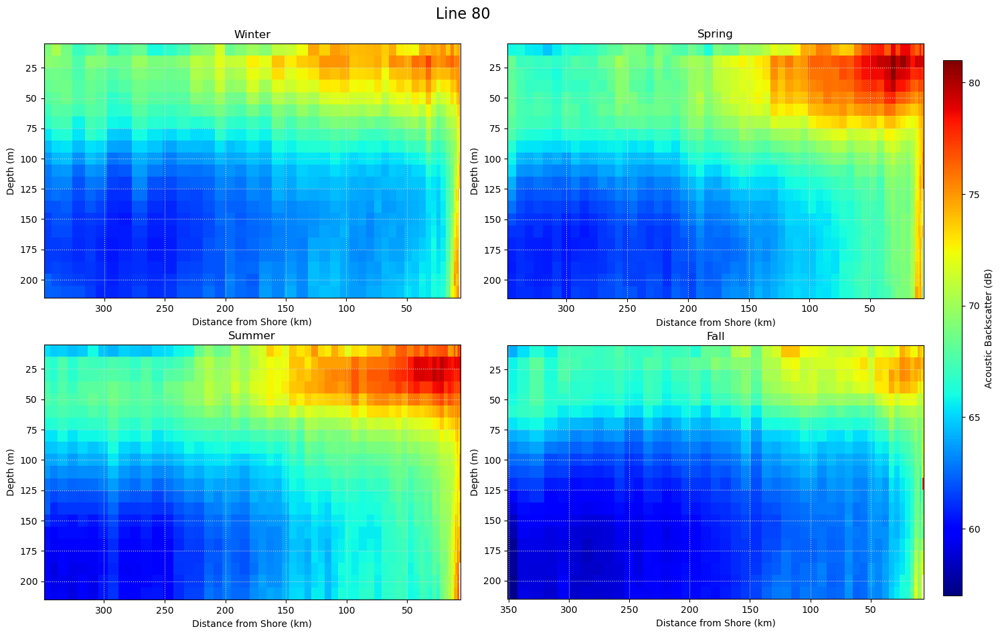

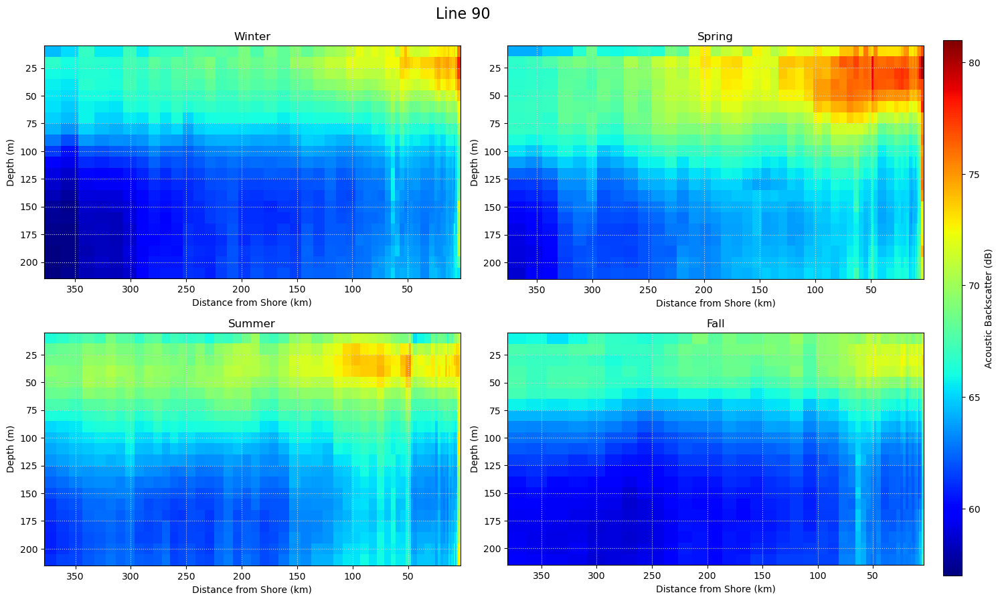

In [17]:
#Distance from Shore Climatology
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc']
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_66.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_56.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_along.nc']

var = 'acoustic_backscatter'

for file in files: 

    glider = xr.open_dataset(file)
    glider.close()

    glider = glider.assign_coords(dist_shore = dist_shore.interp(x = glider.lon, y = glider.lat).band_data)

    
    #add in season based on JDate
    glider['jdate'] = glider['time'].dt.strftime('%j').astype(int)
    glider['season'] = np.nan
    glider['season'] = xr.where((glider['jdate'] >= 8) & (glider['jdate'] <= 42), 'Winter', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 81) & (glider['jdate'] <= 119), 'Spring', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 185) & (glider['jdate'] <= 233), 'Summer', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 292) & (glider['jdate'] <= 325), 'Fall', glider['season'])
    # glider = glider.assign_coords(season = glider.season)
  
    fig, ax = plt.subplots(2, 2, figsize = (14, 10))
    axs = ax.flatten()

    for i, seas in zip(range(4), ['Winter', 'Spring', 'Summer', 'Fall']):
        # temp.where(temp.depth <= 200, drop = True)[var].plot(ax = ax, x = 'time', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
        cs = glider.where((glider.depth <= 210) & (glider.season == seas), drop = True).groupby('dist_shore').mean()[var].coarsen(dist_shore = 100, boundary = 'pad').mean().plot(ax = axs[i], cmap = 'jet', y = 'depth', vmin = 57, vmax = 81, add_colorbar = False)#vmin = glider[var].min(), vmax = glider[var].max())#, add_colorbar = False) 
                                                                                                                                                                             # cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
        # ax.set_title('CUGN ' + file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0]) 
        axs[i].set_ylabel('Depth (m)')
        axs[i].set_xlabel('Distance from Shore (km)')
        axs[i].grid(color = 'lightgrey', linestyle = 'dotted')
        axs[i].set_title(seas)
        axs[i].invert_yaxis()
        axs[i].set_aspect('equal')
        axs[i].invert_xaxis()


    #x, y, width, height
    cb_ax = fig.add_axes([1.01,.1,.02,.8])
    plt.colorbar(cs,orientation='vertical',cax=cb_ax, label = 'Acoustic Backscatter (dB)')
    plt.tight_layout()
    if '80' in file:
        plt.subplots_adjust(hspace=-0.1)
        plt.suptitle(file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0].split('Clean')[0], y = 0.98, fontsize = 16)

    else:
        plt.subplots_adjust(hspace=-0.2)
        plt.suptitle(file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0].split('Clean')[0], y = 0.95, fontsize = 16)
    
    plt.savefig('./figures/CUGN_'+file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0]+'_DistShoreClim_season.png', bbox_inches = 'tight', dpi = 300)
    plt.show()

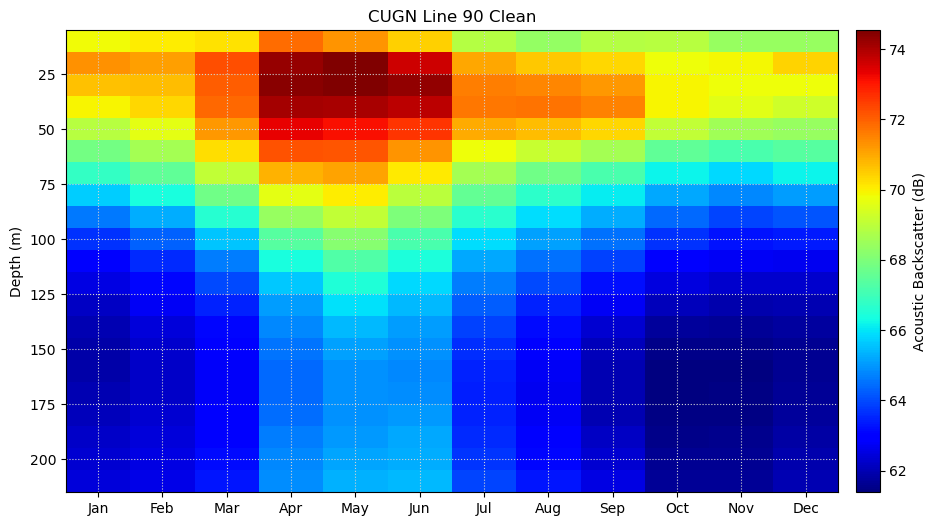

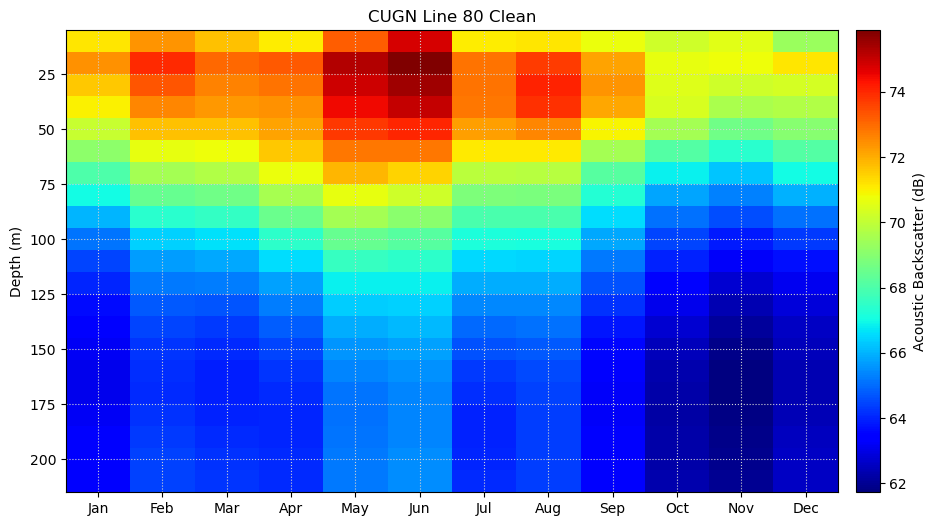

In [119]:
#Monthly Climatology
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc']
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_66.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_56.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_along.nc']

var = 'acoustic_backscatter'

for file in files: 

    glider = xr.open_dataset(file)
    glider.close()
        
    fig, ax = plt.subplots(1, 1, figsize = (12, 6))
    # temp.where(temp.depth <= 200, drop = True)[var].plot(ax = ax, x = 'time', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    glider.where(glider.depth <= 210, drop = True).groupby(glider.time.dt.month).mean()[var].plot(cmap = 'jet', ax = ax, y = 'depth', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    ax.set_title('CUGN ' + file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0])
    ax.set_ylabel('Depth (m)')
    ax.set_xlabel(None)
    ax.set_xticks([*range(1, 13)])
    ax.set_xticklabels([calendar.month_abbr[i] for i in range(1, 13)])
    ax.grid(color = 'lightgrey', linestyle = 'dotted')
    plt.gca().invert_yaxis()
    plt.savefig('./figures/CUGN_'+file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0]+'_MonthlyClim.png', bbox_inches = 'tight', dpi = 300)
    plt.show()


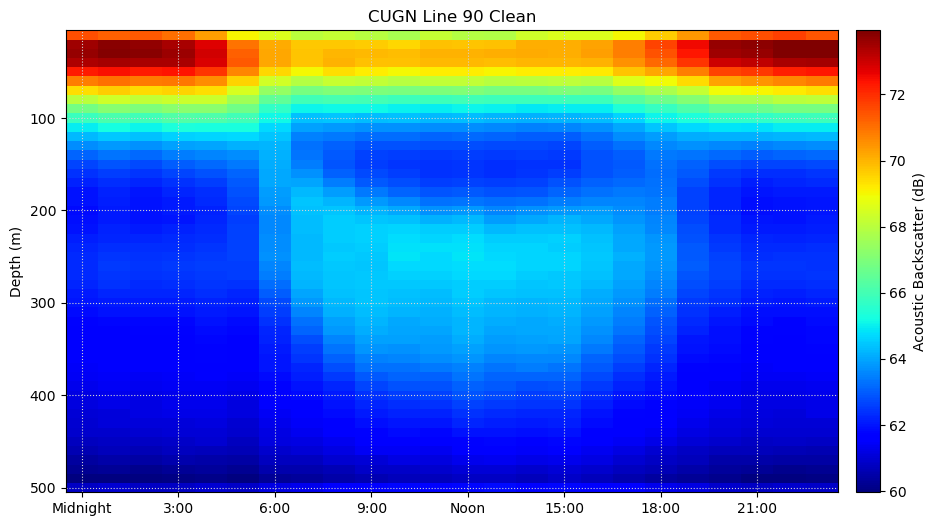

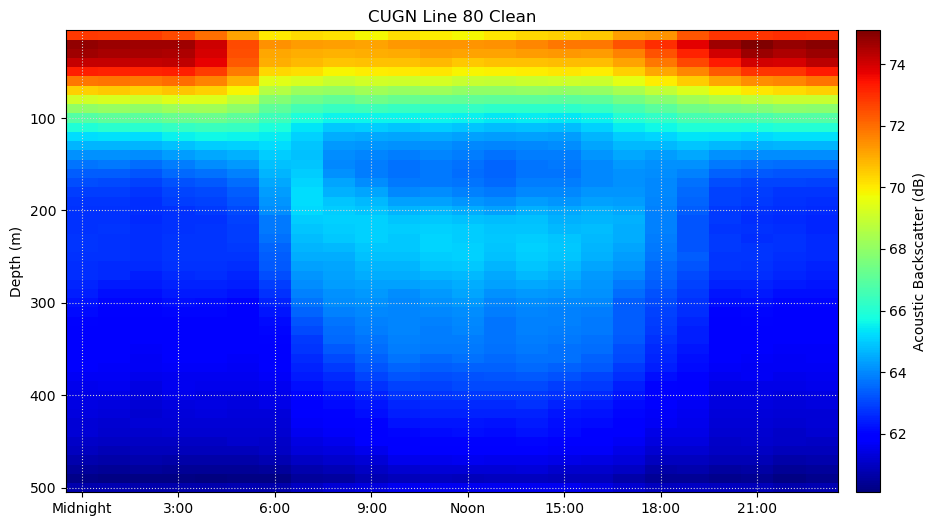

In [162]:
#Daily Climatology
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc']
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_66.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_56.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_along.nc']

var = 'acoustic_backscatter'

for file in files: 

    glider = xr.open_dataset(file)
    glider.close()

    temp = glider[['time', var]].to_dataframe().reset_index()#.set_index(['time', 'depth'])
    # temp = temp.dropna(subset = var).groupby(level=temp.index.names).mean()[[var]].to_xarray()
    temp['time'] = temp['time'].dt.tz_localize('UTC').dt.tz_convert('US/Pacific')
    temp['time'] = pd.to_datetime(temp['time'].dt.strftime("%Y-%m-%d %H:%M:%S"))
    temp = temp.set_index(['time', 'depth'])
    glider = temp.dropna(subset = var).groupby(level=temp.index.names).mean()[[var]].to_xarray()
        
    fig, ax = plt.subplots(1, 1, figsize = (12, 6))
    # temp.where(temp.depth <= 200, drop = True)[var].plot(ax = ax, x = 'time', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    glider.where(glider.depth <= 500, drop = True).groupby(glider.time.dt.hour).mean()[var].plot(cmap = 'jet', ax = ax, y = 'depth', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    ax.set_title('CUGN ' + file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0])
    ax.set_ylabel('Depth (m)')
    ax.set_xlabel(None)
    ax.set_xticks([*range(0, 24, 3)])
    ax.set_xticklabels(['Midnight', '3:00', '6:00', '9:00', 'Noon', '15:00', '18:00', '21:00'])
    # ax.set_xticklabels([calendar.month_abbr[i] for i in range(1, 13)])
    ax.grid(color = 'lightgrey', linestyle = 'dotted')
    plt.gca().invert_yaxis()
    plt.savefig('./figures/CUGN_'+file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0]+'_TimeofDayClim.png', bbox_inches = 'tight', dpi = 300)
    plt.show()


<Figure size 1200x600 with 0 Axes>

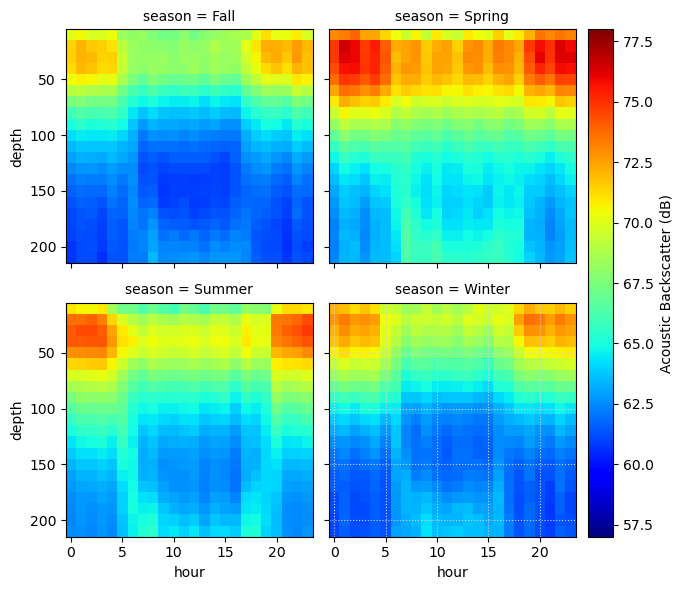

<Figure size 1200x600 with 0 Axes>

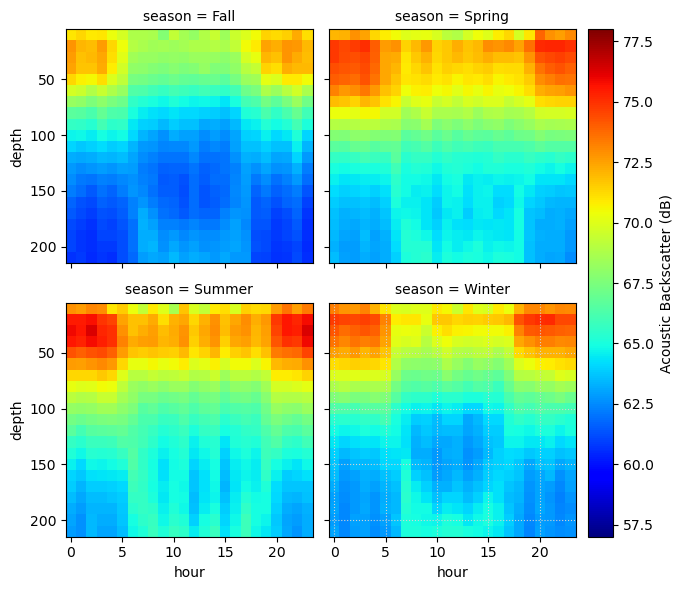

In [5]:
#Monthly Climatology
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc']
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_66.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_56.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_along.nc']

var = 'acoustic_backscatter'

for file in files: 

    glider = xr.open_dataset(file)
    glider.close()

    #add in season based on JDate
    glider['jdate'] = glider['time'].dt.strftime('%j').astype(int)
    glider['season'] = np.nan
    glider['season'] = xr.where((glider['jdate'] >= 8) & (glider['jdate'] <= 42), 'Winter', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 81) & (glider['jdate'] <= 119), 'Spring', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 185) & (glider['jdate'] <= 233), 'Summer', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 292) & (glider['jdate'] <= 325), 'Fall', glider['season'])
    
    
    temp = glider[['time', 'season', var]].to_dataframe().reset_index()#.set_index(['time', 'depth'])
    # temp = temp.dropna(subset = var).groupby(level=temp.index.names).mean()[[var]].to_xarray()
    temp['time'] = temp['time'].dt.tz_localize('UTC').dt.tz_convert('US/Pacific')
    temp['time'] = pd.to_datetime(temp['time'].dt.strftime("%Y-%m-%d %H:%M:%S"))
    temp = temp.set_index(['season', 'time', 'depth'])
    glider = temp.dropna(subset = var).groupby(level=temp.index.names).mean()[[var]].to_xarray()
        
    fig = plt.figure(figsize = (12, 6))
    # temp.where(temp.depth <= 200, drop = True)[var].plot(ax = ax, x = 'time', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    glider = glider.where((glider.depth <= 210), drop = True)# & (glider.time.dt.year.isin([2022])), drop = True)
    glider.groupby(glider.time.dt.hour).mean()[var].plot(cmap = 'jet', y = 'depth', col = 'season', col_wrap = 2, vmin = 61.5, vmax = 83, cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    # plt.title('CUGN ' + file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0])
    # plt.ylabel('Depth (m)')
    # plt.xlabel(None)
    # plt.xticks([*range(0, 24, 3)])
    # plt.xticklabels(['Midnight', '3:00', '6:00', '9:00', 'Noon', '15:00', '18:00', '21:00'])
    # ax.set_xticklabels([calendar.month_abbr[i] for i in range(1, 13)])
    plt.grid(color = 'lightgrey', linestyle = 'dotted')
    plt.gca().invert_yaxis()
    plt.savefig('./figures/CUGN_'+file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0]+'_TimeofDayClim_Season.png', bbox_inches = 'tight', dpi = 300)
    plt.show()


<Figure size 1200x600 with 0 Axes>

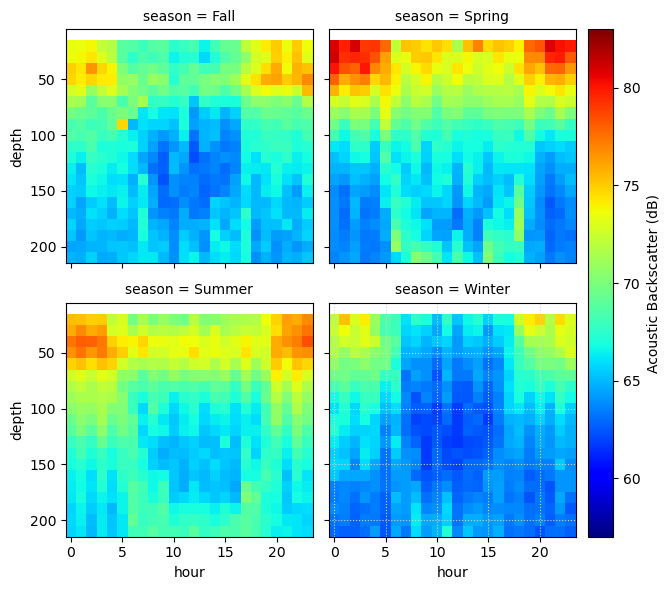

<Figure size 1200x600 with 0 Axes>

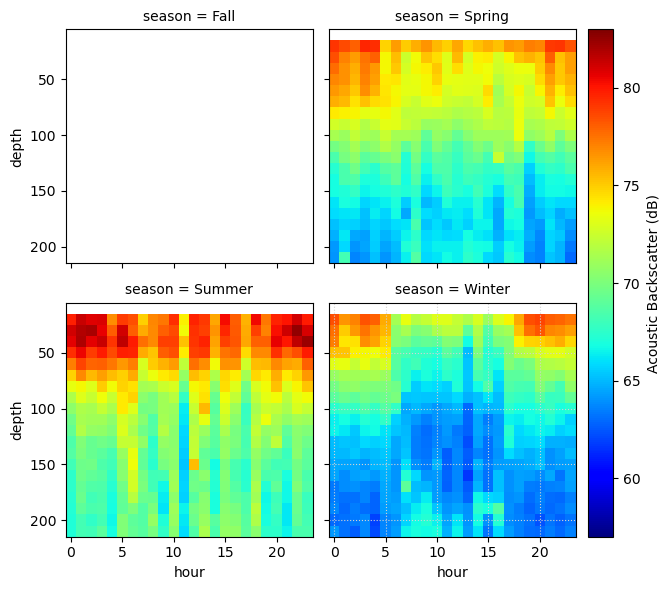

In [11]:
#Monthly Climatology
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc']
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_66.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_56.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_along.nc']

var = 'acoustic_backscatter'

for file in files: 

    glider = xr.open_dataset(file)
    glider.close()

    #add in season based on JDate
    glider['jdate'] = glider['time'].dt.strftime('%j').astype(int)
    glider['season'] = np.nan
    glider['season'] = xr.where((glider['jdate'] >= 8) & (glider['jdate'] <= 42), 'Winter', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 81) & (glider['jdate'] <= 119), 'Spring', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 185) & (glider['jdate'] <= 233), 'Summer', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 292) & (glider['jdate'] <= 325), 'Fall', glider['season'])
    
    
    temp = glider[['time', 'season', var]].to_dataframe().reset_index()#.set_index(['time', 'depth'])
    # temp = temp.dropna(subset = var).groupby(level=temp.index.names).mean()[[var]].to_xarray()
    temp['time'] = temp['time'].dt.tz_localize('UTC').dt.tz_convert('US/Pacific')
    temp['time'] = pd.to_datetime(temp['time'].dt.strftime("%Y-%m-%d %H:%M:%S"))
    temp = temp.set_index(['season', 'time', 'depth'])
    glider = temp.dropna(subset = var).groupby(level=temp.index.names).mean()[[var]].to_xarray()
        
    fig = plt.figure(figsize = (12, 6))
    # temp.where(temp.depth <= 200, drop = True)[var].plot(ax = ax, x = 'time', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    glider = glider.where((glider.depth <= 210) & (glider.time.dt.year.isin([2009])), drop = True)# & (glider.time.dt.year.isin([2022])), drop = True)
    glider.groupby(glider.time.dt.hour).mean()[var].plot(cmap = 'jet', y = 'depth', col = 'season', col_wrap = 2, vmin = 57, vmax = 83, cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    # plt.title('CUGN ' + file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0])
    # plt.ylabel('Depth (m)')
    # plt.xlabel(None)
    # plt.xticks([*range(0, 24, 3)])
    # plt.xticklabels(['Midnight', '3:00', '6:00', '9:00', 'Noon', '15:00', '18:00', '21:00'])
    # ax.set_xticklabels([calendar.month_abbr[i] for i in range(1, 13)])
    plt.grid(color = 'lightgrey', linestyle = 'dotted')
    plt.gca().invert_yaxis()
    plt.savefig('./figures/CUGN_'+file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0]+'_TimeofDayClim_Season_2009.png', bbox_inches = 'tight', dpi = 300)
    plt.show()


## Colocation

In [107]:
###Spatially/Temporally Colocate Data
#instantiate variables
spatial_buffer = 5 #15 km
temporal_buffer = 1 #6 hour

#open krill data
krill_comb = pd.read_csv('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/calcofi/ZooScan/ZooScan_combined.csv', parse_dates = ['DateTime'])


#open glider data
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/raw/CUGN_line_90.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/raw/CUGN_line_80.nc']

glider = xr.open_dataset(files[0])
glider.close()
glider

#convert glider to points
glider_points = glider[['lat', 'lon', 'time']].to_dataframe()
glider_points = gpd.GeoDataFrame(glider_points, geometry=gpd.points_from_xy(glider_points.lon, glider_points.lat), crs="EPSG:4326")

# glider_sel = xr.Dataset()
krill_colocate = pd.DataFrame()

#loop through each krill point
for i in tqdm.tqdm(range(len(krill_comb))):
    temp = krill_comb.loc[[i]]
    temp['DateTime'] = temp['DateTime'].dt.tz_localize('US/Pacific', ambiguous = True).dt.tz_convert('UTC')

    #convert to geodataframe
    temp = gpd.GeoDataFrame(temp, geometry=gpd.points_from_xy(temp.longitude, temp.latitude), crs="EPSG:4326")
    
    #add buffer
    temp['geometry'] = temp.to_crs('epsg:32611').buffer(spatial_buffer * 1000).to_crs('epsg:4326')
    
    #select glider points within line polygon
    glider_points_sel = gpd.sjoin(glider_points, temp, op = 'within')

    if len(glider_points_sel.index) != 0:
    
        #select out matching glider points
        glider_temp = glider.where(glider.profile.isin(glider_points_sel.index), drop = True)
        
        #select points within a time period
        glider_temp = glider_temp.where((glider_temp.time >= temp['DateTime'].values[0] - pd.Timedelta(temporal_buffer * 60, unit = 'min')) &
                                        (glider_temp.time <= temp['DateTime'].values[0] + pd.Timedelta(temporal_buffer * 60, unit = 'min')), drop = True)
    
        #add in matching krill point
        # glider_temp = glider_temp.assign_coords(zooscan = temp.index.values[0])

        # glider_sel = xr.merge([glider_sel, glider_temp])
        glider_temp = glider_temp['acoustic_backscatter'].to_dataframe().reset_index().groupby('depth').mean().reset_index()

        krill_temp = pd.DataFrame(np.repeat(temp.values, 50, axis=0))
        krill_temp.columns = temp.columns
        
        krill_temp = krill_temp.join(glider_temp[['depth', 'acoustic_backscatter']])
        krill_colocate = pd.concat([krill_colocate, krill_temp])
        
krill_colocate

100%|███████████████████████████████████████████| 1343/1343 [06:41<00:00,  3.34it/s]


,Cruise,Cruise mid-date,Station date,Local time (PST),Day or Night,appendicularia Estimated C Biomass (mgC m-2),bryozoan_larvae Abundance (No. per m2),bryozoan_larvae Estimated C Biomass (mgC m-2),chaetognatha Abundance (No. per m2),chaetognatha Estimated C Biomass (mgC m-2),...,temperature,Cruise_DateTime,Cruise_ID,Day_Night,bathymetry,dist_shore,season,geometry,depth,acoustic_backscatter
0,200507NH,2005-07-07,2005-07-08,06:39,71795.61,340.78,744.0,1.05,1859.99,92.15,...,18.2,2005-07-07 14:34:00,200507,Day,619.23952,16.667,Summer,POLYGON ((-117.8512268794787 33.41871065508954...,NaN,NaN
1,200507NH,2005-07-07,2005-07-08,06:39,71795.61,340.78,744.0,1.05,1859.99,92.15,...,18.2,2005-07-07 14:34:00,200507,Day,619.23952,16.667,Summer,POLYGON ((-117.8512268794787 33.41871065508954...,NaN,NaN
2,200507NH,2005-07-07,2005-07-08,06:39,71795.61,340.78,744.0,1.05,1859.99,92.15,...,18.2,2005-07-07 14:34:00,200507,Day,619.23952,16.667,Summer,POLYGON ((-117.8512268794787 33.41871065508954...,NaN,NaN
3,200507NH,2005-07-07,2005-07-08,06:39,71795.61,340.78,744.0,1.05,1859.99,92.15,...,18.2,2005-07-07 14:34:00,200507,Day,619.23952,16.667,Summer,POLYGON ((-117.8512268794787 33.41871065508954...,NaN,NaN
4,200507NH,2005-07-07,2005-07-08,06:39,71795.61,340.78,744.0,1.05,1859.99,92.15,...,18.2,2005-07-07 14:34:00,200507,Day,619.23952,16.667,Summer,POLYGON ((-117.8512268794787 33.41871065508954...,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,202404SH,2024-03-30,2024-04-04,22:50,28234.59,75.56,313.63,0.22,5798.25,169.46,...,14.4,2024-03-31 06:22:00,202404,Night,74.4904,2.333,Spring,"POLYGON ((-117.7145139150213 33.4853219668643,...",NaN,NaN
46,202404SH,2024-03-30,2024-04-04,22:50,28234.59,75.56,313.63,0.22,5798.25,169.46,...,14.4,2024-03-31 06:22:00,202404,Night,74.4904,2.333,Spring,"POLYGON ((-117.7145139150213 33.4853219668643,...",NaN,NaN
47,202404SH,2024-03-30,2024-04-04,22:50,28234.59,75.56,313.63,0.22,5798.25,169.46,...,14.4,2024-03-31 06:22:00,202404,Night,74.4904,2.333,Spring,"POLYGON ((-117.7145139150213 33.4853219668643,...",NaN,NaN
48,202404SH,2024-03-30,2024-04-04,22:50,28234.59,75.56,313.63,0.22,5798.25,169.46,...,14.4,2024-03-31 06:22:00,202404,Night,74.4904,2.333,Spring,"POLYGON ((-117.7145139150213 33.4853219668643,...",NaN,NaN


In [4]:
###Spatially Select Glider Data
#instantiate variables
spatial_buffer = 10 #15 km

#open krill data
krill_comb = pd.read_csv('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/calcofi/ZooScan/ZooScan_combined.csv', parse_dates = ['DateTime'])

calcofi_station = pd.read_csv('/Users/gammonkoval/Downloads/CalCOFIStationOrder.csv')
line_station = krill_comb.groupby(['line', 'station']).size().reset_index()
calcofi_sel = calcofi_station.merge(line_station.rename({'line':'Line', 'station':'Sta'}, axis = 1), how = 'outer').dropna(subset = 0)
calcofi_sel

#open glider data
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/Raw/CUGN_line_80.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/Raw/CUGN_line_90.nc']

for file in files:
    glider = xr.open_dataset(file)
    glider.close()
    glider
    
    #convert glider to points
    glider_points = glider[['lat', 'lon', 'time']].to_dataframe()
    glider_points = gpd.GeoDataFrame(glider_points, geometry=gpd.points_from_xy(glider_points.lon, glider_points.lat), crs="EPSG:4326")
    
    #convert to geodataframe
    calcofi_sel = gpd.GeoDataFrame(calcofi_sel, geometry=gpd.points_from_xy(calcofi_sel['Lon (dec)'], calcofi_sel['Lat (dec)']), crs="EPSG:4326")
    
    #add buffer
    calcofi_sel['geometry'] = calcofi_sel.to_crs('epsg:32611').buffer(spatial_buffer * 1000).to_crs('epsg:4326')
        
    #select glider points within line polygon
    glider_points_sel = gpd.sjoin(glider_points, calcofi_sel, op = 'within')
    
    glider_sel = glider.where(glider.profile.isin(glider_points_sel.index), drop = True)
    glider_sel.to_netcdf('/Users/gammonkoval/Documents/GitHub/gammon_sol/IRA_Krill/data/' + file.split('/Raw')[-1].split('.nc')[0] + '_10kmBuffer.nc')

glider_sel

<xarray.Dataset>
Dimensions:                    (trajectory: 76, profile: 16041, depth: 50)
Coordinates:
  * profile                    (profile) int32 0 1 2 3 ... 59182 59183 59184
  * depth                      (depth) int32 10 20 30 40 50 ... 470 480 490 500
    lat                        (profile) float64 33.44 33.44 ... 33.29 33.3
    lon                        (profile) float64 -117.7 -117.7 ... -118.2 -118.2
    lat_uv                     (profile) float64 33.44 33.44 ... 33.29 33.3
    lon_uv                     (profile) float64 -117.7 -117.7 ... -118.2 -118.2
    time                       (profile) datetime64[ns] 2006-10-19T17:51:00 ....
    time_uv                    (profile) datetime64[ns] 2006-10-19T17:41:00 ....
Dimensions without coordinates: trajectory
Data variables: (12/14)
    mission_name               (trajectory, profile) object b'06A01301' ... b...
    u_depth_mean               (profile) float64 0.03852 -0.01392 ... -0.08908
    v_depth_mean               (profile) float64 -0.06798 0.02441 ... 0.04017
    temperature                (depth, profile) float64 17.73 17.93 ... 6.664
    salinity                   (depth, profile) float64 33.34 33.34 ... 34.32
    chlorophyll_a              (depth, profile) float64 0.1973 0.149 ... 0.2952
    ...                         ...
    acoustic_backscatter       (depth, profile) float64 71.58 nan ... nan 61.78
    acoustic_backscatter_flag  (depth, profile) float64 0.0 0.0 0.0 ... 1.0 1.0
    doxy                       (depth, profile) float64 nan nan nan ... nan nan
    mission                    (profile) float64 0.0 0.0 0.0 ... 75.0 75.0 75.0
    mission_profile            (profile) float64 1.0 2.0 3.0 ... 811.0 812.0
    trajectory_index           (profile) float64 0.0 0.0 0.0 ... 75.0 75.0 75.0
Attributes: (12/50)
    id:                              CUGN_line_90
    date_created:                    2024-09-19T08:42:22Z
    time_coverage_start:             2006-10-19T17:41:00Z
    time_coverage_end:               2024-07-30T16:37:04Z
    geospatial_bounds_crs:           EPSG:4326
    geospatial_bounds:               POLYGON ((-121.0906975 21.58784, -121.09...
    ...                              ...
    platform_institution:            Scripps Institution of Oceanography
    sea_name:                        Coastal Waters of California
    summary:                         The overarching goal of the California U...
    references:                      Rudnick, D. L. (2016). Ocean research en...
    title:                           California Underwater Glider Network - L...
    site:                            CUGN Line 90

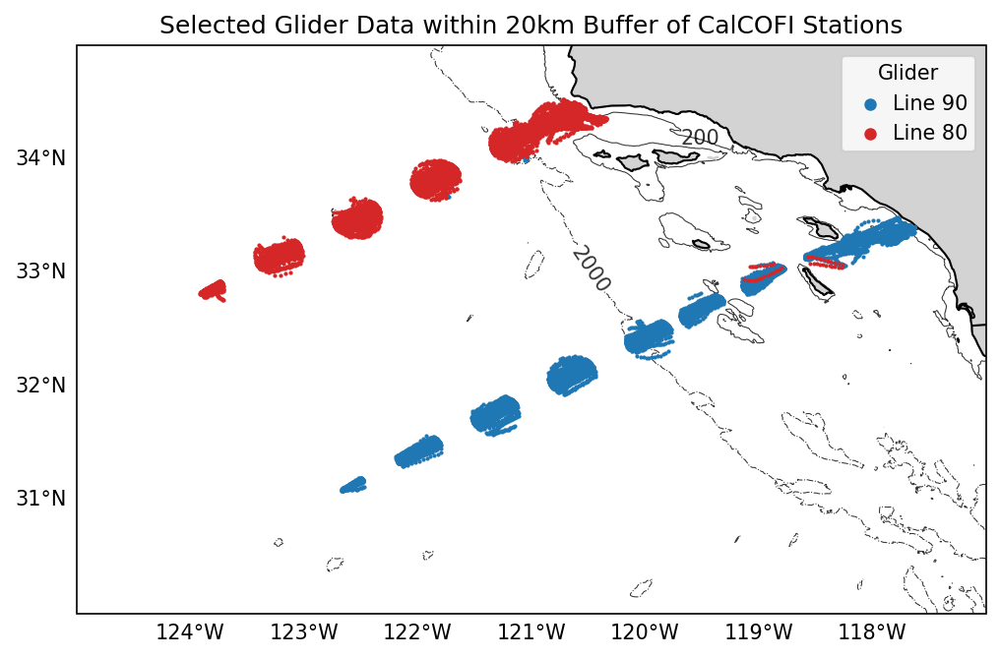

In [231]:
#Stationary Map of CalCOFI data
#open glider data
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_90_20kmBuffer.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_80_20kmBuffer.nc']

latr = [30, 35] 
lonr = [-125, -117] 

# Select a region of our data, giving it a margin
margin = 0.0
region = np.array([[latr[0]-margin,latr[1]+margin],[lonr[0]-margin,lonr[1]+margin]]) 

#add state outlines
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')

# Create and set the figure context
fig = plt.figure(figsize=(10,5), dpi = 150) 
ax = plt.axes(projection=ccrs.PlateCarree()) 

ax.coastlines(resolution='10m',linewidth=1,color='black', zorder = 3) 
ax.add_feature(cfeature.LAND, color='lightgrey', alpha=1)
ax.add_feature(states_provinces, linewidth = 0.5)
ax.add_feature(cfeature.BORDERS)
# ax.set_xticks(np.round([*np.arange(-180, 180,1)],0), crs=ccrs.PlateCarree()) 
# ax.set_yticks(np.round([*np.arange(-90, 90)],1), crs=ccrs.PlateCarree()) 
ax.set_extent([region[1,0],region[1,1],region[0,0],region[0,1]],crs=ccrs.PlateCarree()) 
gl = ax.gridlines(linestyle = 'dotted', color = 'white', alpha = 0, zorder = 10, draw_labels=True, y_inline = False)
gl.xlabels_top = False
gl.ylabels_right = False
ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

for file, lab, col in zip(files, ['Line 90', 'Line 80'], ['tab:blue', 'tab:red']): 
    glider = xr.open_dataset(file)
    glider.close()

    ax.scatter(glider.lon, glider.lat, c = col, transform = ccrs.PlateCarree(), zorder = 5, label = lab, s = 1)


lgnd = plt.legend(loc = 'upper right', title = 'Glider', handletextpad = 0.1)

for handle in lgnd.legend_handles:
    handle.set_sizes([25])
    handle.set_alpha([1])


#add bathymetry line
positions = [(-119.5, 34.25)]
CS = depth.where((depth.depth <= 400) & (depth.depth >= 0), drop = True).depth.plot.contour(x = 'lon', ax = ax, colors = 'k', levels = 1, linestyles = 'solid', transform = ccrs.PlateCarree(), linewidths = 0.5, alpha = 0.8)
ax.clabel(CS, CS.levels, inline=True, fontsize=10, manual = positions)

positions = [(-120.5, 33)]
CS = depth.where((depth.depth <= 4000) & (depth.depth >= 0), drop = True).depth.plot.contour(x = 'lon', ax = ax, colors = 'k', levels = 1, linestyles = 'dashdot', transform = ccrs.PlateCarree(), linewidths = 0.5, alpha = 0.8)
ax.clabel(CS, CS.levels, inline=True, fontsize=10, manual = positions)

plt.title('Selected Glider Data within 20km Buffer of CalCOFI Stations')
plt.xlabel(None)
plt.ylabel(None)
plt.gca().set_aspect('equal')
plt.savefig('./figures/Glider_20kmBuffer_Map.png', bbox_inches = 'tight', dpi = 300)


In [8]:
###Correlation 

###Spatially/Temporally Colocate Data
#instantiate variables
spatial_buffer = 20 #20 km

#open krill data
# krill_comb = pd.read_csv('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/calcofi/ZooScan/ZooScan_combined.csv', parse_dates = ['DateTime'])
# krill_comb = pd.read_csv('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/calcofi/ZooScan/ZooScan_combined.csv', parse_dates = ['DateTime'])
krill_comb = pd.read_csv('/Users/gammonkoval/Desktop/ZooScan_combined.csv', parse_dates = ['DateTime'])

#open glider data
# files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/raw/CUGN_line_90.nc',
#          '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/raw/CUGN_line_80.nc']
files = ['/Users/gammonkoval/Desktop/CUGN_line_90.nc',
         '/Users/gammonkoval/Desktop/CUGN_line_80.nc']


# glider_sel = xr.Dataset()
krill_colocate = pd.DataFrame()

for file in files:

    glider = xr.open_dataset(file)
    glider.close()
    
    #add in season based on JDate
    glider['jdate'] = glider['time'].dt.strftime('%j').astype(int)
    glider['season'] = np.nan
    glider['season'] = xr.where((glider['jdate'] >= 8) & (glider['jdate'] <= 42), 'Winter', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 81) & (glider['jdate'] <= 119), 'Spring', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 185) & (glider['jdate'] <= 233), 'Summer', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 292) & (glider['jdate'] <= 325), 'Fall', glider['season'])
    glider = glider.assign_coords(season = glider.season)
    
    #convert glider to points
    glider_points = glider[['lat', 'lon', 'time']].to_dataframe()
    glider_points = gpd.GeoDataFrame(glider_points, geometry=gpd.points_from_xy(glider_points.lon, glider_points.lat), crs="EPSG:4326")


    #loop through each krill point
    for i in tqdm.tqdm(range(len(krill_comb))):
        temp = krill_comb.loc[[i]]
        temp['DateTime'] = temp['DateTime'].dt.tz_localize('US/Pacific', ambiguous = True).dt.tz_convert('UTC')
    
        #convert to geodataframe
        temp = gpd.GeoDataFrame(temp, geometry=gpd.points_from_xy(temp.longitude, temp.latitude), crs="EPSG:4326")
        
        #add buffer
        temp['geometry'] = temp.to_crs('epsg:32611').buffer(spatial_buffer * 1000).to_crs('epsg:4326')
        
        #select glider points within line polygon
        glider_points_sel = gpd.sjoin(glider_points, temp, op = 'within')
    
        if len(glider_points_sel.index) != 0:
        
            #select out matching glider points
            glider_temp = glider.where((glider.profile.isin(glider_points_sel.index)) & (glider.depth <= 210), drop = True)#.mean(dim = 'depth')

            # glider_temp = glider_temp.where(glider_temp.depth <= 210, drop = True)#.resample(time = '7D').mean(...)
            glider_temp = glider_temp.assign(little_sv = 10**(glider_temp.acoustic_backscatter/10))
            glider_temp = glider_temp.mean(dim = 'depth')
            glider_temp = glider_temp.assign(big_sv = 10*np.log10(glider_temp.little_sv))

            
            #select points within a time period
            glider_temp = glider_temp.where((glider_temp.season == temp['season'].values[0]) & (glider_temp.time.dt.year == temp['DateTime'].dt.year.values[0]), drop = True)
        
            if len(glider_temp.profile) != 0:
                temp['acoustic_backscatter_mean'] = float(glider_temp.mean(...)['big_sv'].values)
                temp['acoustic_backscatter_sum'] = float(glider_temp.sum(...)['big_sv'].values)
                temp['acoustic_backscatter_75th'] = float(glider_temp.quantile([0.75])['big_sv'].values)
                temp['acoustic_backscatter_n'] = len(glider_temp.profile.values)
            else:
                temp['acoustic_backscatter_mean'] = np.nan
                temp['acoustic_backscatter_sum'] = np.nan
                temp['acoustic_backscatter_75th'] = np.nan
                temp['acoustic_backscatter_n'] = 0
                
            krill_colocate = pd.concat([krill_colocate, temp])
        
krill_colocate.to_csv('/Users/gammonkoval/Documents/GitHub/gammon_sol/IRA_Krill/data/ZooScan_Colocated_20km_Seasonal.csv')

  0%|                                            | 1/1343 [00:03<1:07:50,  3.03s/it]


KeyboardInterrupt: 

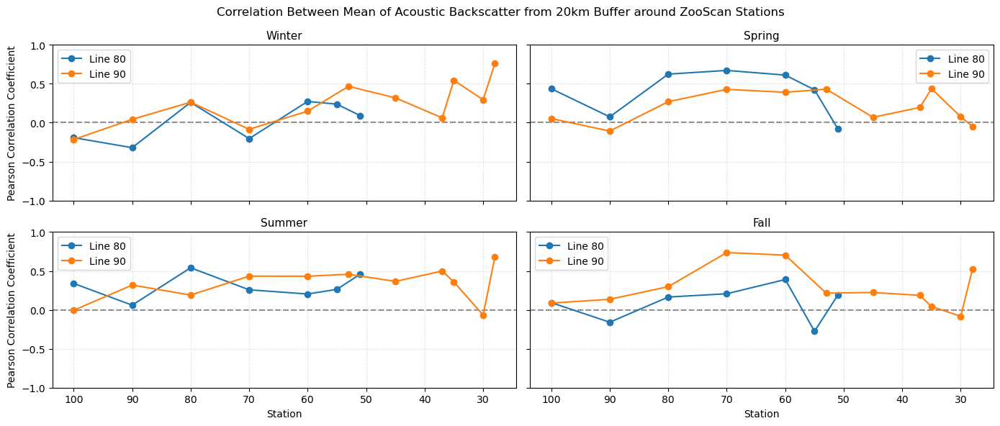

In [416]:
krill_colocate['total_biomass'] = krill_colocate.drop('multiples Estimated C Biomass (mgC m-2)', axis = 1).filter(regex='Biomass').sum(axis = 1)
krill_colocate['total_biomass_log'] = np.log10(krill_colocate.drop('multiples Estimated C Biomass (mgC m-2)', axis = 1).filter(regex='Biomass') + 1).sum(axis = 1)

krill_corr = krill_colocate.groupby(['station', 'line', 'season'])[['total_biomass', 'acoustic_backscatter_mean']].corr().iloc[0::2,-1].to_frame().reset_index()#.drop('level_2', axis = 1)

var = 'acoustic_backscatter_mean'

fig, ax = plt.subplots(2, 2, figsize = (14, 6), sharex = True, sharey = True)

axs = ax.flatten()

for i, seas in zip(range(4), ['Winter', 'Spring', 'Summer', 'Fall']):

    line_80 = krill_corr[(krill_corr['line'] == 80) & (krill_corr['season'] == seas)].groupby('station').mean(numeric_only = True)#.reset_index().set_index('dist_shore').drop('dist_shore_bin', axis = 1)
    line_90 = krill_corr[(krill_corr['line'] == 90) & (krill_corr['season'] == seas)].groupby('station').mean(numeric_only = True)#.reset_index().set_index('dist_shore').drop('dist_shore_bin', axis = 1)
    
    axs[i].plot(line_80.index, line_80[var], c = 'tab:blue', label = 'Line 80', marker = 'o')
    axs[i].plot(line_90.index, line_90[var], c = 'tab:orange', label = 'Line 90', marker = 'o')

    if i in [0, 2]:
        axs[i].set_ylabel('Pearson Correlation Coefficient')
    else: 
        axs[i].set_ylabel(None)
    if i >= 2:
        axs[i].set_xlabel('Station')
    else:
        axs[i].set_xlabel(None)
        
    axs[i].set_title(seas, fontsize = 11)
    axs[i].grid(linestyle = 'dotted', color = 'lightgrey')
    axs[i].legend()
    axs[i].axhline(0, linestyle = 'dashed', color = 'grey', zorder = 0)
    axs[i].set_ylim(-1, 1)

plt.gca().invert_xaxis()

plt.suptitle('Correlation Between Mean of Acoustic Backscatter from 20km Buffer around ZooScan Stations')
plt.tight_layout()
plt.savefig('./figures/Glider_ZooScanStations_Correlations_mean.png', bbox_inches = 'tight', dpi = 300, transparent=True)



### BioVolume

In [6]:
biovol = pd.read_csv('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/calcofi/195101-201607_1701-1704_1802-1804_Zoop_BioVolume.csv', parse_dates = ['Tow_Date'])

biovol = biovol[biovol['Tow_Date'].dt.year >= 2008]

biovol = biovol.assign(Lat_Dec = lambda x: (x['Lat_Deg'].astype(float) + x['Lat_Min'].astype(float)/60),
                       Lon_Dec = lambda x: -1*(x['Lon_Deg'].astype(float) + x['Lon_Min'].astype(float)/60))

depth_list = []
for i in range(len(biovol)):
    depth_list.append(float(depth.interp(lat = biovol.iloc[i]['Lat_Dec'], lon = biovol.iloc[i]['Lon_Dec']).depth.values))

biovol['bathymetry'] = depth_list
biovol.isna().sum()

ID                        0
Cruise                    0
CruiseAlias               0
Sta_ID                    0
Cruz_Sta                  0
Ship_Code                 0
Order_Occ                 0
Cruz_Code                 0
St_Line                   0
St_Station                0
Lat_Deg                   0
Lat_Min                   0
Lat_Hem                   0
Lon_Deg                   0
Lon_Min                   0
Lon_Hem                   0
Tow_Type                  0
Net_Loc                   0
End_Time                  0
Tow_Date                  0
Tow_Time                  0
Vol_StrM3                 5
Tow_DpthM                 0
Ttl_PVolC3             2778
Sml_PVolC3             2778
HaulFact                  5
Ttl_Eggs_Raw           5943
Ttl_Larvae_Raw         5943
Ttl_Eggs_Stnd          5943
Ttl_Larvae_Stnd        5943
Sardine_Eggs_Raw       5943
Sardine_Eggs_Stnd      5943
Anchovy_Eggs_Raw       5943
Anchovy_Eggs_Stnd      5943
Sardine_Larvae_Raw     5943
Sardine_Larvae_Stnd 

In [19]:
###Filter out biovolume data
#normalize data
biovol['Norm_Sml_PVolC3'] = biovol['Sml_PVolC3'] / biovol['Vol_StrM3']

#add in season based on JDate
biovol['jdate'] = biovol['Tow_Date'].dt.strftime('%j').astype(int)
biovol['season'] = np.nan
biovol['season'] = np.where((biovol['jdate'] >= 8) & (biovol['jdate'] <= 42), 'Winter', biovol['season'])
biovol['season'] = np.where((biovol['jdate'] >= 81) & (biovol['jdate'] <= 119), 'Spring', biovol['season'])
biovol['season'] = np.where((biovol['jdate'] >= 185) & (biovol['jdate'] <= 233), 'Summer', biovol['season'])
biovol['season'] = np.where((biovol['jdate'] >= 292) & (biovol['jdate'] <= 325), 'Fall', biovol['season'])

#add inshore/offshore distinction
biovol['Inshore/Offshore'] = np.where(biovol['bathymetry'] > 2205, 'Offshore', 'Inshore')

biovol['year'] = biovol['Tow_Date'].dt.year
biovol.to_csv('/Users/gammonkoval/Documents/GitHub/gammon_sol/IRA_Krill/data/BioVolume_Model_Data.csv')
biovol[biovol['St_Line'].isin([80, 90])]

,ID,Cruise,CruiseAlias,Sta_ID,Cruz_Sta,Ship_Code,Order_Occ,Cruz_Code,St_Line,St_Station,...,Anchovy_Larvae_Raw,Anchovy_Larvae_Stnd,Lat_Dec,Lon_Dec,bathymetry,Norm_Sml_PVolC3,jdate,season,Inshore/Offshore,year
44030,44031,200801,200801,090.0 120.0,20080109001200,JD,17,C,90.0,120.0,...,NaN,NaN,30.416667,-123.998333,4267.35,0.088717,11,Winter,Offshore,2008
44031,44032,200801,200801,090.0 110.0,20080109001100,JD,18,C,90.0,110.0,...,NaN,NaN,30.750000,-123.333333,4025.50,0.060187,11,Winter,Offshore,2008
44032,44033,200801,200801,090.0 100.0,20080109001000,JD,19,C,90.0,100.0,...,NaN,NaN,31.083333,-122.661667,4016.45,0.983791,11,Winter,Offshore,2008
44033,44034,200801,200801,090.0 100.0,20080109001000,JD,19,C,90.0,100.0,...,NaN,NaN,31.083333,-122.661667,4016.45,NaN,11,Winter,Offshore,2008
44034,44035,200801,200801,090.0 090.0,20080109000900,JD,20,C,90.0,90.0,...,NaN,NaN,31.416667,-121.990000,3901.30,NaN,12,Winter,Offshore,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49866,49867,201804,201804,080.0 080.0,20180408000800,SH,65,C,80.0,80.0,...,NaN,NaN,33.483333,-122.533333,3992.50,0.219501,108,Spring,Offshore,2018
49867,49868,201804,201804,080.0 090.0,20180408000900,SH,66,C,80.0,90.0,...,NaN,NaN,33.150000,-123.221667,4241.80,NaN,108,Spring,Offshore,2018
49868,49869,201804,201804,080.0 090.0,20180408000900,SH,66,C,80.0,90.0,...,NaN,NaN,33.150000,-123.221667,4241.80,0.097466,108,Spring,Offshore,2018
49869,49870,201804,201804,080.0 100.0,20180408001000,SH,67,C,80.0,100.0,...,NaN,NaN,32.815000,-123.905000,4389.96,NaN,109,Spring,Offshore,2018


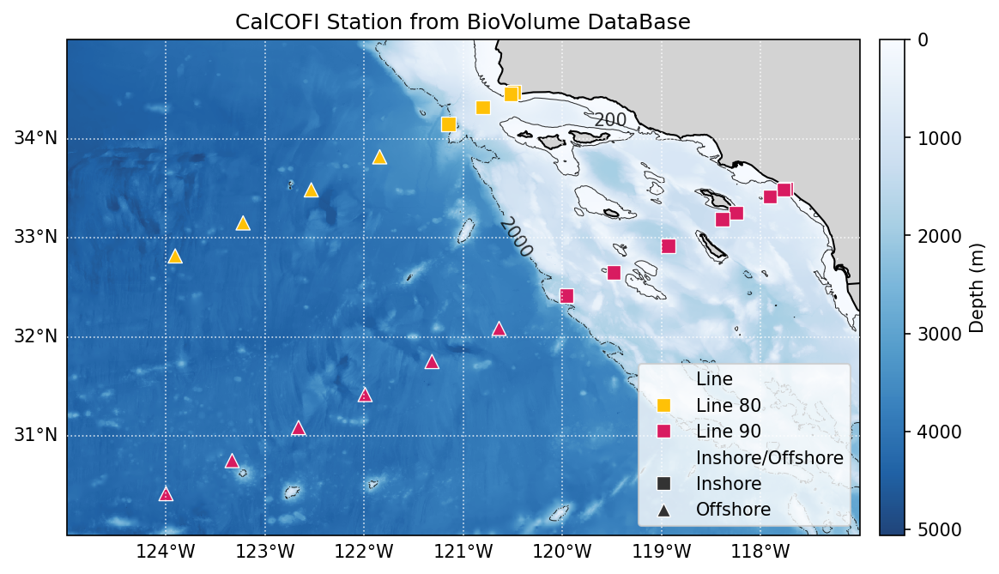

In [155]:
#Stationary Map of CalCOFI data
line_station = biovol.groupby(['St_Line', 'St_Station', 'bathymetry']).size().reset_index().groupby(['St_Line', 'St_Station']).mean().reset_index().rename({'St_Line':'line', 'St_Station':'station'}, axis = 1)
calcofi_sel = calcofi_station.merge(line_station, how = 'outer').dropna(subset = 0)
calcofi_sel = calcofi_sel[calcofi_sel['line'].isin([80, 90])]

#add inshore/offshore
calcofi_sel['Inshore/Offshore'] = np.where(calcofi_sel['bathymetry'] > 2205, 'Offshore', 'Inshore')
calcofi_sel['Line'] = 'Line ' + calcofi_sel['line'].astype(int).astype(str)

depth = xr.open_dataset('./data/GEBCO_18_Oct_2024_72503139a832/gebco_2024_n35.0_s30.0_w-125.0_e-117.0.nc')
depth.close()
depth['elevation_inv'] = depth.elevation * -1
depth['elevation_inv'] = xr.where(depth.elevation_inv < 0, np.nan, depth.elevation_inv)

latr = [30, 35] 
lonr = [-125, -117] 

# Select a region of our data, giving it a margin
margin = 0.0
region = np.array([[latr[0]-margin,latr[1]+margin],[lonr[0]-margin,lonr[1]+margin]]) 

#add state outlines
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')

# Create and set the figure context
fig = plt.figure(figsize=(10,5), dpi = 150) 
ax = plt.axes(projection=ccrs.PlateCarree()) 

ax.coastlines(resolution='10m',linewidth=1,color='black', zorder = 3) 
ax.add_feature(cfeature.LAND, color='lightgrey', alpha=1)
ax.add_feature(states_provinces, linewidth = 0.5)
ax.add_feature(cfeature.BORDERS)
# ax.set_xticks(np.round([*np.arange(-180, 180,1)],0), crs=ccrs.PlateCarree()) 
# ax.set_yticks(np.round([*np.arange(-90, 90)],1), crs=ccrs.PlateCarree()) 
ax.set_extent([region[1,0],region[1,1],region[0,0],region[0,1]],crs=ccrs.PlateCarree()) 
gl = ax.gridlines(linestyle = 'dotted', color = 'white', alpha = 0.8, zorder = 5, draw_labels=True, y_inline = False)
gl.xlabels_top = False
gl.ylabels_right = False
ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

# ax.scatter(calcofi_sel.loc[(calcofi_sel['line'] == 80) & (calcofi_sel['on_off'] == 'inshore'), 'Lon_Dec'], 
#            calcofi_sel.loc[(calcofi_sel['line'] == 80) & (calcofi_sel['on_off'] == 'inshore'), 'Lat_Dec'], 
#            c = 'tab:green', transform = ccrs.PlateCarree(), zorder = 5, label = 'Line 80 - Inshore', edgecolor = 'w', lw = 1, s = 50, marker = '^')
# ax.scatter(calcofi_sel.loc[(calcofi_sel['line'] == 80) & (calcofi_sel['on_off'] == 'offshore'), 'Lon_Dec'], 
#            calcofi_sel.loc[(calcofi_sel['line'] == 80) & (calcofi_sel['on_off'] == 'offshore'), 'Lat_Dec'], 
#            c = 'tab:red', transform = ccrs.PlateCarree(), zorder = 5, label = 'Line 80 - Offshore', edgecolor = 'w', lw = 1, s = 50, marker = '^')

# ax.scatter(calcofi_sel.loc[(calcofi_sel['line'] == 90) & (calcofi_sel['on_off'] == 'inshore'), 'Lon_Dec'], 
#            calcofi_sel.loc[(calcofi_sel['line'] == 90) & (calcofi_sel['on_off'] == 'inshore'), 'Lat_Dec'], 
#            c = 'tab:green', transform = ccrs.PlateCarree(), zorder = 5, label = 'Line 90 - Inshore', edgecolor = 'w', lw = 1, s = 50, marker = 's')
# ax.scatter(calcofi_sel.loc[(calcofi_sel['line'] == 90) & (calcofi_sel['on_off'] == 'offshore'), 'Lon_Dec'], 
#            calcofi_sel.loc[(calcofi_sel['line'] == 90) & (calcofi_sel['on_off'] == 'offshore'), 'Lat_Dec'], 
#            c = 'tab:red', transform = ccrs.PlateCarree(), zorder = 5, label = 'Line 90 - Offshore', edgecolor = 'w', lw = 1, s = 50, marker = 's')
sns.scatterplot(data=calcofi_sel, x='Lon_Dec', y='Lat_Dec', hue='Line', style='Inshore/Offshore', ax = ax, zorder = 5, alpha = 1,
                palette={'Line 80':"#FFC107", 'Line 90':"#D81B60"}, markers=['s', '^'], s = 63)
sns.move_legend(ax, loc='lower right')
# ax.legend(loc = 'upper right')

CS = depth.elevation_inv.plot(ax = ax, x = 'lon', transform = ccrs.PlateCarree(), vmin = 0, cmap = 'Blues', add_colorbar = False, zorder = 0, alpha = 0.9)#cbar_kwargs = {'pad':0.02, 'label':'Depth (m)')
cbar = plt.colorbar(CS, pad = 0.02, label = 'Depth (m)')
cbar.ax.invert_yaxis()
# dist_shore.sel(x = slice(-125, -117), y = slice(35, 30)).band_data.plot(ax = ax, x = 'x', vmin = 0, vmax = 100, cmap = 'jet', transform = ccrs.PlateCarree(), zorder = 0, alpha = 0.5)#vmin = 0, cmap = 'Blues', add_colorbar = False, zorder = 0, alpha = 0.9)#cbar_kwargs = {'pad':0.02, 'label':'Depth (m)')


#add bathymetry line
positions = [(-119.5, 34.25)]
CS = depth.where((depth.elevation >= -400) & (depth.elevation <= 0), drop = True).elevation_inv.plot.contour(x = 'lon', ax = ax, colors = 'k', levels = 1, linestyles = 'solid', transform = ccrs.PlateCarree(), linewidths = 0.5, alpha = 0.8)
ax.clabel(CS, CS.levels, inline=True, fontsize=10, manual = positions)

positions = [(-120.5, 33)]
CS = depth.where((depth.elevation >= -4000) & (depth.elevation <= 0), drop = True).elevation_inv.plot.contour(x = 'lon', ax = ax, colors = 'k', levels = 1, linestyles = 'dashdot', transform = ccrs.PlateCarree(), linewidths = 0.5, alpha = 0.8)
ax.clabel(CS, CS.levels, inline=True, fontsize=10, manual = positions)

plt.title('CalCOFI Station from BioVolume DataBase')
plt.xlabel(None)
plt.ylabel(None)
plt.gca().set_aspect('equal')
plt.savefig('./figures/BioVolume_StationaryMap.png', bbox_inches = 'tight', dpi = 300)


In [6]:
###Filter out ZooScan
zooscan = pd.read_csv('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/calcofi/ZooScan/ZooScan_combined.csv', parse_dates = ['DateTime'])

zooscan = zooscan[zooscan['DateTime'].dt.year >= 2008]

zooscan = zooscan.drop_duplicates()
zooscan.loc[(zooscan['season'] == 'Fall') & (zooscan['pyrosomes Estimated C Biomass (mgC m-2)'] > 10000), 'pyrosomes Estimated C Biomass (mgC m-2)'] = np.nan

#filter out biomass columns
zooscan['total_biomass'] = zooscan.drop('multiples Estimated C Biomass (mgC m-2)', axis = 1).filter(regex='Biomass').sum(axis = 1)
# zooscan['total_biomass_log'] = np.log10(zooscan.drop('multiples Estimated C Biomass (mgC m-2)', axis = 1).filter(regex='Biomass') + 1).sum(axis = 1)
zooscan['total_biomass_log'] = np.log10(zooscan['total_biomass'] + 1)

#filter out copepod biomass columns
zooscan['copepod_biomass'] = zooscan.drop('multiples Estimated C Biomass (mgC m-2)', axis = 1).filter(regex='Biomass').filter(regex = 'cope').sum(axis = 1)
# zooscan['copepod_biomass_log'] = np.log10(zooscan.drop('multiples Estimated C Biomass (mgC m-2)', axis = 1).filter(regex='Biomass').filter(regex = 'cope') + 1).sum(axis = 1)
zooscan['copepod_biomass_log'] = np.log10(zooscan['copepod_biomass'] + 1)


#add inshore/offshore distinction
zooscan['Inshore_Offshore'] = np.where(zooscan['bathymetry'] > 2205, 'Offshore', 'Inshore')

zooscan['year'] = zooscan['DateTime'].dt.year
zooscan['month'] = zooscan['DateTime'].dt.month

zooscan.to_csv('/Users/gammonkoval/Documents/GitHub/gammon_sol/IRA_Krill/data/ZooScan_Model_Data.csv')
zooscan

,Cruise,Cruise mid-date,Station date,Local time (PST),Day or Night,appendicularia Estimated C Biomass (mgC m-2),bryozoan_larvae Abundance (No. per m2),bryozoan_larvae Estimated C Biomass (mgC m-2),chaetognatha Abundance (No. per m2),chaetognatha Estimated C Biomass (mgC m-2),...,bathymetry,dist_shore,season,total_biomass,total_biomass_log,copepod_biomass,copepod_biomass_log,Inshore_Offshore,year,month
10,200801JD,2008-01-14,2008-01-17,00:24,44471.24,156.37,7585.05,5.48,3428.86,40.60,...,615.304561,16.834000,Winter,1621.73,3.210246,1165.77,3.066985,Inshore,2008,1
11,200801JD,2008-01-14,2008-01-17,00:24,44471.24,156.37,7585.05,5.48,3428.86,40.60,...,612.555919,17.000000,Winter,1621.73,3.210246,1165.77,3.066985,Inshore,2008,1
12,200804JD,2008-03-31,2008-03-29,14:27,35380.65,572.38,10951.15,10.19,5054.38,169.85,...,615.344865,17.000600,Spring,5266.48,3.721603,3843.65,3.584857,Inshore,2008,3
13,200808NH,2008-08-20,2008-08-22,17:20,55818.52,334.09,4939.69,2.69,2469.85,40.91,...,619.239520,16.667000,NaN,1834.57,3.263771,833.80,2.921582,Inshore,2008,8
14,200810NH,2008-10-20,2008-10-23,07:52,3455.24,15.63,0.00,0.00,4315.19,62.11,...,619.239520,16.667000,Fall,761.64,2.882320,585.40,2.768194,Inshore,2008,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1338,202304SH,2023-03-31,2023-04-06,21:18,22060.58,55.87,468.12,0.91,3825.28,40.61,...,96.746080,2.583300,Spring,5310.75,3.725238,2434.00,3.386499,Inshore,2023,4
1339,202307SR,2023-07-09,2023-07-11,17:55,8155.54,63.54,0.00,0.00,2306.34,16.31,...,75.174150,2.334296,Summer,3030.39,3.481642,2503.17,3.398664,Inshore,2023,7
1340,202311SR,2023-11-10,2023-11-12,07:59,9375.00,30.78,2922.08,2.50,2181.82,32.74,...,75.174150,2.334296,Fall,643.17,2.809000,462.03,2.665609,Inshore,2023,11
1341,202401RL,2024-01-24,2024-01-26,19:05,9468.03,27.68,538.83,0.47,1235.46,2.76,...,75.174150,2.334296,Winter,296.36,2.473283,202.38,2.308308,Inshore,2024,1


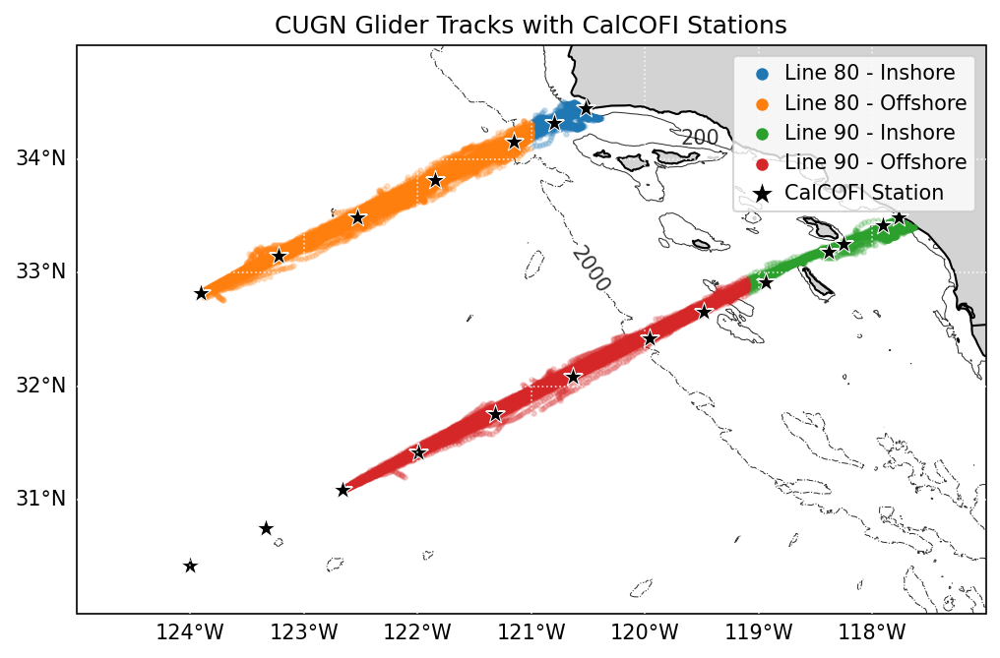

In [228]:
###Glider Map
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc']

depth = xr.open_dataset('./data/GEBCO_18_Oct_2024_72503139a832/gebco_2024_n35.0_s30.0_w-125.0_e-117.0.nc')
depth.close()
depth['elevation_inv'] = depth.elevation * -1
depth['elevation_inv'] = xr.where(depth.elevation_inv < 0, np.nan, depth.elevation_inv)

latr = [30, 35] 
lonr = [-125, -117] 

# Select a region of our data, giving it a margin
margin = 0.0
region = np.array([[latr[0]-margin,latr[1]+margin],[lonr[0]-margin,lonr[1]+margin]]) 

#add state outlines
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='10m',
        facecolor='none')

# Create and set the figure context
fig = plt.figure(figsize=(10,5), dpi = 150) 
ax = plt.axes(projection=ccrs.PlateCarree()) 

ax.coastlines(resolution='10m',linewidth=1,color='black', zorder = 3) 
ax.add_feature(cfeature.LAND, color='lightgrey', alpha=1)
ax.add_feature(states_provinces, linewidth = 0.5)
ax.add_feature(cfeature.BORDERS)
# ax.set_xticks(np.round([*np.arange(-180, 180,1)],0), crs=ccrs.PlateCarree()) 
# ax.set_yticks(np.round([*np.arange(-90, 90)],1), crs=ccrs.PlateCarree()) 
ax.set_extent([region[1,0],region[1,1],region[0,0],region[0,1]],crs=ccrs.PlateCarree()) 
gl = ax.gridlines(linestyle = 'dotted', color = 'white', alpha = 0.8, zorder = 5, draw_labels=True, y_inline = False)
gl.xlabels_top = False
gl.ylabels_right = False
ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

glider_comb = pd.DataFrame()

for file in files:

    glider = xr.open_dataset(file)
    glider.close()
    
    #add in season based on JDate
    glider['jdate'] = glider['time'].dt.strftime('%j').astype(int)
    glider['season'] = np.nan
    glider['season'] = xr.where((glider['jdate'] >= 8) & (glider['jdate'] <= 42), 'Winter', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 81) & (glider['jdate'] <= 119), 'Spring', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 185) & (glider['jdate'] <= 233), 'Summer', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 292) & (glider['jdate'] <= 325), 'Fall', glider['season'])
    
    glider = glider['season'].to_dataframe().dropna(subset = 'season')
    
    # depth_list = []
    # for i in tqdm.tqdm(range(len(glider))):
    #     depth_list.append(float(depth.interp(lat = glider.iloc[i]['lat'], lon = glider.iloc[i]['lon']).elevation_inv.values))
    
    # glider['bathymetry'] = depth_list
    
    if '80' in file:
        glider['Line'] = 'Line 80'
    else:
        glider['Line'] = 'Line 90'

    glider['Inshore/Offshore'] = np.nan
    glider.loc[(glider['Line'] == 'Line 80') & (glider['lon'] < -121), 'Inshore/Offshore'] = 'Offshore'
    glider.loc[(glider['Line'] == 'Line 80') & (glider['lon'] >= -121), 'Inshore/Offshore'] = 'Inshore'
        
    glider.loc[(glider['Line'] == 'Line 90') & (glider['lon'] < -119.1), 'Inshore/Offshore'] = 'Offshore'
    glider.loc[(glider['Line'] == 'Line 90') & (glider['lon'] >= -119.1), 'Inshore/Offshore'] = 'Inshore'

    glider_comb = pd.concat([glider_comb, glider])

# sns.scatterplot(data=glider_comb, x='lon', y='lat', hue='Line', style='Inshore/Offshore', ax = ax, zorder = 5, alpha = 0.2,
#                 palette={'Line 80':"#FFC107", 'Line 90':"#D81B60"}, markers=['s', '^'], s = 5)

# sns.move_legend(ax, loc='lower right')


ax.scatter(glider_comb.loc[(glider_comb['Line'] == 'Line 80') & (glider_comb['Inshore/Offshore'] == 'Inshore'), 'lon'], 
           glider_comb.loc[(glider_comb['Line'] == 'Line 80') & (glider_comb['Inshore/Offshore'] == 'Inshore'), 'lat'], 
           c = 'tab:blue', transform = ccrs.PlateCarree(), zorder = 5, label = 'Line 80 - Inshore', s = 5, alpha = 0.2)
ax.scatter(glider_comb.loc[(glider_comb['Line'] == 'Line 80') & (glider_comb['Inshore/Offshore'] == 'Offshore'), 'lon'], 
           glider_comb.loc[(glider_comb['Line'] == 'Line 80') & (glider_comb['Inshore/Offshore'] == 'Offshore'), 'lat'], 
           c = 'tab:orange', transform = ccrs.PlateCarree(), zorder = 5, label = 'Line 80 - Offshore', s = 5, alpha = 0.2)

ax.scatter(glider_comb.loc[(glider_comb['Line'] == 'Line 90') & (glider_comb['Inshore/Offshore'] == 'Inshore'), 'lon'], 
           glider_comb.loc[(glider_comb['Line'] == 'Line 90') & (glider_comb['Inshore/Offshore'] == 'Inshore'), 'lat'], 
           c = 'tab:green', transform = ccrs.PlateCarree(), zorder = 5, label = 'Line 90 - Inshore', s = 5, alpha = 0.2)
ax.scatter(glider_comb.loc[(glider_comb['Line'] == 'Line 90') & (glider_comb['Inshore/Offshore'] == 'Offshore'), 'lon'], 
           glider_comb.loc[(glider_comb['Line'] == 'Line 90') & (glider_comb['Inshore/Offshore'] == 'Offshore'), 'lat'], 
           c = 'tab:red', transform = ccrs.PlateCarree(), zorder = 5, label = 'Line 90 - Offshore', s = 5, alpha = 0.2)


ax.scatter(calcofi_sel['Lon (dec)'], calcofi_sel['Lat (dec)'],  zorder = 5, label = 'CalCOFI Station', c = 'k', marker = '*', edgecolor = 'w', s = 100, lw = 0.5)


lgnd = ax.legend(loc = 'upper right', handletextpad = 0.1)
for i, handle in zip(range(len(lgnd.legend_handles)), lgnd.legend_handles):
    if i != 4:
        handle.set_sizes([25])
    else:
        handle.set_sizes([150])
    handle.set_alpha([1])

temp = gpd.read_file('/Users/gammonkoval/Downloads/CalCOFI_113StationMap.kml')
temp['Station'] = temp['Name'].str.split(' ').str[0]
temp['Station'] = temp['Station'].astype(float)
# temp[(temp['Station'] == 80) | (temp['Station'] == 90)].plot(ax = ax, zorder = 10, facecolor = 'pink')

# sns.scatterplot(data=calcofi_sel, x='Lon (dec)', y='Lat (dec)', ax = ax, zorder = 5)#, hue='Line', style='Inshore/Offshore', ax = ax, zorder = 5, alpha = 1,
                # palette={'Line 80':"#FFC107", 'Line 90':"#D81B60"}, markers=['s', '^'], s = 63)
# sns.move_legend(ax, loc='lower right')




# CS = depth.elevation_inv.plot(ax = ax, x = 'lon', transform = ccrs.PlateCarree(), vmin = 0, cmap = 'Blues', add_colorbar = False, zorder = 0, alpha = 0.9)#cbar_kwargs = {'pad':0.02, 'label':'Depth (m)')
# cbar = plt.colorbar(CS, pad = 0.02, label = 'Depth (m)')
# cbar.ax.invert_yaxis()
# dist_shore.sel(x = slice(-125, -117), y = slice(35, 30)).band_data.plot(ax = ax, x = 'x', vmin = 0, vmax = 100, cmap = 'jet', transform = ccrs.PlateCarree(), zorder = 0, alpha = 0.5)#vmin = 0, cmap = 'Blues', add_colorbar = False, zorder = 0, alpha = 0.9)#cbar_kwargs = {'pad':0.02, 'label':'Depth (m)')

#add bathymetry line
positions = [(-119.5, 34.25)]
CS = depth.where((depth.elevation >= -400) & (depth.elevation <= 0), drop = True).elevation_inv.plot.contour(x = 'lon', ax = ax, colors = 'k', levels = 1, linestyles = 'solid', transform = ccrs.PlateCarree(), linewidths = 0.5, alpha = 0.8)
ax.clabel(CS, CS.levels, inline=True, fontsize=10, manual = positions)

positions = [(-120.5, 33)]
CS = depth.where((depth.elevation >= -4000) & (depth.elevation <= 0), drop = True).elevation_inv.plot.contour(x = 'lon', ax = ax, colors = 'k', levels = 1, linestyles = 'dashdot', transform = ccrs.PlateCarree(), linewidths = 0.5, alpha = 0.8)
ax.clabel(CS, CS.levels, inline=True, fontsize=10, manual = positions)

plt.title('CUGN Glider Tracks with CalCOFI Stations')
plt.xlabel(None)
plt.ylabel(None)
plt.gca().set_aspect('equal')
plt.savefig('./figures/CUGNGlider_StationaryMap.png', bbox_inches = 'tight', dpi = 300)


In [4]:
###Filter out glider data
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc']

glider_comb = pd.DataFrame()

for file in files:

    glider = xr.open_dataset(file)
    glider.close()

    #convert to linear space
    glider = glider.where(glider.depth <= 210, drop = True)#.resample(time = '7D').mean(...)
    glider = glider.assign(little_sv = 10**(glider.acoustic_backscatter/10))
    glider = glider.mean(dim = 'depth')
    glider = glider.assign(big_sv = 10*np.log10(glider.little_sv))
    
    #add in season based on JDate
    glider['jdate'] = glider['time'].dt.strftime('%j').astype(int)
    glider['season'] = np.nan
    glider['season'] = xr.where((glider['jdate'] >= 8) & (glider['jdate'] <= 42), 'Winter', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 81) & (glider['jdate'] <= 119), 'Spring', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 185) & (glider['jdate'] <= 233), 'Summer', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 292) & (glider['jdate'] <= 325), 'Fall', glider['season'])

    glider = glider[['season', 'little_sv', 'big_sv', 'acoustic_backscatter_flag']].to_dataframe().dropna(subset = 'season')
    
    depth_list = []
    for i in tqdm.tqdm(range(len(glider))):
        depth_list.append(float(depth.interp(lat = glider.iloc[i]['lat'], lon = glider.iloc[i]['lon']).depth.values))
    
    glider['bathymetry'] = depth_list
    
    glider['Inshore_Offshore'] = np.where(glider['bathymetry'] > 2205, 'Offshore', 'Inshore')

    glider['Inshore_Offshore'] = np.nan


    if '80' in file:
        glider['Line'] = 'Line 80'
        glider.loc[(glider['lon'] < -121), 'Inshore_Offshore'] = 'Offshore'
        glider.loc[(glider['lon'] >= -121), 'Inshore_Offshore'] = 'Inshore'

    else:
        glider['Line'] = 'Line 90'
        glider.loc[(glider['lon'] < -119.5), 'Inshore_Offshore'] = 'Offshore'
        glider.loc[(glider['lon'] >= -119.5), 'Inshore_Offshore'] = 'Inshore'


    #add sunrise and sunset 
    sunrise = []
    sunset = []
    for i in range(len(glider)):
        
        l = LocationInfo('Los Angles', 'US', 'US/Pacific', glider.iloc[i]['lat'], glider.iloc[i]['lon'])
        s = sun(l.observer, date=pd.to_datetime(glider.iloc[i]['time'].strftime('%Y-%m-%d')))
        
        sunrise.append(s["sunrise"].replace(tzinfo=timezone.utc).astimezone(tz=abc))
        sunset.append(s["sunset"].replace(tzinfo=timezone.utc).astimezone(tz=abc))
    
    glider['sunrise'] = sunrise
    glider['sunset'] = sunset
    
    #convert to day and night
    glider['Hours'] = glider['time'].dt.strftime('%H:%M:%S')
    glider['sunrise'] = glider['sunrise'].dt.strftime('%H:%M:%S')
    glider['sunset'] = glider['sunset'].dt.strftime('%H:%M:%S')
    
    glider['Hours'] = pd.to_datetime(glider['Hours'], format='%H:%M:%S')
    glider['sunrise'] = pd.to_datetime(glider['sunrise'], format='%H:%M:%S')
    glider['sunset'] = pd.to_datetime(glider['sunset'], format='%H:%M:%S')
    
    glider['Day_Night'] = "Night"
    glider.loc[(glider['Hours'] > glider['sunrise']) & (glider['Hours'] < glider['sunset']), 'Day_Night'] = "Day"

    glider_comb = pd.concat([glider_comb, glider])

glider_comb['year'] = glider_comb.time.dt.year
glider_comb['month'] = glider_comb.time.dt.month
glider_comb.to_csv('/Users/gammonkoval/Documents/GitHub/gammon_sol/IRA_Krill/data/Glider_Model_Data_newInshoreOffshore.csv')
glider_comb

100%|██████████████████████████████████| 21490/21490 [02:30<00:00, 143.13it/s]


,season,little_sv,big_sv,acoustic_backscatter_flag,lat,lon,lat_uv,lon_uv,time,time_uv,bathymetry,Inshore_Offshore,Line,sunrise,sunset,Hours,Day_Night,year,month
profile,,,,,,,,,,,,,,,,,,,
123,Fall,4.506755e+06,66.538639,0.0,34.271845,-120.609887,34.270060,-120.603355,2005-10-20 15:18:08,2005-10-20 14:46:28,530.905458,Inshore,Line 80,1900-01-01 07:12:18,1900-01-01 18:22:40,1900-01-01 15:18:08,Day,2005,10
124,Fall,3.967046e+06,65.984672,0.0,34.273490,-120.644027,34.273200,-120.635395,2005-10-20 17:32:32,2005-10-20 17:00:44,566.165600,Inshore,Line 80,1900-01-01 07:12:26,1900-01-01 18:22:48,1900-01-01 17:32:32,Day,2005,10
125,Fall,6.256986e+06,67.963652,0.0,34.277200,-120.680515,34.275580,-120.672220,2005-10-20 19:47:16,2005-10-20 19:16:19,608.694539,Inshore,Line 80,1900-01-01 07:12:35,1900-01-01 18:22:56,1900-01-01 19:47:16,Night,2005,10
126,Fall,2.797193e+05,54.467225,0.0,34.274617,-120.716110,34.275985,-120.707120,2005-10-20 22:01:48,2005-10-20 21:29:18,658.306964,Inshore,Line 80,1900-01-01 07:12:43,1900-01-01 18:23:05,1900-01-01 22:01:48,Night,2005,10
127,Fall,4.545906e+06,66.576204,0.0,34.273835,-120.756225,34.272570,-120.747640,2005-10-21 00:38:40,2005-10-21 00:05:20,715.063078,Inshore,Line 80,1900-01-01 07:13:44,1900-01-01 18:22:04,1900-01-01 00:38:40,Night,2005,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59193,Summer,3.107163e+06,64.923641,1.0,33.327742,-117.937400,33.328265,-117.944890,2024-07-28 11:49:44,2024-07-28 11:04:03,644.821819,Inshore,Line 90,1900-01-01 06:02:28,1900-01-01 19:54:22,1900-01-01 11:49:44,Day,2024,7
59194,Summer,2.304615e+06,63.625985,1.0,33.325772,-117.905907,33.326425,-117.913705,2024-07-28 14:55:37,2024-07-28 14:09:54,576.847659,Inshore,Line 90,1900-01-01 06:02:20,1900-01-01 19:54:15,1900-01-01 14:55:37,Day,2024,7
59195,Summer,2.051422e+06,63.120550,1.0,33.326063,-117.871090,33.326185,-117.879750,2024-07-28 18:06:16,2024-07-28 17:21:07,614.277992,Inshore,Line 90,1900-01-01 06:02:12,1900-01-01 19:54:06,1900-01-01 18:06:16,Day,2024,7


In [99]:
# ###Filter out glider data
# files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc',
#          '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc']

# glider_comb = pd.DataFrame()

# for file in files:

#     glider = xr.open_dataset(file)
#     glider.close()

#     #convert to linear space
#     glider = glider.where(glider.depth <= 210, drop = True)#.resample(time = '7D').mean(...)
#     glider = glider.assign(little_sv = 10**(glider.acoustic_backscatter/10))
#     glider = glider.mean(dim = 'depth')
#     glider = glider.assign(big_sv = 10*np.log10(glider.little_sv))
    
#     #add in season based on JDate
#     glider['jdate'] = glider['time'].dt.strftime('%j').astype(int)
#     glider['season'] = np.nan
#     glider['season'] = xr.where((glider['jdate'] >= 8) & (glider['jdate'] <= 42), 'Winter', glider['season'])
#     glider['season'] = xr.where((glider['jdate'] >= 81) & (glider['jdate'] <= 119), 'Spring', glider['season'])
#     glider['season'] = xr.where((glider['jdate'] >= 185) & (glider['jdate'] <= 233), 'Summer', glider['season'])
#     glider['season'] = xr.where((glider['jdate'] >= 292) & (glider['jdate'] <= 325), 'Fall', glider['season'])        

#     glider = glider[['season', 'little_sv', 'big_sv']].to_dataframe().dropna(subset = 'season')
    
#     # depth_list = []
#     # for i in tqdm.tqdm(range(len(glider))):
#     #     depth_list.append(float(depth.interp(lat = glider.iloc[i]['lat'], lon = glider.iloc[i]['lon']).depth.values))
    
#     # glider['bathymetry'] = depth_list
    
#     # glider['Inshore_Offshore'] = np.where(glider['bathymetry'] > 2205, 'Offshore', 'Inshore')

#     if '80' in file:
#         glider['Line'] = 'Line 80'
#     else:
#         glider['Line'] = 'Line 90'

#     glider['Inshore_Offshore'] = np.nan
#     glider.loc[(glider['Line'] == 'Line 80') & (glider['lon'] >= -121), 'Inshore_Offshore'] = 'Offshore'
#     glider.loc[(glider['Line'] == 'Line 80') & (glider['lon'] < -121), 'Inshore_Offshore'] = 'Inshore'
        
#     glider.loc[(glider['Line'] == 'Line 90') & (glider['lon'] >= -119.5), 'Inshore_Offshore'] = 'Offshore'
#     glider.loc[(glider['Line'] == 'Line 90') & (glider['lon'] < -119.5), 'Inshore_Offshore'] = 'Inshore'

#     glider_comb = pd.concat([glider_comb, glider])


#     #add sunrise and sunset 
#     sunrise = []
#     sunset = []
#     for i in range(len(glider)):
        
#         l = LocationInfo('Los Angles', 'US', 'US/Pacific', glider.iloc[i]['lat'], glider.iloc[i]['lon'])
#         s = sun(l.observer, date=pd.to_datetime(glider.iloc[i]['time']))
        
#         sunrise.append(s["sunrise"].replace(tzinfo=timezone.utc).astimezone(tz=abc))
#         sunset.append(s["sunset"].replace(tzinfo=timezone.utc).astimezone(tz=abc))
    
#     glider['sunrise'] = sunrise
#     glider['sunset'] = sunset
    
#     #convert to day and night
#     glider['Hours'] = glider['time'].dt.strftime('%H:%M:%S')
#     glider['sunrise'] = glider['sunrise'].dt.strftime('%H:%M:%S')
#     glider['sunset'] = glider['sunset'].dt.strftime('%H:%M:%S')
    
#     glider['Hours'] = pd.to_datetime(glider['Hours'], format='%H:%M:%S')
#     glider['sunrise'] = pd.to_datetime(glider['sunrise'], format='%H:%M:%S')
#     glider['sunset'] = pd.to_datetime(glider['sunset'], format='%H:%M:%S')
    
#     glider['Day_Night'] = "Night"
#     glider.loc[(glider['Hours'] > glider['sunrise']) & (glider['Hours'] < glider['sunset']), 'Day_Night'] = "Day"
    
#     glider_comb = pd.concat([glider_comb, glider])

# glider_comb['year'] = glider_comb.time.dt.year
# glider_comb['month'] = glider_comb.time.dt.month
# glider_comb.to_csv('/Users/gammonkoval/Documents/GitHub/gammon_sol/IRA_Krill/data/Glider_Model_Data_20kmbuffer.csv')
# glider_comb

,season,little_sv,big_sv,lat,lon,lat_uv,lon_uv,time,time_uv,Line,Inshore_Offshore,sunrise,sunset,Hours,Day_Night,year,month
profile,,,,,,,,,,,,,,,,,
123,Fall,4.506755e+06,66.538639,34.271845,-120.609887,34.270060,-120.603355,2005-10-20 15:18:08,2005-10-20 14:46:28,Line 80,Offshore,NaT,NaT,NaT,NaN,2005,10
124,Fall,3.967046e+06,65.984672,34.273490,-120.644027,34.273200,-120.635395,2005-10-20 17:32:32,2005-10-20 17:00:44,Line 80,Offshore,NaT,NaT,NaT,NaN,2005,10
125,Fall,6.256986e+06,67.963652,34.277200,-120.680515,34.275580,-120.672220,2005-10-20 19:47:16,2005-10-20 19:16:19,Line 80,Offshore,NaT,NaT,NaT,NaN,2005,10
126,Fall,2.797193e+05,54.467225,34.274617,-120.716110,34.275985,-120.707120,2005-10-20 22:01:48,2005-10-20 21:29:18,Line 80,Offshore,NaT,NaT,NaT,NaN,2005,10
127,Fall,4.545906e+06,66.576204,34.273835,-120.756225,34.272570,-120.747640,2005-10-21 00:38:40,2005-10-21 00:05:20,Line 80,Offshore,NaT,NaT,NaT,NaN,2005,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59193,Summer,3.107163e+06,64.923641,33.327742,-117.937400,33.328265,-117.944890,2024-07-28 11:49:44,2024-07-28 11:04:03,Line 90,Offshore,1900-01-01 06:02:28,1900-01-01 19:54:22,1900-01-01 11:49:44,Day,2024,7
59194,Summer,2.304615e+06,63.625985,33.325772,-117.905907,33.326425,-117.913705,2024-07-28 14:55:37,2024-07-28 14:09:54,Line 90,Offshore,1900-01-01 06:02:20,1900-01-01 19:54:15,1900-01-01 14:55:37,Day,2024,7
59195,Summer,2.051422e+06,63.120550,33.326063,-117.871090,33.326185,-117.879750,2024-07-28 18:06:16,2024-07-28 17:21:07,Line 90,Offshore,1900-01-01 06:02:12,1900-01-01 19:54:06,1900-01-01 18:06:16,Day,2024,7


In [75]:
# ###Filter out glider data by CalCOFI station
# #open krill data
# krill_comb = pd.read_csv('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/calcofi/ZooScan/ZooScan_combined.csv', parse_dates = ['DateTime'])
# calcofi_station = pd.read_csv('/Users/gammonkoval/Downloads/CalCOFIStationOrder.csv')
# line_station = krill_comb.groupby(['line', 'station']).size().reset_index()
# calcofi_sel = calcofi_station.merge(line_station.rename({'line':'Line', 'station':'Sta'}, axis = 1), how = 'outer').dropna(subset = 0)

# spatial_buffer = 20 #km


# files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc',
#          '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc']

# glider_comb = pd.DataFrame()

# for file in files:

#     glider = xr.open_dataset(file)
#     glider.close()

#     #convert to linear space
#     glider = glider.where(glider.depth <= 210, drop = True)#.resample(time = '7D').mean(...)
#     glider = glider.assign(little_sv = 10**(glider.acoustic_backscatter/10))
#     glider = glider.mean(dim = 'depth')
#     glider = glider.assign(big_sv = 10*np.log10(glider.little_sv))
    
#     #add in season based on JDate
#     glider['jdate'] = glider['time'].dt.strftime('%j').astype(int)
#     glider['season'] = np.nan
#     glider['season'] = xr.where((glider['jdate'] >= 8) & (glider['jdate'] <= 42), 'Winter', glider['season'])
#     glider['season'] = xr.where((glider['jdate'] >= 81) & (glider['jdate'] <= 119), 'Spring', glider['season'])
#     glider['season'] = xr.where((glider['jdate'] >= 185) & (glider['jdate'] <= 233), 'Summer', glider['season'])
#     glider['season'] = xr.where((glider['jdate'] >= 292) & (glider['jdate'] <= 325), 'Fall', glider['season'])

#     for sta in calcofi_sel.index:
    
#         #convert glider to points
#         glider_points = glider[['lat', 'lon', 'time']].to_dataframe()
#         glider_points = gpd.GeoDataFrame(glider_points, geometry=gpd.points_from_xy(glider_points.lon, glider_points.lat), crs="EPSG:4326")
        
#         #convert to geodataframe
#         calcofi_temp = gpd.GeoDataFrame(calcofi_sel.loc[[sta]], geometry=gpd.points_from_xy(calcofi_sel.loc[[sta]]['Lon (dec)'], calcofi_sel.loc[[sta]]['Lat (dec)']), crs="EPSG:4326")
        
#         #add buffer
#         calcofi_temp['geometry'] = calcofi_temp.to_crs('epsg:32611').buffer(spatial_buffer * 1000).to_crs('epsg:4326')
            
#         #select glider points within line polygon
#         glider_points_sel = gpd.sjoin(glider_points, calcofi_temp, op = 'within')
        
#         glider_temp = glider.where(glider.profile.isin(glider_points_sel.index), drop = True)

#         if len(glider_temp.profile.values) == 0:
#             pass

#         glider_temp = glider_temp[['season', 'little_sv', 'big_sv']].to_dataframe().dropna(subset = 'season')

#         glider_temp['Line'] = calcofi_temp['Line']
#         glider_temp['Station'] = calcofi_temp['Sta']

        
#     #     depth_list = []
#     #     for i in tqdm.tqdm(range(len(glider))):
#     #         depth_list.append(float(depth.interp(lat = glider.iloc[i]['lat'], lon = glider.iloc[i]['lon']).depth.values))
        
#     #     glider['bathymetry'] = depth_list
        
#     #     glider['Inshore_Offshore'] = np.where(glider['bathymetry'] > 2205, 'Offshore', 'Inshore')
    
#     #     if '80' in file:
#     #         glider['Line'] = 'Line 80'
#     #     else:
#     #         glider['Line'] = 'Line 90'
    
#     #     #add sunrise and sunset 
#     #     sunrise = []
#     #     sunset = []
#     #     for i in range(len(glider)):
            
#     #         l = LocationInfo('Los Angles', 'US', 'US/Pacific', glider.iloc[i]['lat'], glider.iloc[i]['lon'])
#     #         s = sun(l.observer, date=pd.to_datetime(glider.iloc[i]['time'].strftime('%Y-%m-%d')))
            
#     #         sunrise.append(s["sunrise"].replace(tzinfo=timezone.utc).astimezone(tz=abc))
#     #         sunset.append(s["sunset"].replace(tzinfo=timezone.utc).astimezone(tz=abc))
        
#     #     glider['sunrise'] = sunrise
#     #     glider['sunset'] = sunset
        
#     #     #convert to day and night
#     #     glider['Hours'] = glider['time'].dt.strftime('%H:%M:%S')
#     #     glider['sunrise'] = glider['sunrise'].dt.strftime('%H:%M:%S')
#     #     glider['sunset'] = glider['sunset'].dt.strftime('%H:%M:%S')
        
#     #     glider['Hours'] = pd.to_datetime(glider['Hours'], format='%H:%M:%S')
#     #     glider['sunrise'] = pd.to_datetime(glider['sunrise'], format='%H:%M:%S')
#     #     glider['sunset'] = pd.to_datetime(glider['sunset'], format='%H:%M:%S')
        
#     #     glider['Day_Night'] = "Night"
#     #     glider.loc[(glider['Hours'] > glider['sunrise']) & (glider['Hours'] < glider['sunset']), 'Day_Night'] = "Day"
        
#     #     glider_comb = pd.concat([glider_comb, glider])
    
#     # glider_comb['year'] = glider_comb.time.dt.year
#     # glider_comb['month'] = glider_comb.time.dt.month
#     # # glider_comb.to_csv('/Users/gammonkoval/Documents/GitHub/gammon_sol/IRA_Krill/data/Glider_Model_Data_20kmbuffer.csv')
#     # glider_comb

Text(0.5, 1.0, 'Mean Backscatter by Depth summarized by Mission')

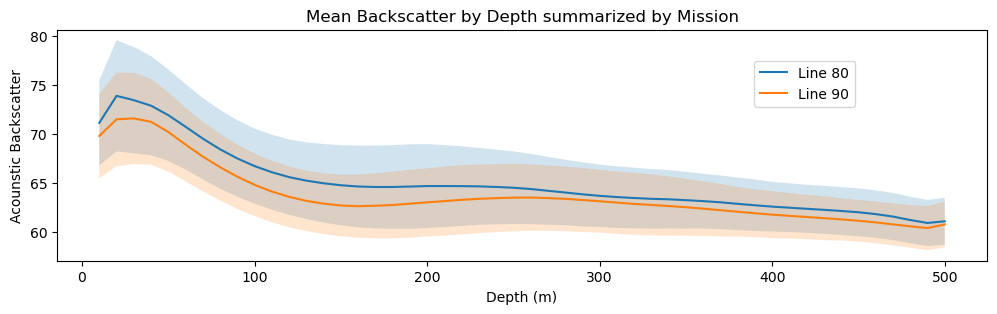

In [53]:
fig, ax = plt.subplots(1, 1, figsize = (12, 3))

for glider_num in [80, 90]:

    test = xr.open_dataset('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/Raw/CUGN_line_'+str(glider_num)+'.nc')
    test.close()
    
    
    # test = test.where(test['lon'] < -121, drop = True)
    
    
    test_mean = test.groupby('mission').mean()['acoustic_backscatter'].mean(dim = 'mission').to_dataframe()#.plot(ax = ax, label = 'Mean')
    test_std = test.groupby('mission').std()['acoustic_backscatter'].mean(dim = 'mission').to_dataframe()#.plot(ax = ax1, color = 'tab:orange', label = 'Std')
    
    plt.plot(test_mean.index, test_mean.acoustic_backscatter, label = 'Line ' + str(glider_num))
    plt.fill_between(test_mean.index, test_mean.acoustic_backscatter - test_std.acoustic_backscatter, test_mean.acoustic_backscatter + test_std.acoustic_backscatter, alpha = 0.2)

ax.set_ylabel('Acounstic Backscatter')
ax.set_xlabel('Depth (m)')
# ax1.set_ylabel('Standard Deviation Backscatter', color = 'tab:orange')
fig.legend(loc = 'upper left', bbox_to_anchor = (0.7, 0.8))
plt.title('Mean Backscatter by Depth summarized by Mission')



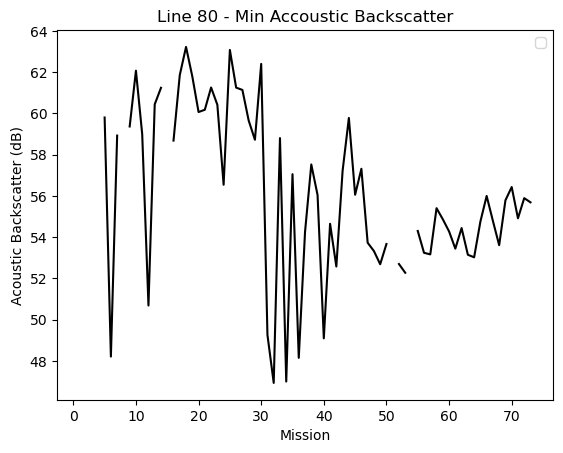

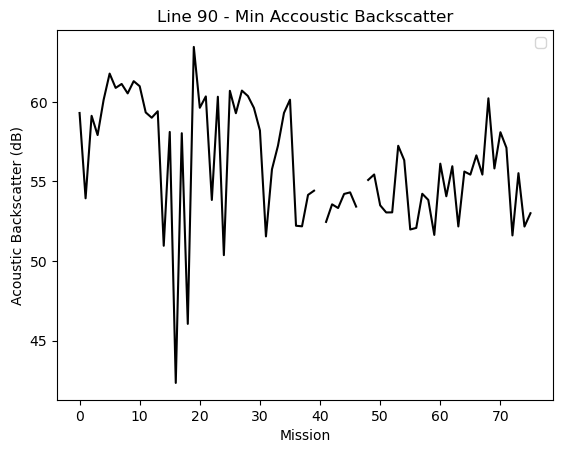

In [5]:
# temp = test.where(test['lon'] < -121, drop = True)
for glider_num in [80, 90]:
    
    test = xr.open_dataset('/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/Raw/CUGN_line_'+str(glider_num)+'.nc')
    test.close()
    
    temp = test.copy()
    # temp = test.where(test['lon'] < -121, drop = True)
    
    # convert to linear space
    temp = temp.assign(little_sv = 10**(temp.acoustic_backscatter/10))
    temp = temp.sel(depth = slice(450, 500)).mean(dim = 'depth')
    temp = temp.assign(big_sv = 10*np.log10(temp.little_sv))
    temp.groupby('mission').min()['big_sv'].plot(color = 'black')
    
    # temp_temp = temp.groupby('mission').quantile(0.01)
    
    # plt.scatter(temp_temp.where(temp_temp.acoustic_backscatter_flag == 1, drop = True)['mission'], 
    #             temp_temp.where(temp_temp.acoustic_backscatter_flag == 1, drop = True)['acoustic_backscatter'], label = '1,000 khz', zorder = 10)
    
    # plt.scatter(temp_temp.where(temp_temp.acoustic_backscatter_flag == 0, drop = True)['mission'], 
    #             temp_temp.where(temp_temp.acoustic_backscatter_flag == 0, drop = True)['acoustic_backscatter'], label = '750 khz', zorder = 10)
    
    
    plt.legend()
    plt.ylabel('Acoustic Backscatter (dB)')
    plt.xlabel('Mission')
    plt.title('Line '+str(glider_num)+' - Min Accoustic Backscatter')
    # plt.ylim(52, 64)
    # temp.sel(depth = slice(450, 500)).groupby('mission').mean().mean(dim = 'depth')['acoustic_backscatter'].plot.scatter(c = 'acoustic_backscatter_flag')
    # test.groupby('mission').quantile(0.01).mean(dim = 'depth')['acoustic_backscatter'].plot()
    plt.show()

In [ ]:
for i in np.unique(test.mission.values):
    
    plt.hist(test.where(test.mission == i, drop = True).sel(depth = slice(450, 500)).mean(dim = 'depth').acoustic_backscatter)

    plt.yscale('log')

Text(0, 0.5, 'Biomass (mgC m-2)')

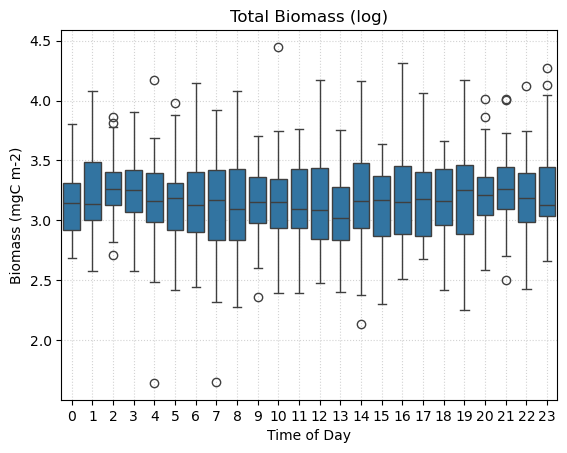

In [102]:
krill = pd.read_csv('/Users/gammonkoval/Documents/GitHub/gammon_sol/IRA_Krill/data/ZooScan_Model_Data.csv', index_col = [0], parse_dates = ['Cruise_DateTime'])
krill['Local time (PST)'] = pd.to_datetime(krill['Local time (PST)'], format = '%H:%M')

krill['log_krill'] = np.log(krill['euphausiids Estimated C Biomass (mgC m-2)'])

krill['tod'] = krill['Local time (PST)'].dt.hour
krill = krill.groupby(['season', 'Inshore_Offshore', 'year', 'tod']).mean(numeric_only = True).reset_index()

sns.boxplot(data=krill, x="tod", y="total_biomass_log")
plt.xlabel('Time of Day')
plt.grid(linestyle = 'dotted', color = 'lightgrey')
plt.title('Total Biomass (log)')
plt.ylabel('Biomass (mgC m-2)')

Take 1% value for every mission from the whole water column and subtract from each mission, set values below 1% as 0

### Standardization

100%|███████████████████████████████████████████| 76/76 [00:00<00:00, 85.41it/s]


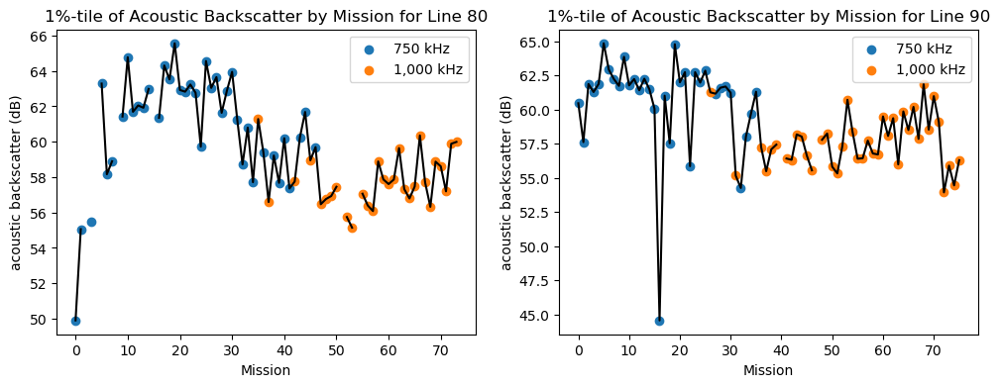

In [101]:
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc']


fig, ax = plt.subplots(1, 2, figsize = (12, 4))

for i, file in enumerate(files):

    test = xr.open_dataset(file)
    test.close()
    
    min_val = []
    mission_val = []
    
    for var in tqdm.tqdm(np.unique(test.mission.values)):
        temp = test.where(test.mission == var, drop = True)
        mission_val.append(var)
        min_val.append(temp['acoustic_backscatter'].to_dataframe().reset_index()['acoustic_backscatter'].quantile(0.1))
    
    temp = pd.DataFrame({'Mission':mission_val, '1 Percent Value':min_val})
    
    test_df = test.isel(depth = 0)[['mission', 'acoustic_backscatter_flag']].to_dataframe().groupby(['mission', 'acoustic_backscatter_flag']).size().to_frame().reset_index()
    temp = temp.merge(test_df.rename({'mission':'Mission'}, axis = 1), how = 'outer')
    
    
    ax[i].plot(temp['Mission'], temp['1 Percent Value'], c = 'k')
    
    for flag, col, label in zip(range(2), ['tab:blue', 'tab:orange'], ['750 kHz', '1,000 kHz']):
        temp_temp = temp[temp['acoustic_backscatter_flag'] == flag]
        ax[i].scatter(temp_temp['Mission'], temp_temp['1 Percent Value'], c = col, label = label)
    
    ax[i].legend()
    ax[i].set_xlabel('Mission')
    ax[i].set_ylabel('acoustic backscatter (dB)')
    if i == 0:
        ax[i].set_title('1%-tile of Acoustic Backscatter by Mission for Line 80')
    else:
        ax[i].set_title('1%-tile of Acoustic Backscatter by Mission for Line 90')

plt.savefig('./figures/CUGN_1percentiles.png', bbox_inches = 'tight', dpi = 300)


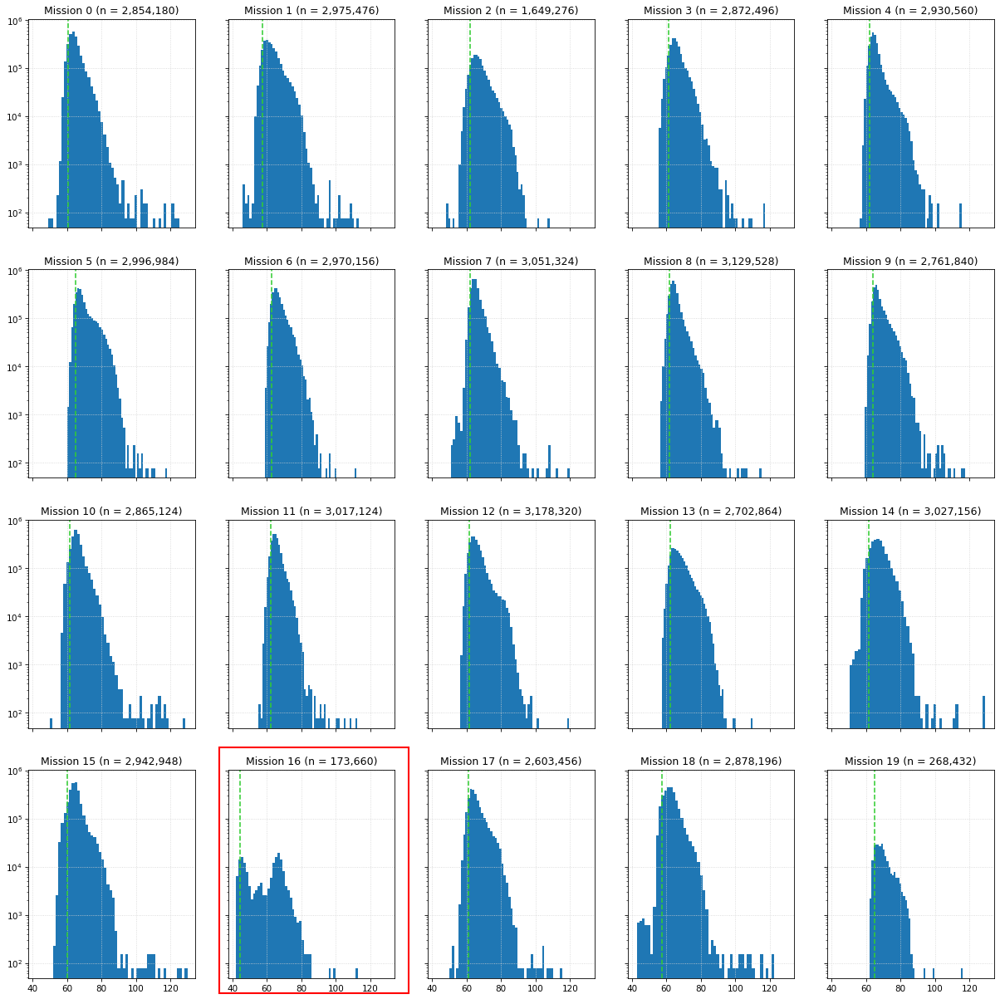

In [100]:
import matplotlib 

# i = 16
# for i in range(17):
#     testing = test.where(test.mission == i, drop = True).to_dataframe().dropna(subset = 'acoustic_backscatter')#.acoustic_backscatter.plot(y = 'depth')

# # plt.scatter(testing['lon'], testing['lat'], c = testing['acoustic_backscatter'], cmap = 'jet')
# # plt.colorbar()
#     plt.hist(testing['acoustic_backscatter'], bins = 50)
#     plt.yscale('log')
#     plt.title('Mission ' + str(i) + '(n = ' + str(len(testing)) + ')')
#     plt.show()


# testing = test.where(test.mission.isin([*range(20)]), drop = True).to_dataframe().dropna(subset = 'acoustic_backscatter')

fig, ax = plt.subplots(4, 5, sharex = True, sharey = True, figsize = (20, 20), dpi = 75)

axs = ax.flatten()

for i in range(20):
    testing_temp = testing[testing['mission'] == i]

    axs[i].hist(testing_temp['acoustic_backscatter'], bins = 50)
    axs[i].set_title('Mission ' + str(i) + ' (n = ' + format(len(testing_temp), ',') + ')')
    axs[i].grid(linestyle = 'dotted', color = 'lightgrey')
    axs[i].axvline(np.quantile(testing_temp['acoustic_backscatter'], 0.1), linestyle = 'dashed', color = 'limegreen')
    
plt.yscale('log')
rect = matplotlib.patches.Rectangle(xy=(-315, 24), width=110, height=3000000, linewidth=2, edgecolor='r', facecolor='none', clip_on=False)
plt.gca().add_patch(rect)
plt.savefig('./figures/Line90_20Missions.png', bbox_inches = 'tight', dpi = 300)
plt.show()

In [7]:
###Filter out glider data
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc']

glider_comb = pd.DataFrame()

for file in files:

    glider = xr.open_dataset(file)
    glider.close()

    #calculate the standardization
    glider_std = xr.Dataset()
    #loop through each glider mission
    for mission in np.unique(glider.mission.values):
        #select out the mission
        temp = glider.where(glider.mission == mission, drop = True)

        #calculate the 1%-tile value
        min_val = temp['acoustic_backscatter'].to_dataframe()['acoustic_backscatter'].quantile(0.01)

        temp = temp.assign(acoustic_backscatter = temp.acoustic_backscatter - min_val)
        temp['acoustic_backscatter'] = xr.where(temp['acoustic_backscatter'] < 0, 0, temp['acoustic_backscatter'])

        glider_std = xr.merge([glider_std, temp])

    glider = glider_std.copy()

    #convert to linear space
    glider = glider.where(glider.depth <= 210, drop = True)#.resample(time = '7D').mean(...)
    glider = glider.assign(little_sv = 10**(glider.acoustic_backscatter/10))
    glider = glider.mean(dim = 'depth')
    glider = glider.assign(big_sv = 10*np.log10(glider.little_sv))
    
    #add in season based on JDate
    glider['jdate'] = glider['time'].dt.strftime('%j').astype(int)
    glider['season'] = np.nan
    glider['season'] = xr.where((glider['jdate'] >= 8) & (glider['jdate'] <= 42), 'Winter', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 81) & (glider['jdate'] <= 119), 'Spring', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 185) & (glider['jdate'] <= 233), 'Summer', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 292) & (glider['jdate'] <= 325), 'Fall', glider['season'])

    glider_test = glider.copy()
    glider = glider[['season', 'little_sv', 'big_sv', 'acoustic_backscatter_flag']].to_dataframe().dropna(subset = 'season')
    
    depth_list = []
    for i in tqdm.tqdm(range(len(glider))):
        depth_list.append(float(depth.interp(lat = glider.iloc[i]['lat'], lon = glider.iloc[i]['lon']).depth.values))
    
    glider['bathymetry'] = depth_list
    
    glider['Inshore_Offshore'] = np.where(glider['bathymetry'] > 2205, 'Offshore', 'Inshore')

    glider['Inshore_Offshore'] = np.nan


    if '80' in file:
        glider['Line'] = 'Line 80'
        glider.loc[(glider['lon'] < -121), 'Inshore_Offshore'] = 'Offshore'
        glider.loc[(glider['lon'] >= -121), 'Inshore_Offshore'] = 'Inshore'

    else:
        glider['Line'] = 'Line 90'
        glider.loc[(glider['lon'] < -119.5), 'Inshore_Offshore'] = 'Offshore'
        glider.loc[(glider['lon'] >= -119.5), 'Inshore_Offshore'] = 'Inshore'


    #add sunrise and sunset 
    sunrise = []
    sunset = []
    for i in range(len(glider)):
        
        l = LocationInfo('Los Angles', 'US', 'US/Pacific', glider.iloc[i]['lat'], glider.iloc[i]['lon'])
        s = sun(l.observer, date=pd.to_datetime(glider.iloc[i]['time'].strftime('%Y-%m-%d')))
        
        sunrise.append(s["sunrise"].replace(tzinfo=timezone.utc).astimezone(tz=abc))
        sunset.append(s["sunset"].replace(tzinfo=timezone.utc).astimezone(tz=abc))
    
    glider['sunrise'] = sunrise
    glider['sunset'] = sunset
    
    #convert to day and night
    glider['Hours'] = glider['time'].dt.strftime('%H:%M:%S')
    glider['sunrise'] = glider['sunrise'].dt.strftime('%H:%M:%S')
    glider['sunset'] = glider['sunset'].dt.strftime('%H:%M:%S')
    
    glider['Hours'] = pd.to_datetime(glider['Hours'], format='%H:%M:%S')
    glider['sunrise'] = pd.to_datetime(glider['sunrise'], format='%H:%M:%S')
    glider['sunset'] = pd.to_datetime(glider['sunset'], format='%H:%M:%S')
    
    glider['Day_Night'] = "Night"
    glider.loc[(glider['Hours'] > glider['sunrise']) & (glider['Hours'] < glider['sunset']), 'Day_Night'] = "Day"

    glider_comb = pd.concat([glider_comb, glider])

glider_comb['year'] = glider_comb.time.dt.year
glider_comb['month'] = glider_comb.time.dt.month
glider_comb.dropna(subset = 'big_sv').to_csv('/Users/gammonkoval/Documents/GitHub/gammon_sol/IRA_Krill/data/Glider_Model_Data_newInshoreOffshore_standardized.csv')
glider_comb

100%|██████████████████████████████████| 21490/21490 [02:31<00:00, 142.14it/s]


,season,little_sv,big_sv,acoustic_backscatter_flag,lat,lon,lat_uv,lon_uv,time,time_uv,bathymetry,Inshore_Offshore,Line,sunrise,sunset,Hours,Day_Night,year,month
profile,,,,,,,,,,,,,,,,,,,
123,Fall,122.945871,20.897139,0.0,34.271845,-120.609887,34.270060,-120.603355,2005-10-20 15:18:08,2005-10-20 14:46:28,530.905458,Inshore,Line 80,1900-01-01 07:12:18,1900-01-01 18:22:40,1900-01-01 15:18:08,Day,2005,10
124,Fall,108.222421,20.343172,0.0,34.273490,-120.644027,34.273200,-120.635395,2005-10-20 17:32:32,2005-10-20 17:00:44,566.165600,Inshore,Line 80,1900-01-01 07:12:26,1900-01-01 18:22:48,1900-01-01 17:32:32,Day,2005,10
125,Fall,170.692793,22.322152,0.0,34.277200,-120.680515,34.275580,-120.672220,2005-10-20 19:47:16,2005-10-20 19:16:19,608.694539,Inshore,Line 80,1900-01-01 07:12:35,1900-01-01 18:22:56,1900-01-01 19:47:16,Night,2005,10
126,Fall,7.630842,8.825725,0.0,34.274617,-120.716110,34.275985,-120.707120,2005-10-20 22:01:48,2005-10-20 21:29:18,658.306964,Inshore,Line 80,1900-01-01 07:12:43,1900-01-01 18:23:05,1900-01-01 22:01:48,Night,2005,10
127,Fall,124.013930,20.934705,0.0,34.273835,-120.756225,34.272570,-120.747640,2005-10-21 00:38:40,2005-10-21 00:05:20,715.063078,Inshore,Line 80,1900-01-01 07:13:44,1900-01-01 18:22:04,1900-01-01 00:38:40,Night,2005,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59193,Summer,14.223816,11.530161,1.0,33.327742,-117.937400,33.328265,-117.944890,2024-07-28 11:49:44,2024-07-28 11:04:03,644.821819,Inshore,Line 90,1900-01-01 06:02:28,1900-01-01 19:54:22,1900-01-01 11:49:44,Day,2024,7
59194,Summer,10.549952,10.232505,1.0,33.325772,-117.905907,33.326425,-117.913705,2024-07-28 14:55:37,2024-07-28 14:09:54,576.847659,Inshore,Line 90,1900-01-01 06:02:20,1900-01-01 19:54:15,1900-01-01 14:55:37,Day,2024,7
59195,Summer,9.390895,9.727070,1.0,33.326063,-117.871090,33.326185,-117.879750,2024-07-28 18:06:16,2024-07-28 17:21:07,614.277992,Inshore,Line 90,1900-01-01 06:02:12,1900-01-01 19:54:06,1900-01-01 18:06:16,Day,2024,7


Text(0.5, 0, 'Index')

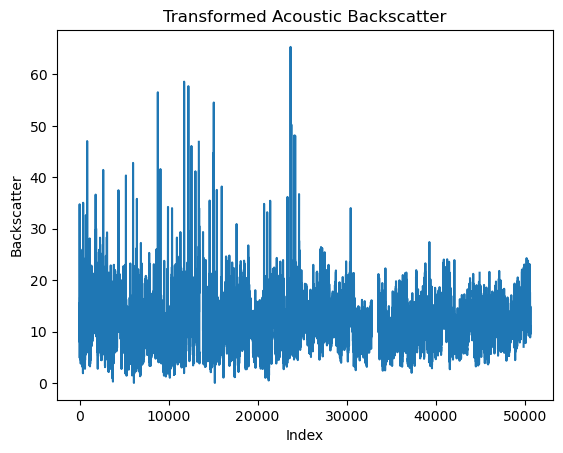

In [32]:
glider_test.big_sv.to_dataframe().reset_index()['big_sv'].plot()
plt.title('Transformed Acoustic Backscatter')
plt.ylabel('Backscatter')
plt.xlabel('Index')

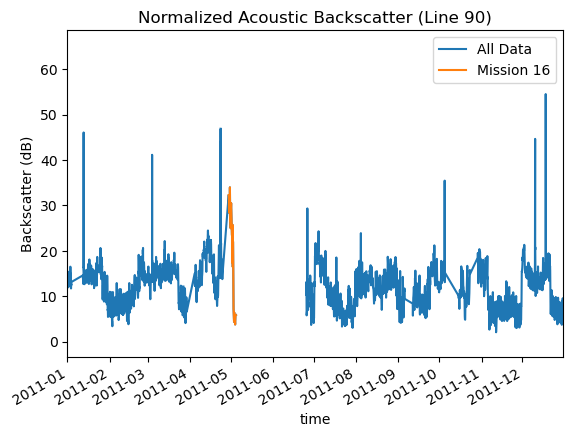

In [11]:
glider = xr.open_dataset(files[1])
glider.close()

#calculate the standardization
glider_std = xr.Dataset()
#loop through each glider mission
for mission in np.unique(glider.mission.values):
    #select out the mission
    temp = glider.where(glider.mission == mission, drop = True)

    #calculate the 1%-tile value
    min_val = temp['acoustic_backscatter'].to_dataframe()['acoustic_backscatter'].quantile(0.01)

    temp = temp.assign(acoustic_backscatter = temp.acoustic_backscatter - min_val)
    temp['acoustic_backscatter'] = xr.where(temp['acoustic_backscatter'] < 0, 0, temp['acoustic_backscatter'])

    glider_std = xr.merge([glider_std, temp])

glider = glider_std.copy()

#convert to linear space
glider = glider.where(glider.depth <= 210, drop = True)#.resample(time = '7D').mean(...)
glider = glider.assign(little_sv = 10**(glider.acoustic_backscatter/10))
glider = glider.mean(dim = 'depth')
glider = glider.assign(big_sv = 10*np.log10(glider.little_sv))

#add in season based on JDate
glider['jdate'] = glider['time'].dt.strftime('%j').astype(int)
glider['season'] = np.nan
glider['season'] = xr.where((glider['jdate'] >= 8) & (glider['jdate'] <= 42), 'Winter', glider['season'])
glider['season'] = xr.where((glider['jdate'] >= 81) & (glider['jdate'] <= 119), 'Spring', glider['season'])
glider['season'] = xr.where((glider['jdate'] >= 185) & (glider['jdate'] <= 233), 'Summer', glider['season'])
glider['season'] = xr.where((glider['jdate'] >= 292) & (glider['jdate'] <= 325), 'Fall', glider['season'])
glider_temp = glider[['big_sv', 'time', 'mission']].to_dataframe().reset_index().set_index('time').sort_index()
glider_temp['big_sv'].plot(label = 'All Data')
glider_temp[glider_temp['mission'] == 16]['big_sv'].plot(label = 'Mission 16')


plt.title('Normalized Acoustic Backscatter (Line 90)')
plt.ylabel('Backscatter (dB)')
plt.legend()
# plt.xlabel('Index')
# plt.xlim(13000, 14000)
plt.xlim(pd.to_datetime('2011-01-01'), pd.to_datetime('2011-12-31'))
plt.savefig('./figures/Normalized_Line90_Mission16_TimeSeries.png', bbox_inches = 'tight', dpi = 300)


In [16]:
glider.where(glider.mission == 16,drop = True).to_dataframe().dropna(subset = 'big_sv').time.dt.date.unique()

array([datetime.date(2011, 4, 29), datetime.date(2011, 4, 30),
       datetime.date(2011, 5, 1), datetime.date(2011, 5, 2),
       datetime.date(2011, 5, 3), datetime.date(2011, 5, 4)], dtype=object)

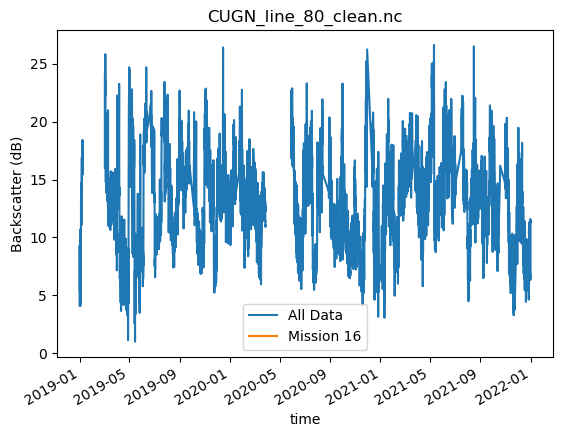

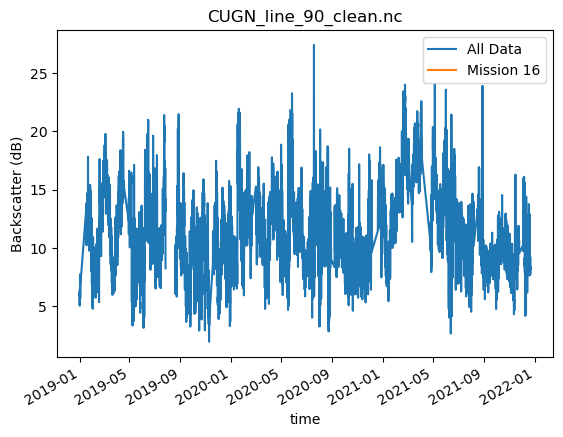

In [10]:
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc']



for i in range(2):
    glider = xr.open_dataset(files[i])
    glider.close()
    glider = glider.where(glider.time.dt.year.isin([2019, 2020, 2021]), drop = True)

    #calculate the standardization
    glider_std = xr.Dataset()
    #loop through each glider mission
    for mission in np.unique(glider.mission.values):
        #select out the mission
        temp = glider.where(glider.mission == mission, drop = True)

        #calculate the 1%-tile value
        min_val = temp['acoustic_backscatter'].to_dataframe()['acoustic_backscatter'].quantile(0.01)

        temp = temp.assign(acoustic_backscatter = temp.acoustic_backscatter - min_val)
        temp['acoustic_backscatter'] = xr.where(temp['acoustic_backscatter'] < 0, 0, temp['acoustic_backscatter'])

        glider_std = xr.merge([glider_std, temp])

    glider = glider_std.copy()

    #convert to linear space
    glider = glider.where(glider.depth <= 210, drop = True)#.resample(time = '7D').mean(...)
    glider = glider.assign(little_sv = 10**(glider.acoustic_backscatter/10))
    glider = glider.mean(dim = 'depth')
    glider = glider.assign(big_sv = 10*np.log10(glider.little_sv))
    
    #add in season based on JDate
    glider['jdate'] = glider['time'].dt.strftime('%j').astype(int)
    glider['season'] = np.nan
    glider['season'] = xr.where((glider['jdate'] >= 8) & (glider['jdate'] <= 42), 'Winter', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 81) & (glider['jdate'] <= 119), 'Spring', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 185) & (glider['jdate'] <= 233), 'Summer', glider['season'])
    glider['season'] = xr.where((glider['jdate'] >= 292) & (glider['jdate'] <= 325), 'Fall', glider['season'])
    glider_temp = glider[['big_sv', 'time', 'mission']].to_dataframe().reset_index().set_index('time').sort_index()
    glider_temp['big_sv'].plot(label = 'All Data')
    glider_temp[glider_temp['mission'] == 16]['big_sv'].plot(label = 'Mission 16')
    
    
    plt.title(files[i].split('/')[-1])#'Normalized Acoustic Backscatter (Line 90)')
    plt.ylabel('Backscatter (dB)')
    plt.legend()
    # plt.xlabel('Index')
    # plt.xlim(13000, 14000)
    # plt.xlim(pd.to_datetime('2020-01-01'), pd.to_datetime('2020-12-31'))
    # plt.savefig('./figures/Normalized_Line90_Mission16_TimeSeries.png', bbox_inches = 'tight', dpi = 300)
    plt.show()

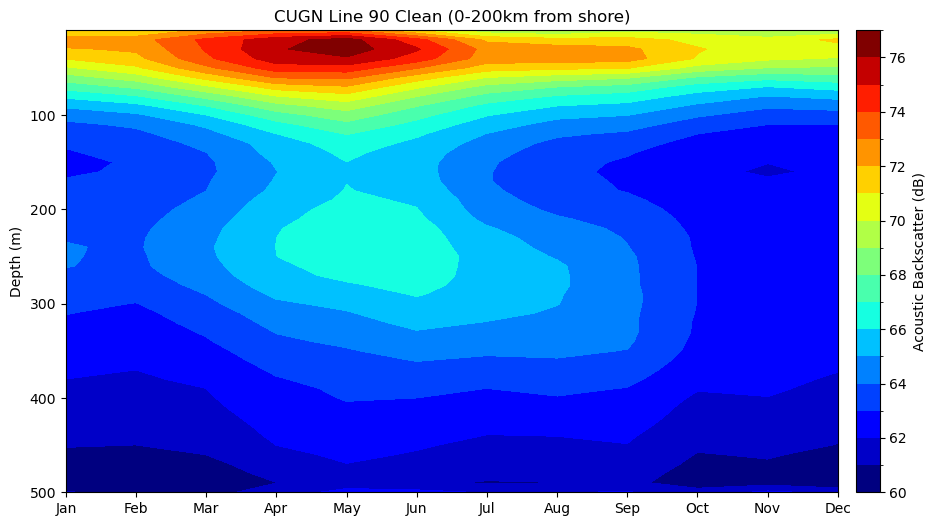

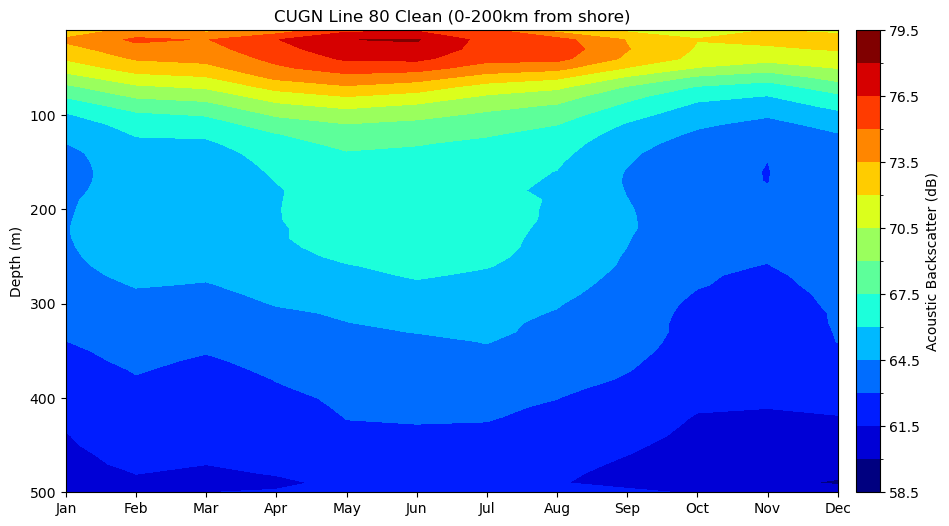

In [45]:
#Monthly Climatology
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc']
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_66.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_56.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_along.nc']

var = 'acoustic_backscatter'

for file in files: 

    glider = xr.open_dataset(file)
    glider.close()

    glider = glider.assign_coords(dist_shore = dist_shore.interp(x = glider.lon, y = glider.lat).band_data)
        
    fig, ax = plt.subplots(1, 1, figsize = (12, 6))
    # temp.where(temp.depth <= 200, drop = True)[var].plot(ax = ax, x = 'time', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    glider_temp = glider.where(glider.depth <= 500, drop = True).where(glider.dist_shore <= 200, drop = True)
    glider_temp.groupby(glider_temp.time.dt.month).mean(dim = ['band', 'profile'])[var].plot.contourf(levels = 18, cmap = 'jet', ax = ax, y = 'depth', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    ax.set_title('CUGN ' + file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0] + ' (0-200km from shore)')
    ax.set_ylabel('Depth (m)')
    ax.set_xlabel(None)
    ax.set_xticks([*range(1, 13)])
    ax.set_xticklabels([calendar.month_abbr[i] for i in range(1, 13)])
    # ax.grid(color = 'lightgrey', linestyle = 'dotted')
    plt.gca().invert_yaxis()
    # plt.savefig('./figures/CUGN_'+file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0]+'_MonthlyClim.png', bbox_inches = 'tight', dpi = 300)
    plt.show()


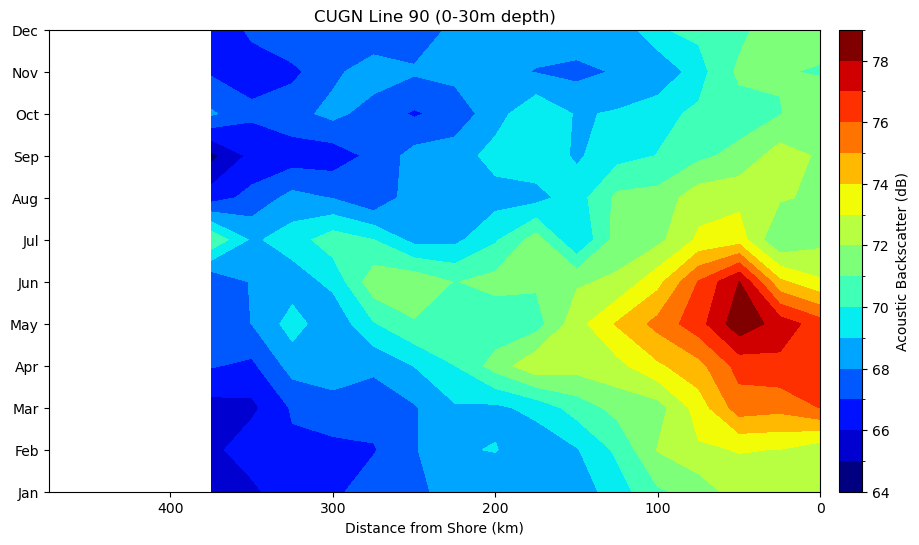

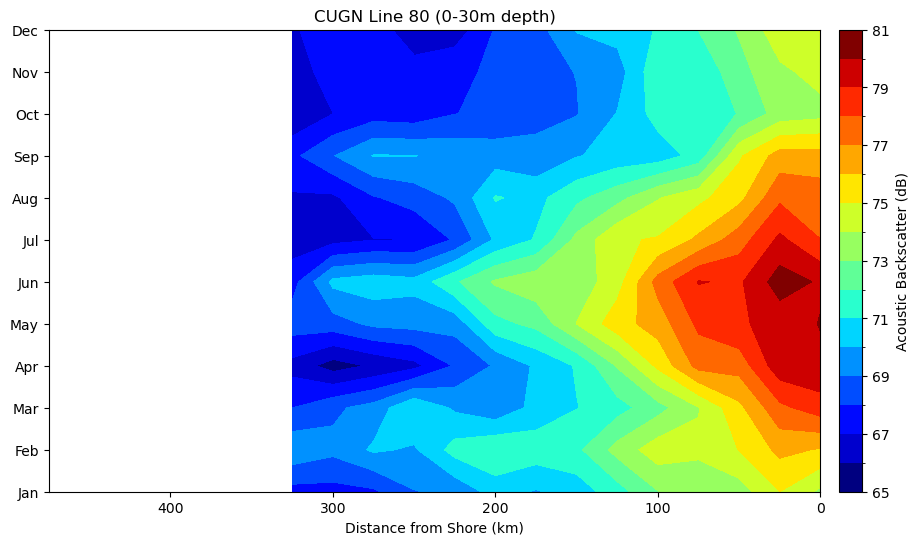

In [99]:
#Monthly Climatology
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/Raw/CUGN_line_90.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/Raw/CUGN_line_80.nc']
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_66.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_56.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_along.nc']

var = 'acoustic_backscatter'

for file in files: 

    glider = xr.open_dataset(file)
    glider.close()

    glider = glider.assign_coords(dist_shore = dist_shore.interp(x = glider.lon, y = glider.lat).band_data)
        
    fig, ax = plt.subplots(1, 1, figsize = (12, 6))
    # temp.where(temp.depth <= 200, drop = True)[var].plot(ax = ax, x = 'time', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    # glider_temp = glider.where(glider.depth <= 500, drop = True).where(glider.dist_shore <= 500, drop = True)
    # glider_temp.groupby(glider_temp.time.dt.month).mean(dim = ['band', 'profile'])[var].plot.contourf(levels = 18, cmap = 'jet', ax = ax, y = 'depth', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})
    glider_df = glider.where(glider.depth <= 30, drop = True)[[var, 'dist_shore']].to_dataframe().dropna(subset = 'acoustic_backscatter').reset_index()#.groupby(glider_temp.time.dt.month).mean(dim = ['band', 'profile'])#.plot.contourf(levels = 18, cmap = 'jet', ax = ax, y = 'depth', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})

    glider_df['dist_shore_lab'] = pd.cut(x=glider_df['dist_shore'], bins=[*range(0, 501, 25)],
                                        labels = [str(i) for i in range(0, 500, 25)]) 
    glider_df['month'] = glider_df.time.dt.month
    glider_df = glider_df.groupby(['dist_shore_lab', 'month']).mean().reset_index()
    glider_df['dist_shore_lab'] = glider_df['dist_shore_lab'].astype(int)
    glider_df.set_index(['dist_shore_lab', 'month']).to_xarray()[var].plot.contourf(levels = 18, ax = ax, cmap = 'jet', y = 'month', cbar_kwargs = {'label':'Acoustic Backscatter (dB)', 'pad':0.02})

    ax.set_title('CUGN ' + file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0] + ' (0-30m depth)')
    ax.set_xlabel('Distance from Shore (km)')
    ax.set_ylabel(None)
    ax.set_yticks([*range(1, 13)])
    ax.set_yticklabels([calendar.month_abbr[i] for i in range(1, 13)])
    # ax.grid(color = 'lightgrey', linestyle = 'dotted')
    plt.gca().invert_xaxis()
    # plt.savefig('./figures/CUGN_'+file.split('CUGN_')[-1].replace('_', ' ').title().split('.Nc')[0]+'_MonthlyClim.png', bbox_inches = 'tight', dpi = 300)
    plt.show()


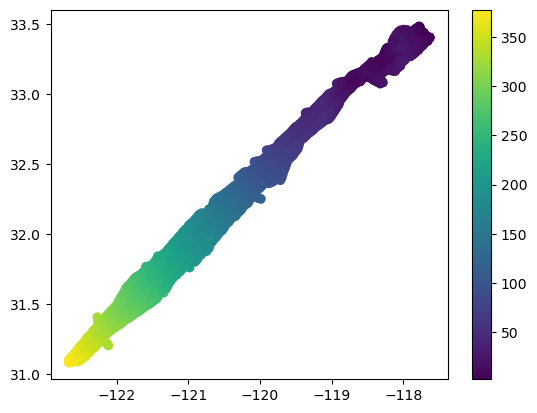

In [119]:
#Monthly Climatology
files = ['/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_90_clean.nc',
         '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/2024_IOOS_GliderZooplankton/data/glider/CUGN_line_80_clean.nc']
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_66.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_line_56.nc',
         # '/Users/gammonkoval/Library/CloudStorage/GoogleDrive-gkoval@faralloninstitute.org/Shared drives/Commons/PROJECTS/IOOS_GliderZooplankton/data/glider/CUGN_along.nc']

var = 'acoustic_backscatter'
 

glider = xr.open_dataset(files[0])
glider.close()

glider = glider.assign_coords(dist_shore = dist_shore.interp(x = glider.lon, y = glider.lat, method = 'nearest').band_data)


temp = glider['dist_shore']['dist_shore'].to_dataframe()
plt.scatter(temp['lon'], temp['lat'], c = temp.iloc[:, -1])
plt.colorbar()

<Axes: >

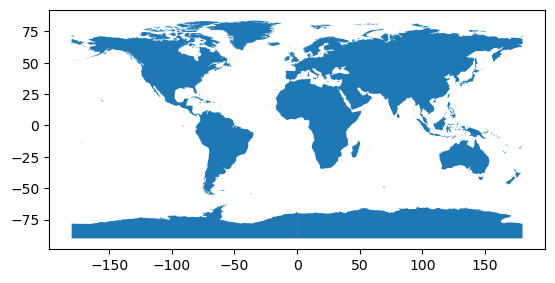

In [125]:
coast = gpd.read_file('/Users/gammonkoval/Downloads/GSHHS_shp/GSHHS_l_L1.shp')
coast.plot()

In [126]:
coast

,id,level,source,parent_id,sibling_id,area,geometry
0,0-E,1,WVS,-1,0,5.065405e+07,"POLYGON ((180.00000 68.99378, 180.00000 64.995..."
1,0-W,1,WVS,-1,0,5.065405e+07,"POLYGON ((-180.00000 68.99378, -179.99844 68.9..."
2,1,1,WVS,-1,1,2.922097e+07,"POLYGON ((32.27833 31.12539, 32.29581 31.21281..."
3,2,1,WVS,-1,2,2.015474e+07,"POLYGON ((-79.97678 9.36489, -79.90649 9.36414..."
4,3,1,WVS,-1,3,1.753416e+07,"POLYGON ((-73.36172 -53.00042, -73.36261 -53.0..."
...,...,...,...,...,...,...,...
5800,8345,1,WVS,-1,182956,4.141138e+01,"POLYGON ((-78.58692 -73.25361, -78.60692 -73.2..."
5801,8719,1,WVS,-1,183345,3.159668e+01,"POLYGON ((-132.52703 -74.19089, -132.53506 -74..."
5802,9549,1,WVS,-1,184256,1.701487e+01,"POLYGON ((168.27136 -76.11786, 168.25925 -76.1..."
5803,9813,1,WVS,-1,184662,1.314602e+01,"POLYGON ((166.90031 -76.97397, 166.87528 -76.9..."
